# Inference of Covid-19 vaccines effectiveness and uncertainty using bayesian methods

## Lorenzo Mandolito 
## Simone Mistrali

## Import libraries 

In [3]:
library(ggplot2)
library(StanHeaders)
library(rjags)
library(coda)
library(dplyr)
library(tibble)
library(tidyr)
library(bayesplot)
library(ggmcmc)
library (tidybayes)
library(bayestestR)

## Vaccine: a brief introduction

A vaccine is a biological preparation that provides active acquired immunity to a particular infectius desease. A vaccine stimulates the body's immune system to recognize its agent (in this case the spike protein) as a threat, destroy it, and to further recognize and destroy any of the microorganisms associated with that agent that it may encounter in the future. 

In this project we want to compute the effectiveness of the four vaccines approved by EMA (**E**uropean **M**edicines **A**gency) the four vaccines are :
1. Comirnaty (BNT162b2) (COVID-19 mRNA vaccine produced by BioNTech/Pfizer);
2. COVID-19 Vaccine Moderna (Moderna Biotech);
3. Vaxzevria (previously COVID-19 Vaccine called AstraZeneca);
4. COVID-19 Vaccine Janssen (Janssen-Cilag International NV)

## What is effectiveness? 

In medicine, effectiveness relates to how well a treatment works in practice, especially as shown in pragmatic clinical trials, as opposed to efficacy, which measures how well it works in explanatory clinical trials or research laboratory studies.

## Quantitative definition

To give a quantitative definition of the effectiveness we will use the following formula:

$$
Eff = \frac{\textbf{$\theta$}_{Placebo} -\textbf{$\theta$}_{Vaccine}}{\textbf{$\theta$}_{Placebo}}*100
$$


## Set up the model for JAGS

We are aware and know that the virus spread "pretty well and quickly" so we have decided to use a $\beta(3,100)$ prior, with $\mu=1$ and $\sigma=18.4$. In the next slide we'll se the `JAGS` model.

In [4]:
modelString <-"
    model {
        for (i in 1:Ntot) {
            tested[i] ~ dbern(theta[patient[i]])
        }
        for (j in 1:Nclass) {
            theta[j] ~ dbeta(3 , 100)
        } 
}
"


We can also try to imagine that we have no prior on the virus, so we can take a uniform prior, so $\beta(1,1)$ $\left(\mu=\frac{1}{2},\sigma=\sqrt{\frac{1}{12}})\right)$ we can see summarized the two prior in the next cell.

Where $\sigma = \sqrt{\dfrac{\alpha \beta}{\left(\alpha + \beta\right)^2\left(\alpha + \beta+1\right)}}$ and $\mu = \dfrac{\alpha}{\alpha+\beta}$.

# Plot of the two prior

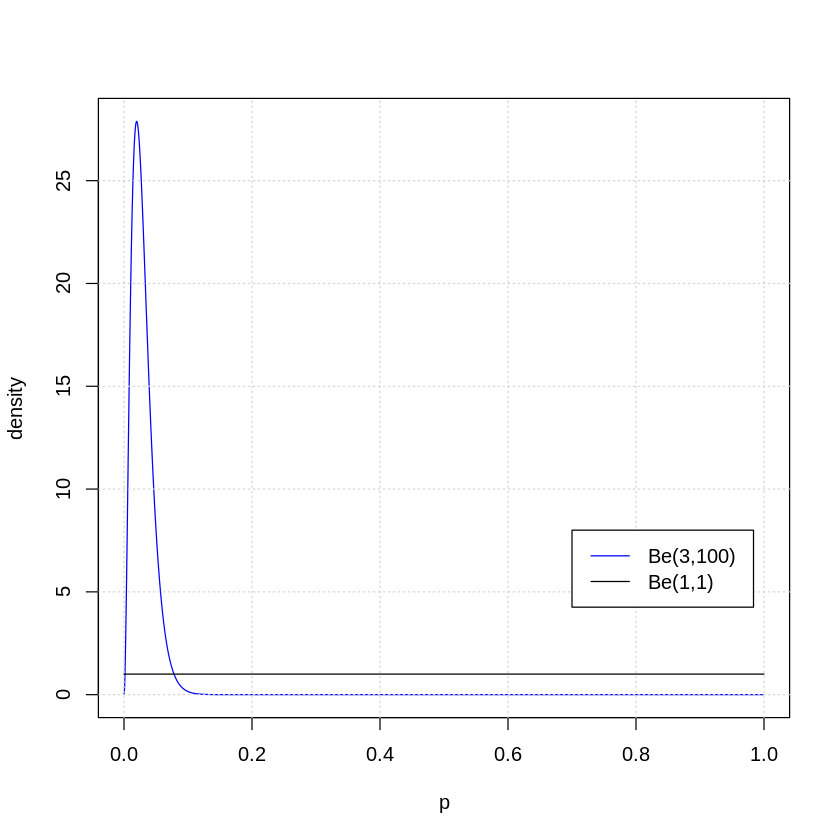

In [5]:
p = seq(0,1, length=1000000)
plot(p, dbeta(p, 3, 100), ylab="density", type ="l", col=4)
lines(p, dbeta(p, 1, 1), col=1) 

grid()
legend(0.7,8, c("Be(3,100)", "Be(1,1)"),lty=c(1,1),col=c(4,1))

We have presented this work with our professor via [$\mathcal{RISE}$](https://rise.readthedocs.io/en/stable/) so there are some duplicated tables.

# Comirnaty AKA Pfizer

## Define the data

In [6]:
tot_Comirnaty_vacc    <- 18198
tot_Comirnaty_placebo <- 18325
patient <- c(rep("vaccine",tot_Comirnaty_vacc),
             rep("placebo",tot_Comirnaty_placebo))
positive_Comirnaty_vacc <- 8
positive_Comirnaty_plac <- 162
tested <- c(rep("pos",positive_Comirnaty_vacc),
          rep("neg",tot_Comirnaty_vacc-positive_Comirnaty_vacc),
          rep("pos",positive_Comirnaty_plac),
          rep("neg",tot_Comirnaty_placebo-positive_Comirnaty_plac))
Comirnaty.tb <- tibble (tested=tested , patient=patient)
table(Comirnaty.tb[[2]],Comirnaty.tb[[1]])

         
            neg   pos
  placebo 18163   162
  vaccine 18190     8

## Set up JAGS' input

In [7]:
datalist = list(tested= ifelse(Comirnaty.tb$tested == "neg",0,1),
               patient = as.integer(factor(Comirnaty.tb$patient)),               
               Ntot = nrow(Comirnaty.tb),
               Nclass = nlevels(factor(Comirnaty.tb$patient)))

## Run JAGS for one chain to see the autocorrelation function

In [8]:
jagsModelComirnaty31 <- jags.model(file = "./jags_model_beta.txt",data=datalist,n.chain=1,n.adapt=500)
update(jagsModelComirnaty31,n.iter=500)

Compiling model graph
   Resolving undeclared variables
   Allocating nodes
Graph information:
   Observed stochastic nodes: 36523
   Unobserved stochastic nodes: 2
   Total graph size: 73052

Initializing model



In the cell below we will start the markov chain.

In [9]:
codaSamples_Comirnaty31 <- coda.samples(jagsModelComirnaty31, variable.names = c("theta"),n.iter = 15000,thin = 1)

In [10]:
S <- ggs(codaSamples_Comirnaty31)

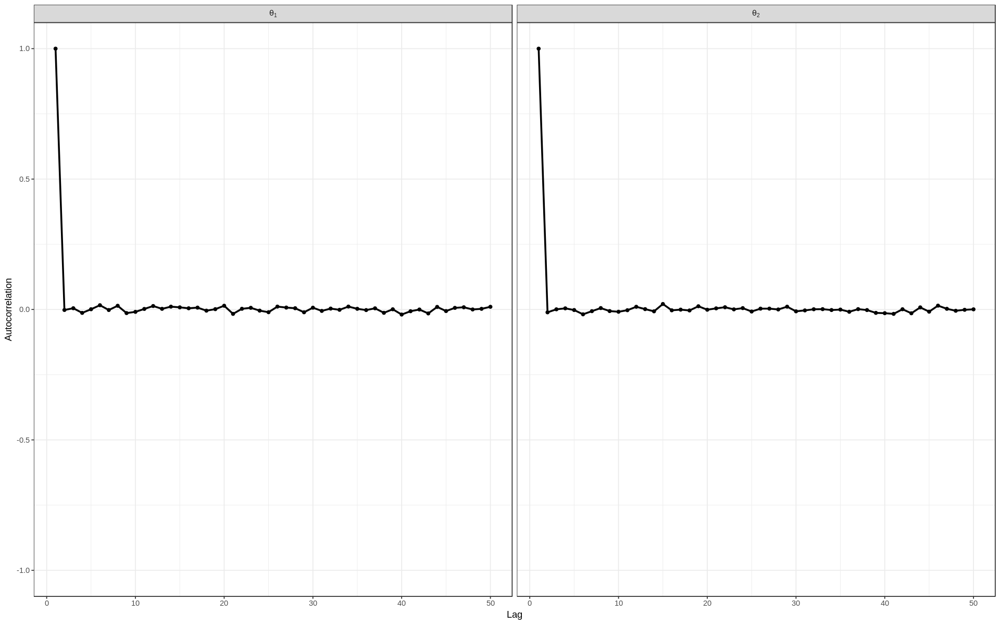

In [11]:
fig(16,10)
ggs_autocorrelationd(S)+geom_line(size=1)+geom_point()+ theme_bw() 

In [12]:
jagsModelComirnaty31 <- jags.model(file = "./jags_model_beta.txt",data=datalist,n.chain=4,n.adapt=500,quiet=TRUE)
update(jagsModelComirnaty31,n.iter=500)
codaSamples_Comirnaty31 <- coda.samples(jagsModelComirnaty31, variable.names = c("theta"),n.iter = 15000,thin = 1)

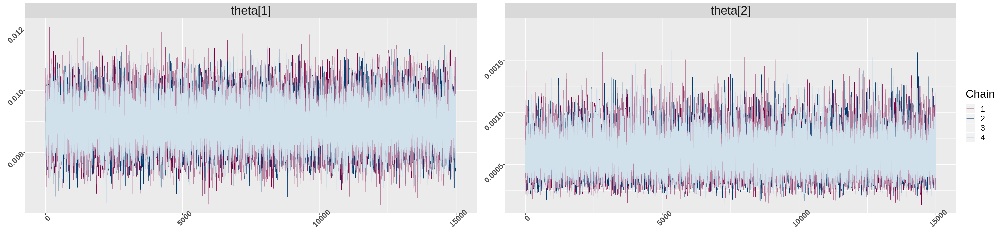

In [13]:
fig(25,6)
color_scheme_set("mix-blue-pink")

p <- mcmc_trace(codaSamples_Comirnaty31) 
p + theme_gray() + facet_text(size = 22) + theme(axis.text.x = element_text(face="bold", size=14, angle=45), 
                                                 axis.text.y = element_text(face="bold", size=14, angle=45),
                                                 legend.title = element_text(size = 20),
                                                 legend.text = element_text(size = 14))

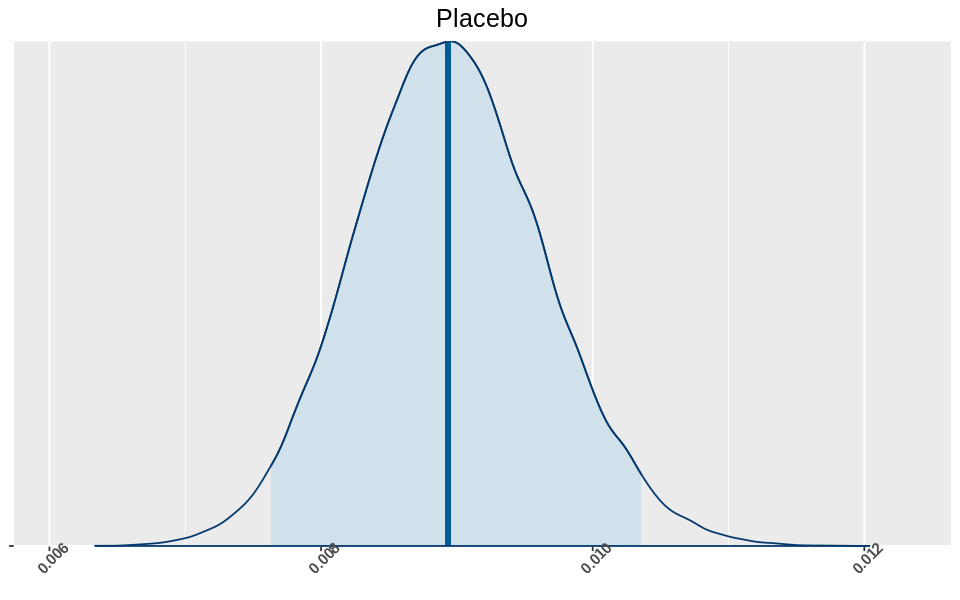

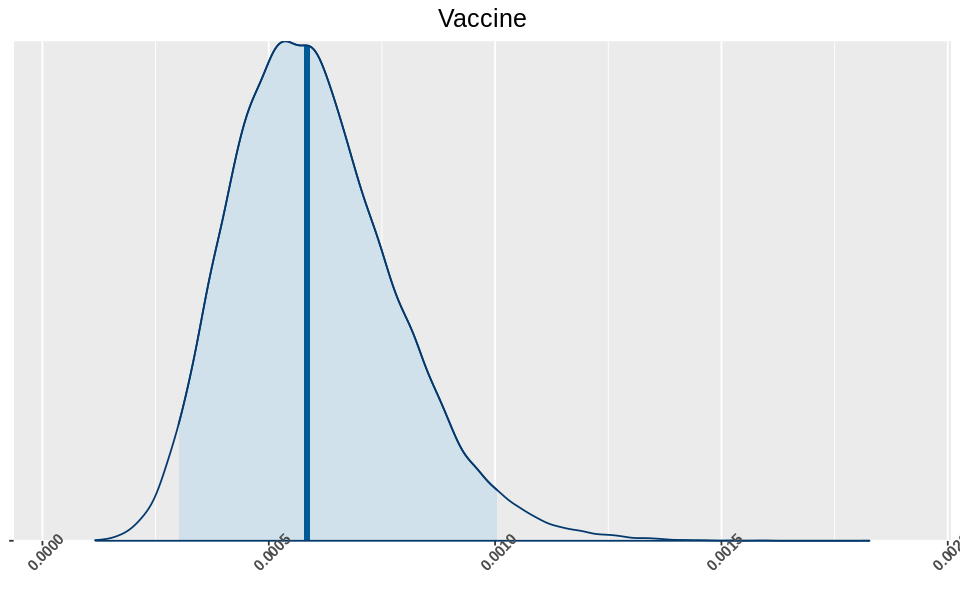

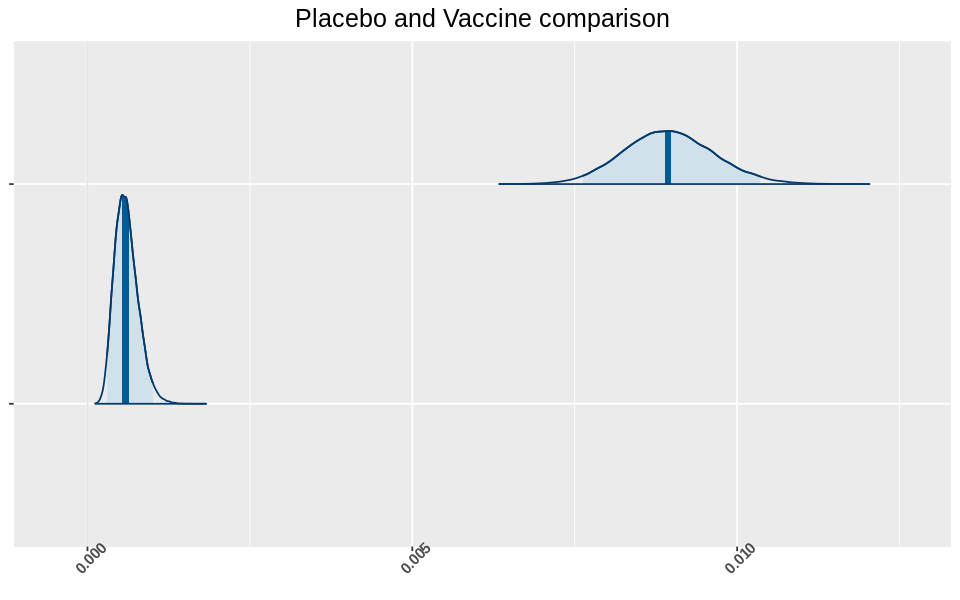

In [14]:
fig(8,5)

mcmc_areas(
  pars = c("theta[1]"),
  codaSamples_Comirnaty31,              
  prob = 0.95) + theme_gray() +ggtitle("Placebo") +
                                theme(axis.text.x = element_text(face="bold", size=9, angle=45), 
                                      axis.text.y = element_blank(),
                                     plot.title = element_text(size = 15, hjust = 0.5 )) 
                                    
                                                 
mcmc_areas(
  pars = c("theta[2]"),
  codaSamples_Comirnaty31,              
  prob = 0.95) + theme_gray() + ggtitle("Vaccine") +
                                theme(axis.text.x = element_text(face="bold", size=9, angle=45), 
                                      axis.text.y = element_blank(),
                                     plot.title = element_text(size = 15, hjust = 0.5 )) 

mcmc_areas(
  pars = c("theta[1]", "theta[2]"),
  codaSamples_Comirnaty31,              
  prob = 0.95)  + theme_gray() + ggtitle("Placebo and Vaccine comparison") +
                                theme(axis.text.x = element_text(face="bold", size=9, angle=45), 
                                      axis.text.y = element_blank(),
                                     plot.title = element_text(size = 15, hjust = 0.5 ))

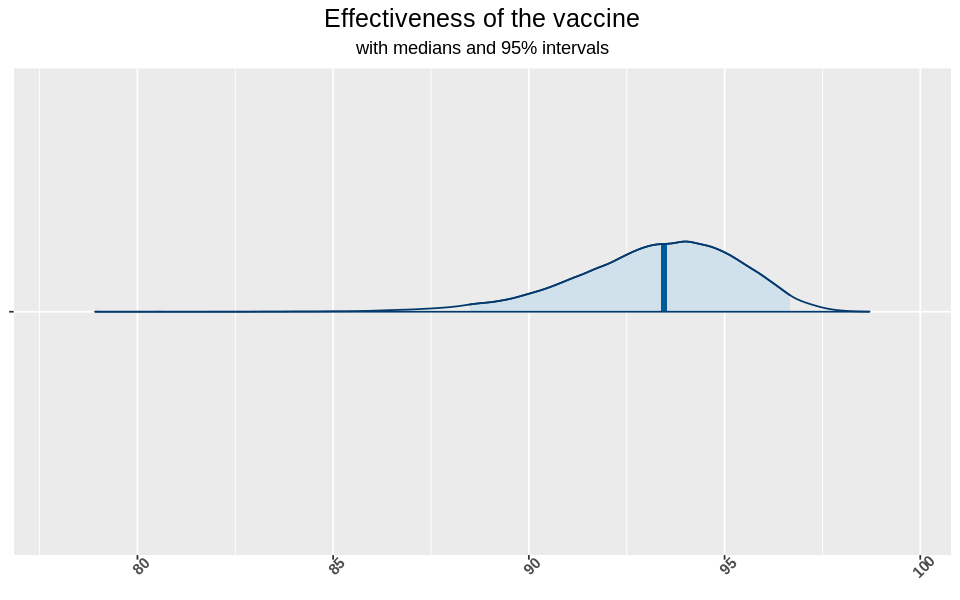

In [15]:
Comirnaty_res <- tidybayes :: tidy_draws ( codaSamples_Comirnaty31 ) %>%
select ( 'theta[1]': 'theta[2]') %>% rename ( Placebo = 'theta[1]', Vaccine = 'theta[2]') %>% mutate (diff_rate = (Placebo-Vaccine ) / Placebo*100,
Placebo_perc = Placebo * 100,
Vaccine_perc = Vaccine * 100)

mcmc_areas(
  pars = c("diff_rate"),
  Comirnaty_res,              
  prob = 0.95) + theme_gray() + theme(axis.text.x = element_text(face="bold", size=9, angle=45), 
                                      axis.text.y = element_blank(),
                                     plot.title = element_text(size = 15, hjust = 0.5 ),
                                     plot.subtitle= element_text(hjust=0.5))+ labs(
                                                            title = "Effectiveness of the vaccine",
                                                            subtitle = "with medians and 95% intervals")                                                  

In [16]:
credInt = 0.95
sPts <- sort( Comirnaty_res[,"diff_rate",1] )
cIdx_step <- ceiling(credInt * length(sPts ))
nCIs <- length(sPts) - cIdx_step
ciWidth <- rep(0, nCIs)
for (j in 1:nCIs) {
    ciWidth[j] <- sPts[ j + cIdx_step ] - sPts[j]
}
HDImin = sPts[ which.min( ciWidth ) ]
HDImax = sPts[ which.min( ciWidth ) + cIdx_step ]
HDIlim_pf = c( HDImin , HDImax )
max_pf <- sPts[which.max(sPts)]
mean_pf <- mean(sPts)
var_pf <- var(sPts)
col <- c("Lower","Upper","Mean","Variance")
recap_pf <- data.frame(HDIlim_pf[1], HDIlim_pf[2], mean_pf, var_pf)
colnames(recap_pf)<- col

recap_pf

Lower,Upper,Mean,Variance
89.0752,97.09298,93.24026,4.457744


## Recap of the interesting quantities of the Effectiveness posterior

| Lower      | Upper |Mean|Variance|
| ----------- | ----------- |-----------|-----------|
| 89.0752      | 97.09298	       |93.24026|4.457744|


## Uniform prior

In [17]:
jagsModelComirnaty31 <- jags.model(file = "./jags_model_flat.txt",data=datalist,n.chain=4,n.adapt=500,quiet=TRUE)
update(jagsModelComirnaty31,n.iter=500)
codaSamples_Comirnaty31 <- coda.samples(jagsModelComirnaty31, variable.names = c("theta"),n.iter = 15000,thin = 1)

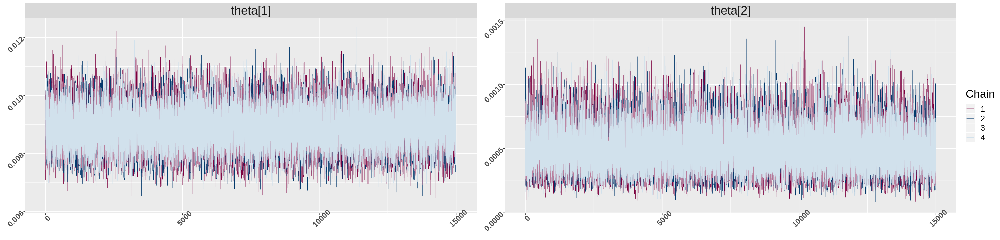

In [18]:
fig(25,6)
color_scheme_set("mix-blue-pink")

p <- mcmc_trace(codaSamples_Comirnaty31) 
p + theme_gray() + facet_text(size = 22) + theme(axis.text.x = element_text(face="bold", size=14, angle=45), 
                                                 axis.text.y = element_text(face="bold", size=14, angle=45),
                                                 legend.title = element_text(size = 20),
                                                 legend.text = element_text(size = 14))

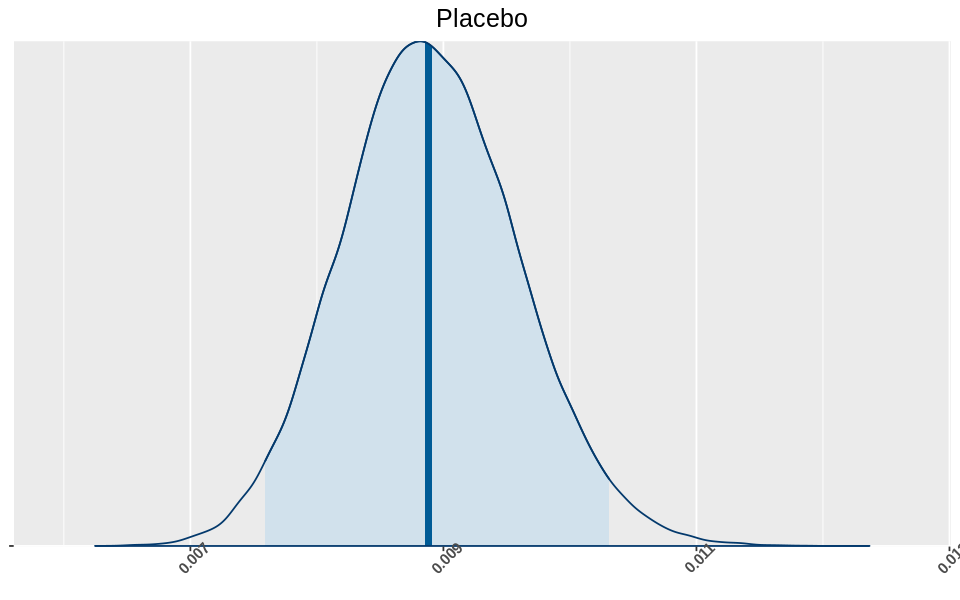

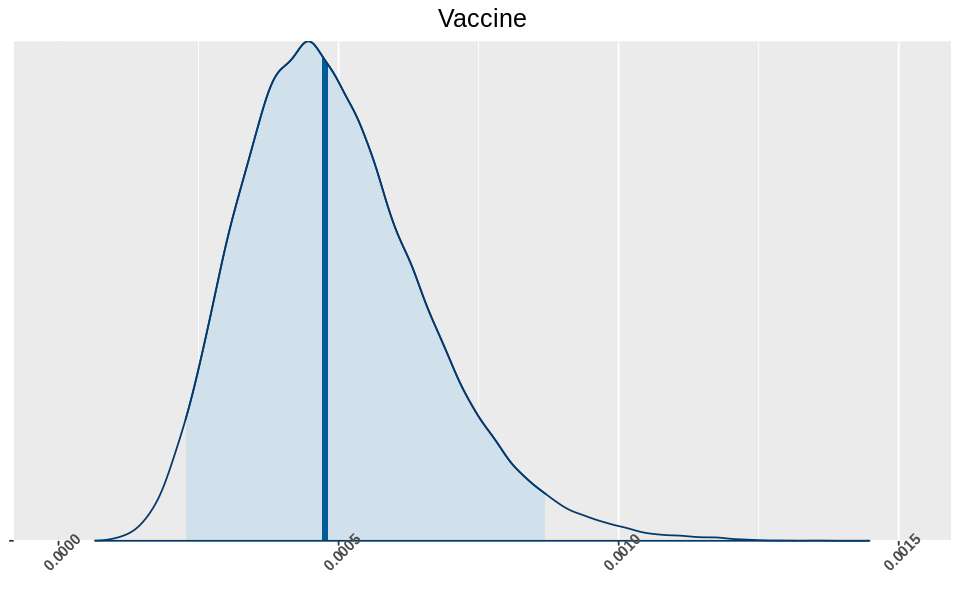

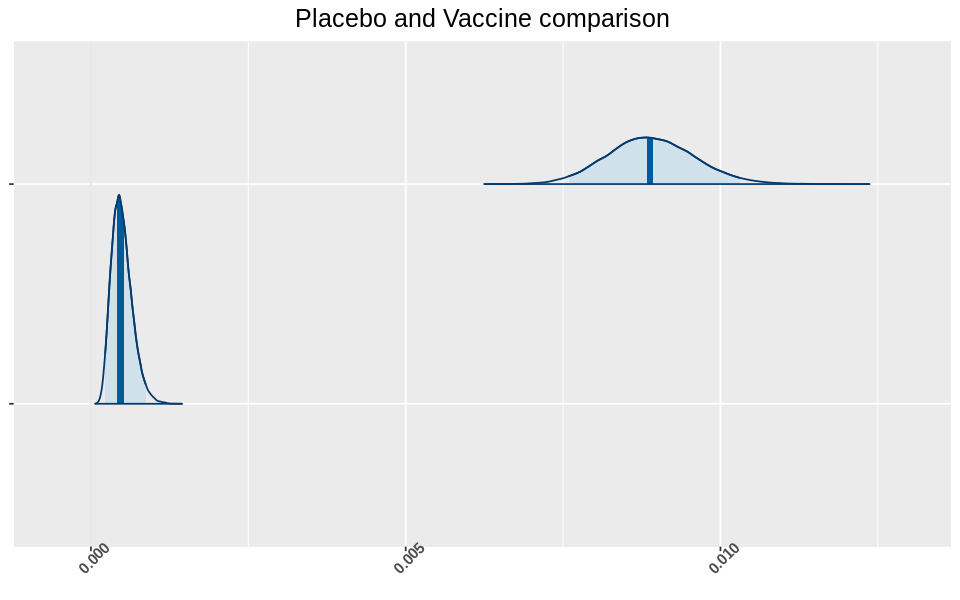

In [19]:
fig(8,5)

mcmc_areas(
  pars = c("theta[1]"),
  codaSamples_Comirnaty31,              
  prob = 0.95) + theme_gray() +ggtitle("Placebo") +
                                theme(axis.text.x = element_text(face="bold", size=9, angle=45), 
                                      axis.text.y = element_blank(),
                                     plot.title = element_text(size = 15, hjust = 0.5 )) 
                                    
                                                 
mcmc_areas(
  pars = c("theta[2]"),
  codaSamples_Comirnaty31,              
  prob = 0.95) + theme_gray() + ggtitle("Vaccine") +
                                theme(axis.text.x = element_text(face="bold", size=9, angle=45), 
                                      axis.text.y = element_blank(),
                                     plot.title = element_text(size = 15, hjust = 0.5 )) 

mcmc_areas(
  pars = c("theta[1]", "theta[2]"),
  codaSamples_Comirnaty31,              
  prob = 0.95)  + theme_gray() + ggtitle("Placebo and Vaccine comparison") +
                                theme(axis.text.x = element_text(face="bold", size=9, angle=45), 
                                      axis.text.y = element_blank(),
                                     plot.title = element_text(size = 15, hjust = 0.5 ))

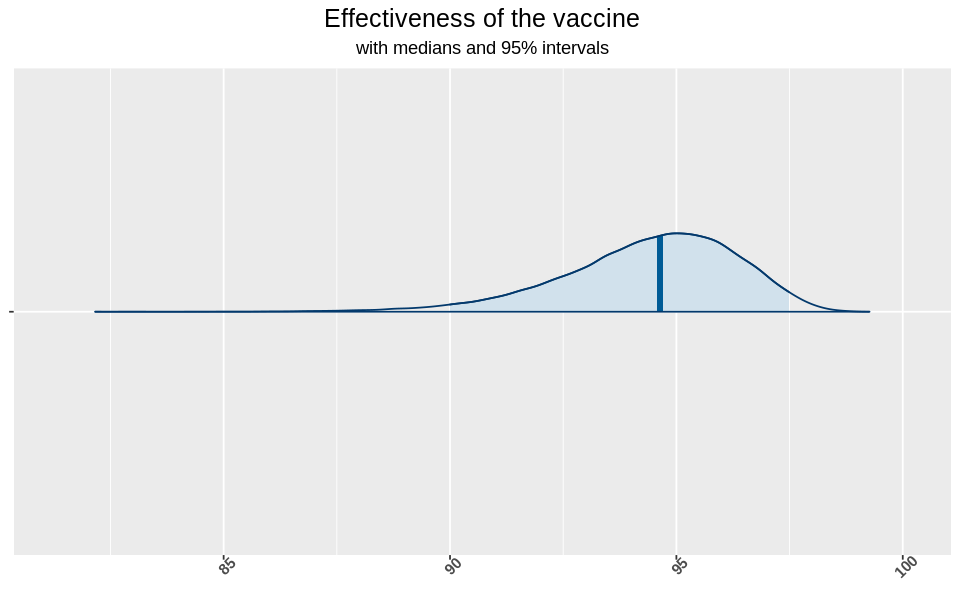

In [20]:
Comirnaty_res <- tidybayes :: tidy_draws ( codaSamples_Comirnaty31 ) %>%
select ( 'theta[1]': 'theta[2]') %>% rename ( Placebo = 'theta[1]', Vaccine = 'theta[2]') %>% mutate (diff_rate = (Placebo-Vaccine ) / Placebo*100,
Placebo_perc = Placebo * 100,
Vaccine_perc = Vaccine * 100)

mcmc_areas(
  pars = c("diff_rate"),
  Comirnaty_res,              
  prob = 0.95) + theme_gray() + theme(axis.text.x = element_text(face="bold", size=9, angle=45), 
                                      axis.text.y = element_blank(),
                                     plot.title = element_text(size = 15, hjust = 0.5 ),
                                     plot.subtitle= element_text(hjust=0.5))+ labs(
                                                            title = "Effectiveness of the vaccine",
                                                            subtitle = "with medians and 95% intervals")                                                  

In [21]:
credInt = 0.95
sPts <- sort( Comirnaty_res[,"diff_rate",1] )
cIdx_step <- ceiling(credInt * length(sPts ))
nCIs <- length(sPts) - cIdx_step
ciWidth <- rep(0, nCIs)
for (j in 1:nCIs) {
    ciWidth[j] <- sPts[ j + cIdx_step ] - sPts[j]
}
HDImin = sPts[ which.min( ciWidth ) ]
HDImax = sPts[ which.min( ciWidth ) + cIdx_step ]
HDIlim_pf_unif = c( HDImin , HDImax )

var_pf_unif <- var(sPts)
col <- c("Lower","Upper","Mean","Variance")

mean_pf_unif <- mean(sPts)
recap_pf_unif <- data.frame(HDIlim_pf_unif[1], HDIlim_pf_unif[2], mean_pf_unif, var_pf_unif)
colnames(recap_pf_unif)<- col

recap_pf_unif

Lower,Upper,Mean,Variance
90.56123,97.79084,94.40848,3.703972


| Lower      | Upper |Mean|Variance|
| ----------- | ----------- |-----------|-----------|
| 90.56123	      | 97.79084       |94.40848	|	3.703972


We can see the comparison of the two prior in this table:

| Prior| Lower      | Upper |Mean|Variance|
|-----------| ----------- | ----------- |-----------|-----------|
|**Flat Prior**| 90.56123   | 97.79084       |94.40848|3.703972|
|**$\beta$ (100,3)** |89.0752      | 97.09298	       |93.24026|4.457744|

We can see that in this case the prior does not effect really the markov chains, so from this point we will use the $\beta(100,3)$.

To get the approvation of the FDA any vaccine need to have an efficency $Eff \ge 50\%$, so we set up a null hypotesis to see if all the vaccines fit this request, we compute the Bayes Factor:

In [22]:
prior <- bayestestR :: distribution_normal(60000, mean = 50, sd = 15)
bayestestR :: bayesfactor_parameters (Comirnaty_res$diff_rate ,
prior ,
direction = "two-sided", null = 50)

Loading required namespace: logspline
Warning message in logspline::logspline(x):
“too much data close together”Warning message in logspline::logspline(x):
“re-ran with oldlogspline”

BF
1.834128e+18


## Moderna

In [23]:
tot_Moderna_vacc    <- 14134

tot_Moderna_plac    <- 14073

patient <- c(rep("vaccine",tot_Moderna_vacc),
             rep("placebo",tot_Moderna_plac))
positive_Moderna_vacc <- 8
positive_Moderna_plac <- 86
tested <- c(rep("pos",positive_Moderna_vacc),
          rep("neg",tot_Moderna_vacc-positive_Moderna_vacc),
          rep("pos",positive_Moderna_plac),
          rep("neg",tot_Moderna_plac-positive_Moderna_plac))
Moderna.tb <- tibble (tested=tested , patient=patient)
table(Moderna.tb[[2]],Moderna.tb[[1]])

         
            neg   pos
  placebo 13987    86
  vaccine 14126     8

|       | neg |pos| 
| ----------- | ----------- | ------|
| placebo      | 13987       |86|
| vaccine   | 14126        |8|

## Set up JAGS' input

In [24]:
datalist = list(tested= ifelse(Moderna.tb$tested == "neg",0,1),
               patient = as.integer(factor(Moderna.tb$patient)),               
               Ntot = nrow(Moderna.tb),
               Nclass = nlevels(factor(Moderna.tb$patient)))

## Run JAGS

In [25]:
jagsModelModerna31 <- jags.model(file = "./jags_model_beta.txt",data=datalist,n.chain=4,n.adapt=500)
 update(jagsModelModerna31,n.iter=500)

Compiling model graph
   Resolving undeclared variables
   Allocating nodes
Graph information:
   Observed stochastic nodes: 28207
   Unobserved stochastic nodes: 2
   Total graph size: 56420

Initializing model



In [26]:
codaSamples_Moderna31 <- coda.samples(jagsModelModerna31, variable.names = c("theta"),n.iter = 15000)

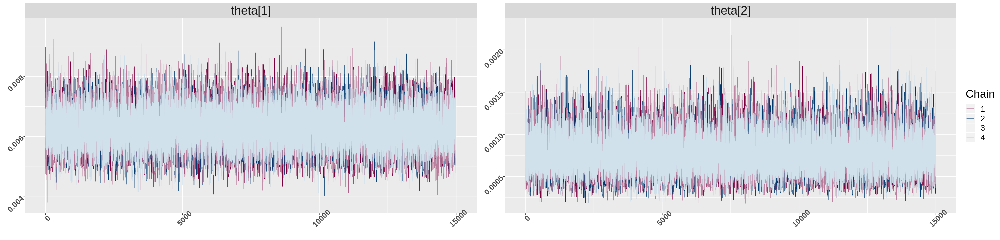

In [27]:
fig(25,6)
color_scheme_set("mix-blue-pink")

p <- mcmc_trace(codaSamples_Moderna31) 
p + theme_gray() + facet_text(size = 22) + theme(axis.text.x = element_text(face="bold", size=14, angle=45), 
                                                 axis.text.y = element_text(face="bold", size=14, angle=45),
                                                 legend.title = element_text(size = 20),
                                                 legend.text = element_text(size = 14))

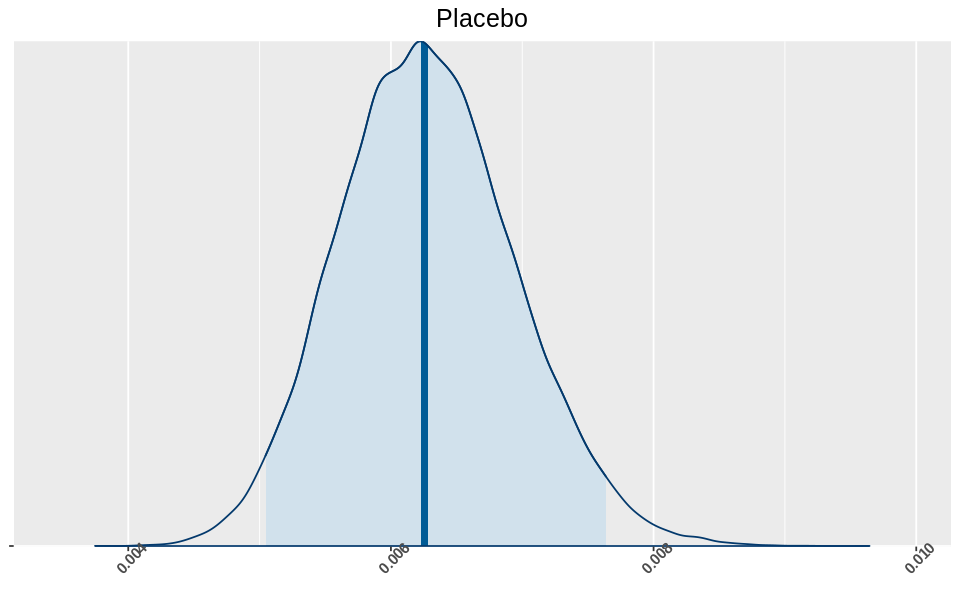

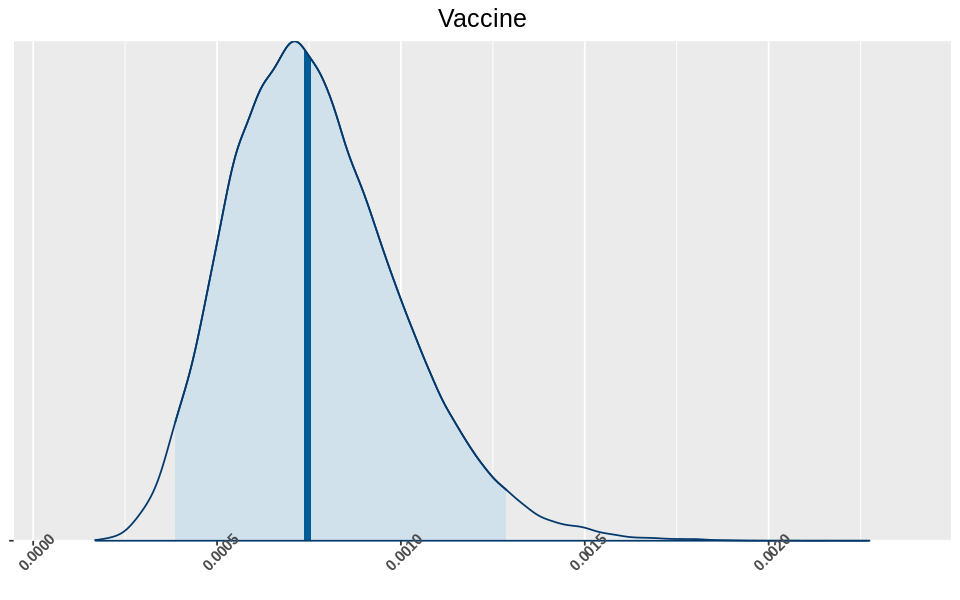

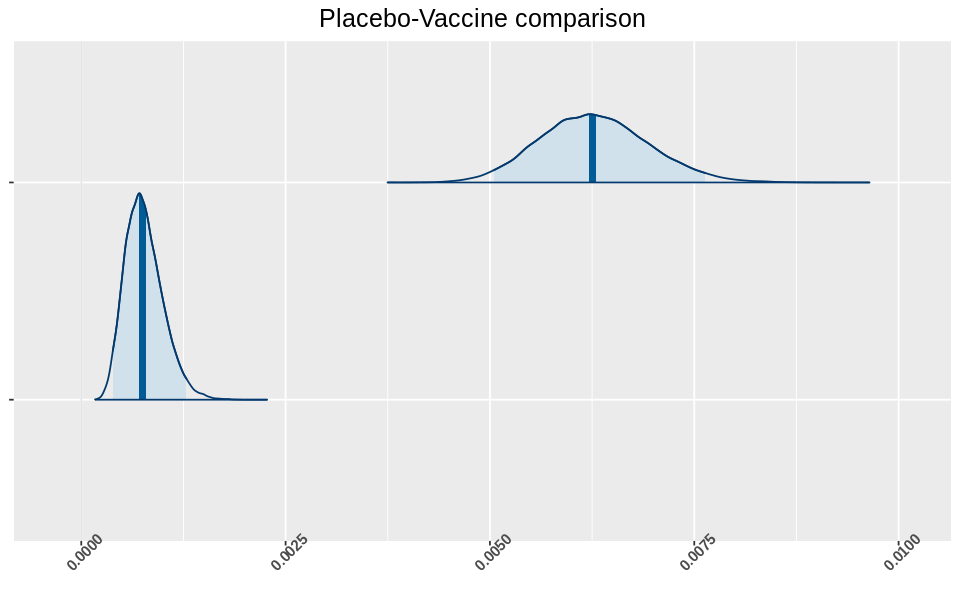

In [28]:
fig(8,5)

mcmc_areas(
  pars = c("theta[1]"),
  codaSamples_Moderna31,              
  prob = 0.95) + theme_gray() +ggtitle("Placebo") +
                                theme(axis.text.x = element_text(face="bold", size=9, angle=45), 
                                      axis.text.y = element_blank(),
                                     plot.title = element_text(size = 15, hjust = 0.5 )) 
                                    
                                                 
mcmc_areas(
  pars = c("theta[2]"),
  codaSamples_Moderna31,              
  prob = 0.95) + theme_gray() + ggtitle("Vaccine") +
                                theme(axis.text.x = element_text(face="bold", size=9, angle=45), 
                                      axis.text.y = element_blank(),
                                     plot.title = element_text(size = 15, hjust = 0.5 )) 

mcmc_areas(
  pars = c("theta[1]", "theta[2]"),
  codaSamples_Moderna31,              
  prob = 0.95)  + theme_gray() + ggtitle("Placebo-Vaccine comparison") +
                                theme(axis.text.x = element_text(face="bold", size=9, angle=45), 
                                      axis.text.y = element_blank(),
                                     plot.title = element_text(size = 15, hjust = 0.5 ))

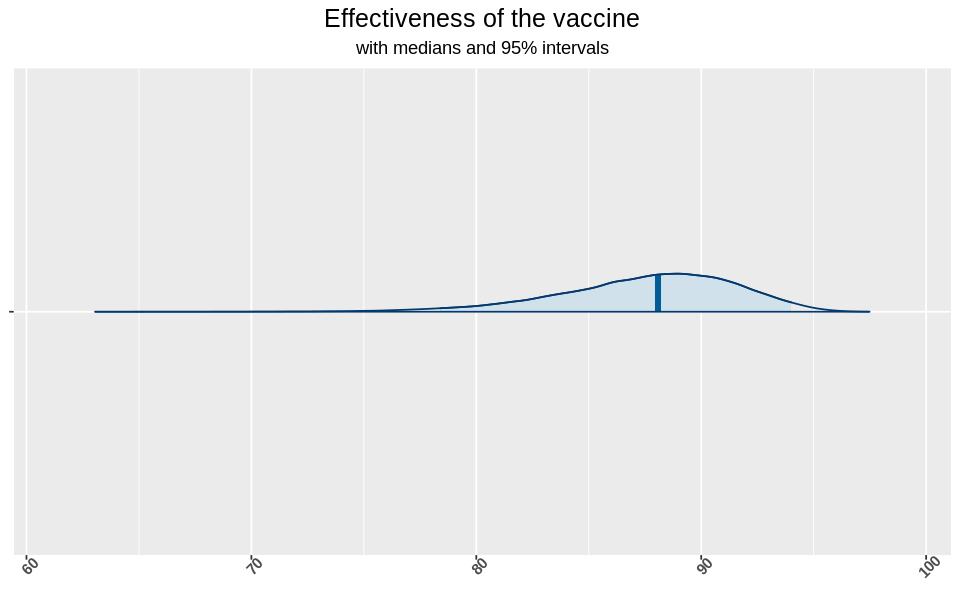

In [29]:
Moderna_res <- tidybayes :: tidy_draws ( codaSamples_Moderna31 ) %>%
select ( 'theta[1]': 'theta[2]') %>% rename ( Placebo = 'theta[1]', Vaccine = 'theta[2]') %>% mutate (diff_rate = (Placebo-Vaccine ) / Placebo*100,
Placebo_perc = Placebo * 100,
Vaccine_perc = Vaccine * 100)
allmcmc2 <- as.mcmc( Moderna_res , vars="diff_rate")

mcmc_areas(
  pars = c("diff_rate"),
  Moderna_res,              
  prob = 0.95) + theme_gray() + theme(axis.text.x = element_text(face="bold", size=9, angle=45), 
                                      axis.text.y = element_blank(),
                                     plot.title = element_text(size = 15, hjust = 0.5 ),
                                     plot.subtitle= element_text(hjust=0.5))+ labs(
                                                            title = "Effectiveness of the vaccine",
                                                            subtitle = "with medians and 95% intervals")  

In [30]:
prior <- bayestestR :: distribution_normal(60000, mean = 50, sd = 15)
bayestestR :: bayesfactor_parameters (Moderna_res$diff_rate ,
prior ,
direction = "two-sided", null = 50)

Warning message in logspline::logspline(x):
“too much data close together”Warning message in logspline::logspline(x):
“re-ran with oldlogspline”

BF
2440570


In [31]:
credInt = 0.95
sPts <- sort( Moderna_res[,"diff_rate",1] )
cIdx_step <- ceiling(credInt * length(sPts ))
nCIs <- length(sPts) - cIdx_step
ciWidth <- rep(0, nCIs)
for (j in 1:nCIs) {
ciWidth[j] <- sPts[ j + cIdx_step ] - sPts[j]
}
HDImin = sPts[ which.min( ciWidth ) ]
HDImax = sPts[ which.min( ciWidth ) + cIdx_step ]
HDIlim_mod = c( HDImin , HDImax )
mean_mod <- mean(sPts)
var_mod <- var(sPts)
col <- c("Lower","Upper","Mean","Variance")
recap_mod <- data.frame(HDIlim_mod[1], HDIlim_mod[2], mean_mod, var_mod)
colnames(recap_mod)<- col

recap_mod

Lower,Upper,Mean,Variance
79.64459,94.7328,87.58114,16.03206


| Lower      | Upper |Mean|Variance|
| ----------- | ----------- |-----------|-----------|
| 79.64459     | 94.7328  |	87.58114|16.03206|

# Astrazeneca

In [32]:
tot_Astrazeneca_vacc    <- 5258

tot_Astrazeneca_plac    <- 5210


patient <- c(rep("vaccine",tot_Astrazeneca_vacc),
             rep("placebo",tot_Astrazeneca_plac))
positive_Astrazeneca_vacc <- 64
positive_Astrazeneca_plac <- 154
tested <- c(rep("pos",positive_Astrazeneca_vacc),
          rep("neg",tot_Astrazeneca_vacc-positive_Astrazeneca_vacc),
          rep("pos",positive_Astrazeneca_plac),
          rep("neg",tot_Astrazeneca_plac-positive_Astrazeneca_plac))
Astrazeneca.tb <- tibble (tested=tested , patient=patient)
table(Astrazeneca.tb[[2]],Astrazeneca.tb[[1]])

         
           neg  pos
  placebo 5056  154
  vaccine 5194   64

|       | neg |pos| 
| ----------- | ----------- | ------|
| placebo      | 5056       |154|
| vaccine   | 5194        |64|

## Set up JAGS' input

In [33]:
datalist = list(tested= ifelse(Astrazeneca.tb$tested == "neg",0,1),
               patient = as.integer(factor(Astrazeneca.tb$patient)),               
               Ntot = nrow(Astrazeneca.tb),
               Nclass = nlevels(factor(Astrazeneca.tb$patient)))

## Run JAGS

In [34]:
jagsModelAstrazeneca <- jags.model(file = "./jags_model_beta.txt",data=datalist,n.chain=4,n.adapt=500,quiet=TRUE)
 update(jagsModelAstrazeneca,n.iter=500)

In [35]:
codaSamples_Astra31 <- coda.samples(jagsModelAstrazeneca, variable.names = c("theta"),n.iter = 15000)

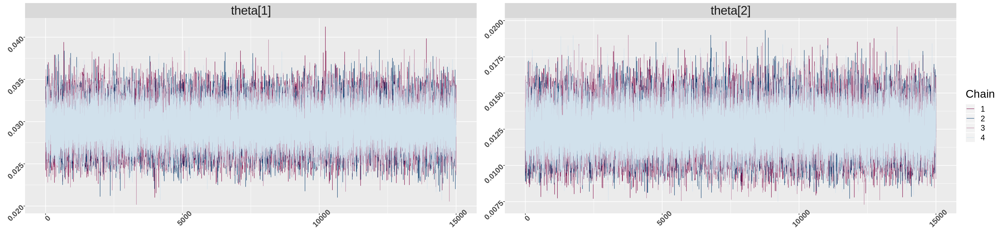

In [36]:
fig(25,6)
color_scheme_set("mix-blue-pink")

p <- mcmc_trace(codaSamples_Astra31) 
p + theme_gray() + facet_text(size = 22) + theme(axis.text.x = element_text(face="bold", size=14, angle=45), 
                                                 axis.text.y = element_text(face="bold", size=14, angle=45),
                                                 legend.title = element_text(size = 20),
                                                 legend.text = element_text(size = 14))

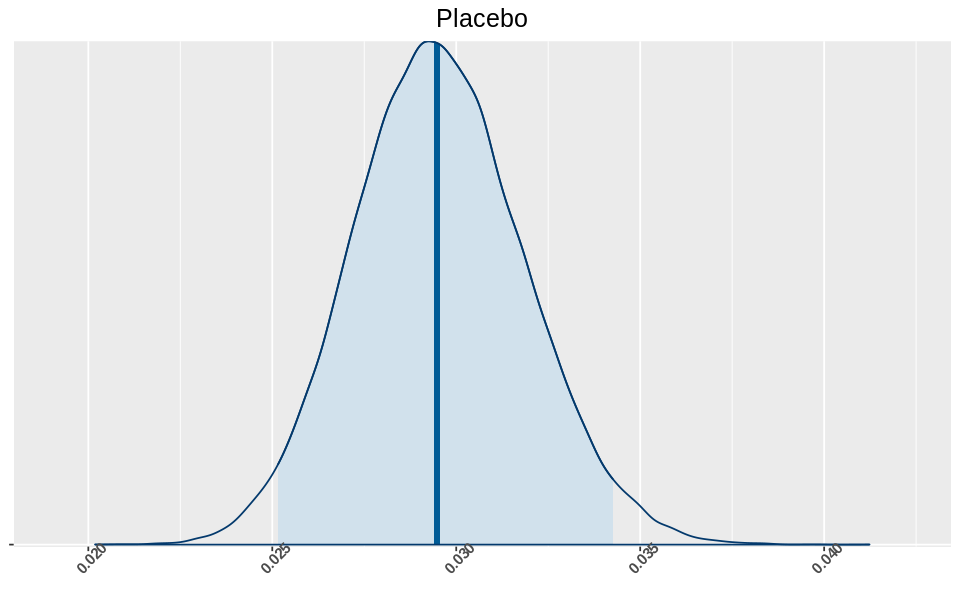

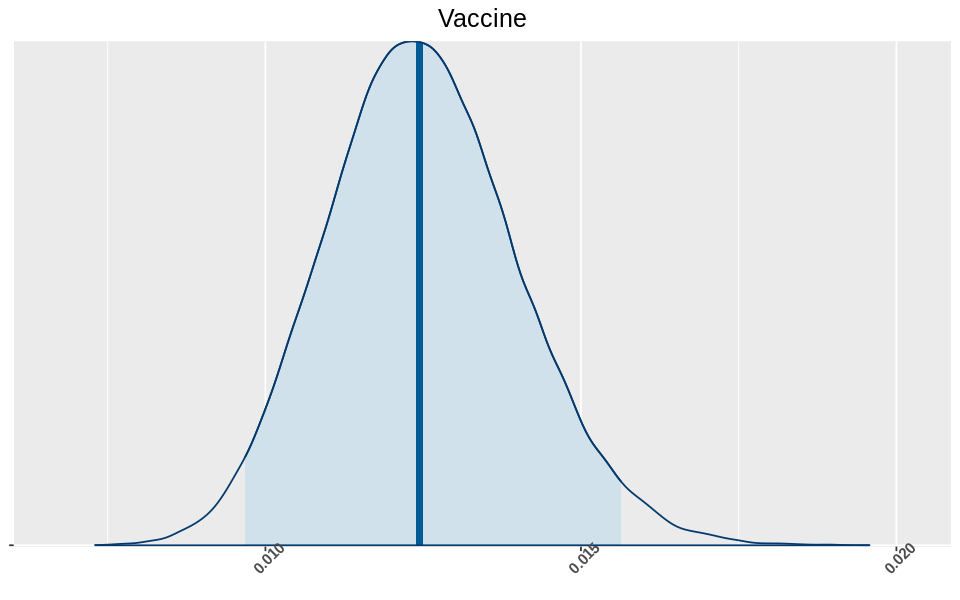

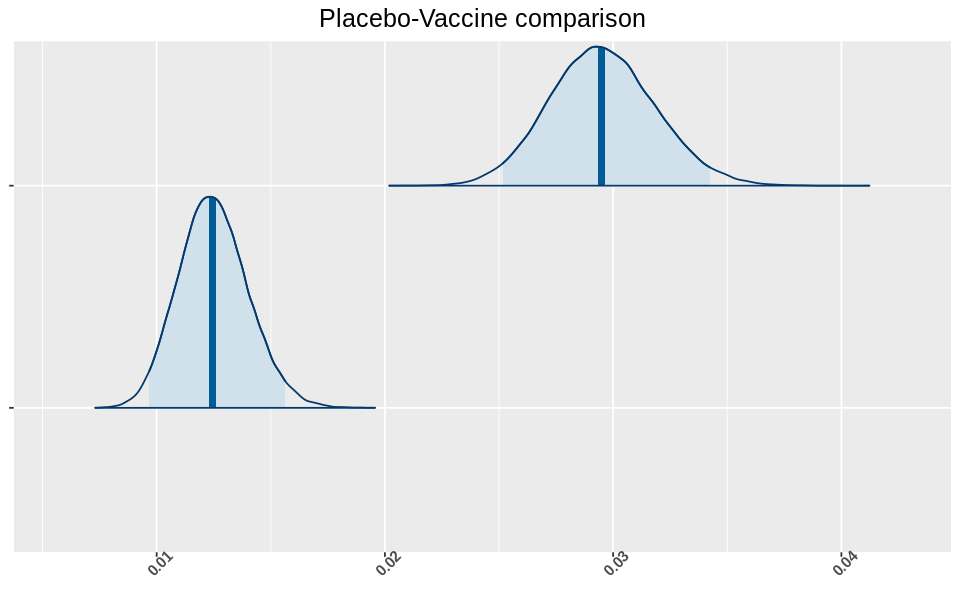

In [37]:
fig(8,5)

mcmc_areas(
  pars = c("theta[1]"),
  codaSamples_Astra31,              
  prob = 0.95) + theme_gray() +ggtitle("Placebo") +
                                theme(axis.text.x = element_text(face="bold", size=9, angle=45), 
                                      axis.text.y = element_blank(),
                                     plot.title = element_text(size = 15, hjust = 0.5 )) 
                                    
                                                 
mcmc_areas(
  pars = c("theta[2]"),
  codaSamples_Astra31,              
  prob = 0.95) + theme_gray() + ggtitle("Vaccine") +
                                theme(axis.text.x = element_text(face="bold", size=9, angle=45), 
                                      axis.text.y = element_blank(),
                                     plot.title = element_text(size = 15, hjust = 0.5 )) 

mcmc_areas(
  pars = c("theta[1]", "theta[2]"),
  codaSamples_Astra31,              
  prob = 0.95)  + theme_gray() + ggtitle("Placebo-Vaccine comparison") +
                                theme(axis.text.x = element_text(face="bold", size=9, angle=45), 
                                      axis.text.y = element_blank(),
                                     plot.title = element_text(size = 15, hjust = 0.5 ))

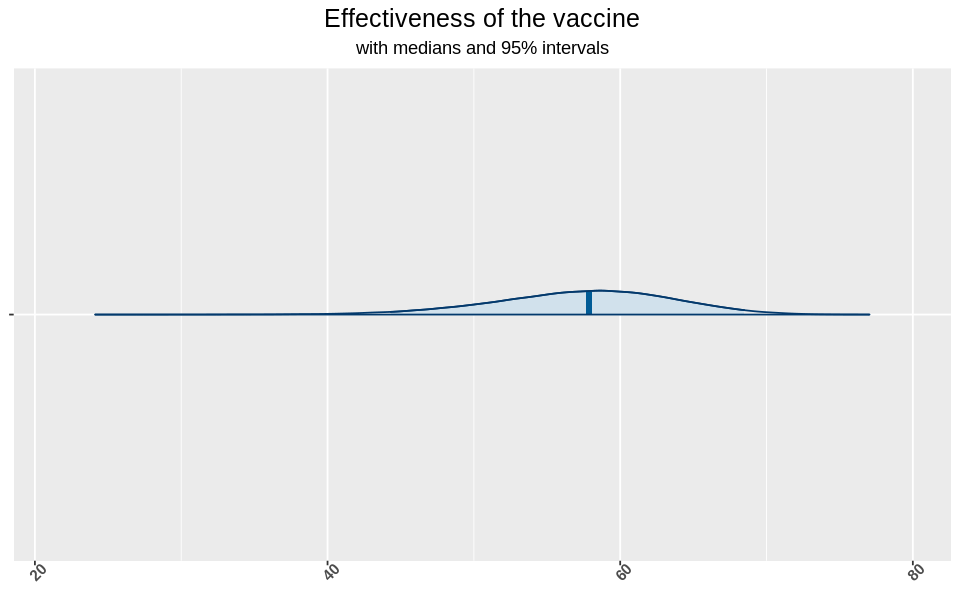

In [38]:
Astra_res <- tidybayes :: tidy_draws ( codaSamples_Astra31 ) %>%
select ( 'theta[1]': 'theta[2]') %>% rename ( Placebo = 'theta[1]', Vaccine = 'theta[2]') %>% mutate (diff_rate = (Placebo-Vaccine ) / Placebo*100,
Placebo_perc = Placebo * 100,
Vaccine_perc = Vaccine * 100)
allmcmc2 <- as.mcmc( Astra_res , vars="diff_rate")

mcmc_areas(
  pars = c("diff_rate"),
  Astra_res,              
  prob = 0.95) + theme_gray() + theme(axis.text.x = element_text(face="bold", size=9, angle=45), 
                                      axis.text.y = element_blank(),
                                     plot.title = element_text(size = 15, hjust = 0.5 ),
                                     plot.subtitle= element_text(hjust=0.5))+ labs(
                                                            title = "Effectiveness of the vaccine",
                                                            subtitle = "with medians and 95% intervals")  

In [39]:
credInt = 0.95
sPts <- sort( Astra_res[,"diff_rate",1] )
cIdx_step <- ceiling(credInt * length(sPts ))
nCIs <- length(sPts) - cIdx_step
ciWidth <- rep(0, nCIs)
for (j in 1:nCIs) {
ciWidth[j] <- sPts[ j + cIdx_step ] - sPts[j]
}
HDImin = sPts[ which.min( ciWidth ) ]
HDImax = sPts[ which.min( ciWidth ) + cIdx_step ]
HDIlim_az = c( HDImin , HDImax )

mean_az <- mean(sPts)
var_az <- var(sPts)
col <- c("Lower","Upper","Mean","Variance")
recap_az <- data.frame(HDIlim_az[1], HDIlim_az[2], mean_az, var_az)
colnames(recap_az)<- col

recap_az

Lower,Upper,Mean,Variance
45.30524,69.22176,57.44747,38.1001


| Lower      | Upper |Mean|Variance|
| ----------- | ----------- |-----------|-----------|
| 45.30524	      | 69.22176	       |	57.44747|38.1001| 


In [40]:
prior <- bayestestR :: distribution_normal(60000, mean = 50, sd = 15)
bayestestR :: bayesfactor_parameters (Astra_res$diff_rate ,
prior ,
direction = "two-sided", null = 50)

Warning message in logspline::logspline(x):
“ Not all models could be fitted”

BF
0.9583846


# J&J

In [41]:
tot_JJ_vacc    <- 19630

tot_JJ_plac    <- 19691 


patient <- c(rep("vaccine",tot_JJ_vacc),
             rep("placebo",tot_JJ_plac))
positive_JJ_vacc <- 116
positive_JJ_plac <- 348
tested <- c(rep("pos",positive_JJ_vacc),
          rep("neg",tot_JJ_vacc-positive_JJ_vacc),
          rep("pos",positive_JJ_plac),
          rep("neg",tot_JJ_plac-positive_JJ_plac))
JJ.tb <- tibble (tested=tested , patient=patient)
datalist = list(tested= ifelse(JJ.tb$tested == "neg",0,1),
               patient = as.integer(factor(JJ.tb$patient)),               
               Ntot = nrow(JJ.tb),
               Nclass = nlevels(factor(JJ.tb$patient)))
jagsModelJJ <- jags.model(file = "./jags_model_beta.txt",data=datalist,n.chain=4,n.adapt=50,quiet=TRUE)
 update(jagsModelJJ,n.iter=500)
codaSamples_JJ31 <- coda.samples(jagsModelJJ, variable.names = c("theta"),n.iter = 15000)

In [42]:
table(JJ.tb[[2]],JJ.tb[[1]])

         
            neg   pos
  placebo 19343   348
  vaccine 19514   116

|       | neg |pos| 
| ----------- | ----------- | ------|
| placebo      | 19343       |348|
| vaccine   | 19514        |116|

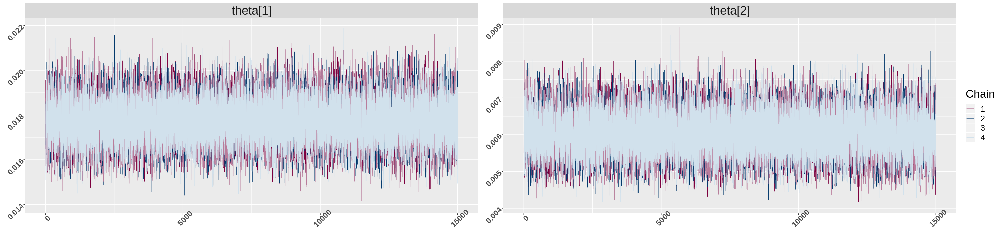

In [43]:
fig(25,6)
color_scheme_set("mix-blue-pink")

p <- mcmc_trace(codaSamples_JJ31) 
p + theme_gray() + facet_text(size = 22) + theme(axis.text.x = element_text(face="bold", size=14, angle=45), 
                                                 axis.text.y = element_text(face="bold", size=14, angle=45),
                                                 legend.title = element_text(size = 20),
                                                 legend.text = element_text(size = 14))

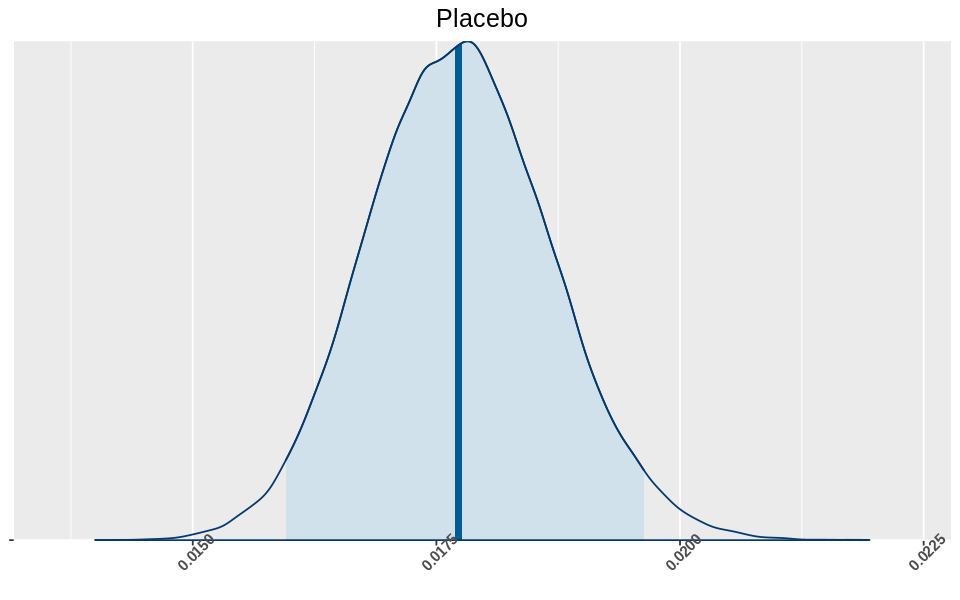

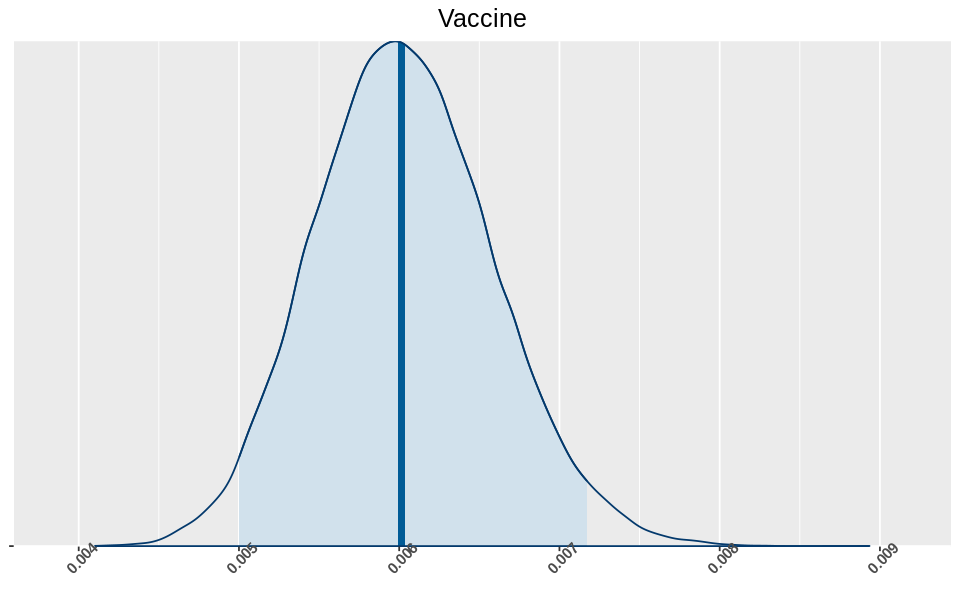

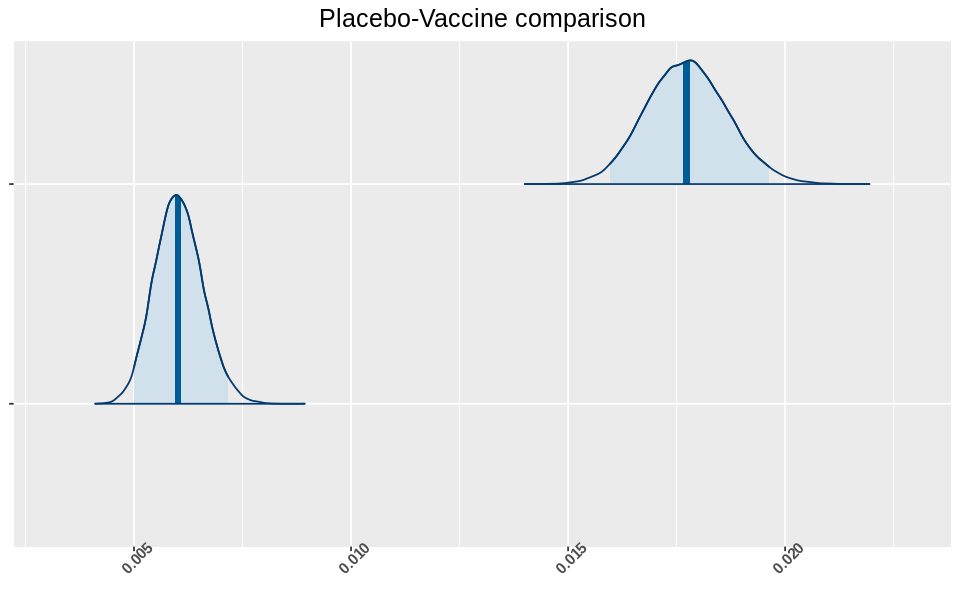

In [44]:
fig(8,5)

mcmc_areas(
  pars = c("theta[1]"),
  codaSamples_JJ31,              
  prob = 0.95) + theme_gray() +ggtitle("Placebo") +
                                theme(axis.text.x = element_text(face="bold", size=9, angle=45), 
                                      axis.text.y = element_blank(),
                                     plot.title = element_text(size = 15, hjust = 0.5 )) 
                                    
                                                 
mcmc_areas(
  pars = c("theta[2]"),
  codaSamples_JJ31,              
  prob = 0.95) + theme_gray() + ggtitle("Vaccine") +
                                theme(axis.text.x = element_text(face="bold", size=9, angle=45), 
                                      axis.text.y = element_blank(),
                                     plot.title = element_text(size = 15, hjust = 0.5 )) 

mcmc_areas(
  pars = c("theta[1]", "theta[2]"),
  codaSamples_JJ31,              
  prob = 0.95)  + theme_gray() + ggtitle("Placebo-Vaccine comparison") +
                                theme(axis.text.x = element_text(face="bold", size=9, angle=45), 
                                      axis.text.y = element_blank(),
                                     plot.title = element_text(size = 15, hjust = 0.5 ))

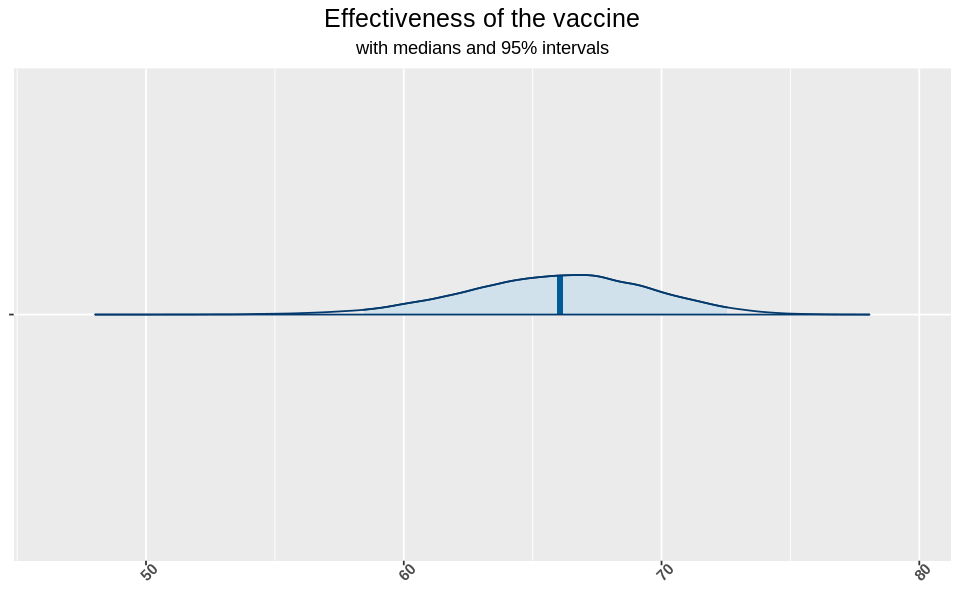

In [45]:
JJ_res <- tidybayes :: tidy_draws ( codaSamples_JJ31 ) %>%
select ( 'theta[1]': 'theta[2]') %>% rename ( Placebo = 'theta[1]', Vaccine = 'theta[2]') %>% mutate (diff_rate = (Placebo-Vaccine ) / Placebo*100,
Placebo_perc = Placebo * 100,
Vaccine_perc = Vaccine * 100)
allmcmc2 <- as.mcmc( JJ_res , vars="diff_rate")

mcmc_areas(
  pars = c("diff_rate"),
  JJ_res,              
  prob = 0.95) + theme_gray() + theme(axis.text.x = element_text(face="bold", size=9, angle=45), 
                                      axis.text.y = element_blank(),
                                     plot.title = element_text(size = 15, hjust = 0.5 ),
                                     plot.subtitle= element_text(hjust=0.5))+ labs(
                                                            title = "Effectiveness of the vaccine",
                                                            subtitle = "with medians and 95% intervals")  

| Lower      | Upper |Mean|Variance|
| ----------- | ----------- |-----------|-----------|
| 58.80869	    | 72.83622       |65.90494	|	13.08011| 

In [46]:
prior <- bayestestR :: distribution_normal(60000, mean = 50, sd = 15)
bayestestR :: bayesfactor_parameters (JJ_res$diff_rate ,
prior ,
direction = "two-sided", null = 50)

BF
336.6728


In [47]:
credInt = 0.95
sPts <- sort( JJ_res[,"diff_rate",1] )
cIdx_step <- ceiling(credInt * length(sPts ))
nCIs <- length(sPts) - cIdx_step
ciWidth <- rep(0, nCIs)
for (j in 1:nCIs) {
ciWidth[j] <- sPts[ j + cIdx_step ] - sPts[j]
}
HDImin = sPts[ which.min( ciWidth ) ]
HDImax = sPts[ which.min( ciWidth ) + cIdx_step ]
HDIlim_jj = c( HDImin , HDImax )

mean_jj <- mean(sPts)
var_jj <- var(sPts)
col <- c("Lower","Upper","Mean","Variance")
recap_jj <- data.frame(HDIlim_jj[1], HDIlim_jj[2], mean_jj, var_jj)
colnames(recap_jj)<- col

recap_jj

Lower,Upper,Mean,Variance
58.80869,72.83622,65.90494,13.08011


# Sputnik V (https://www.ncbi.nlm.nih.gov/pmc/articles/PMC7852454/)

In [48]:
tot_Sput_vacc    <- 14964

tot_Sput_plac    <- 4902


patient <- c(rep("vaccine",tot_Sput_vacc),
             rep("placebo",tot_Sput_plac))
positive_Sput_vacc <- 16
positive_Sput_plac <- 62
tested <- c(rep("pos",positive_Sput_vacc),
          rep("neg",tot_Sput_vacc-positive_Sput_vacc),
          rep("pos",positive_Sput_plac),
          rep("neg",tot_Sput_plac-positive_Sput_plac))
Sput.tb <- tibble (tested=tested , patient=patient)
table(Sput.tb[[2]],
Sput.tb[[1]])

         
            neg   pos
  placebo  4840    62
  vaccine 14948    16

|       | neg |pos| 
| ----------- | ----------- | ------|
| placebo      | 4840       |62|
| vaccine   | 14948        |16|

In [49]:
datalist = list(tested= ifelse(Sput.tb$tested == "neg",0,1),
               patient = as.integer(factor(Sput.tb$patient)),               
               Ntot = nrow(Sput.tb),
               Nclass = nlevels(factor(Sput.tb$patient)))

In [50]:
jagsModelSput <- jags.model(file = "./jags_model_beta.txt",data=datalist,n.chain=4,n.adapt=50,quiet=TRUE)
 update(jagsModelSput,n.iter=500)

In [51]:
codaSamples_Sput31 <- coda.samples(jagsModelSput, variable.names = c("theta"),n.iter = 15000)

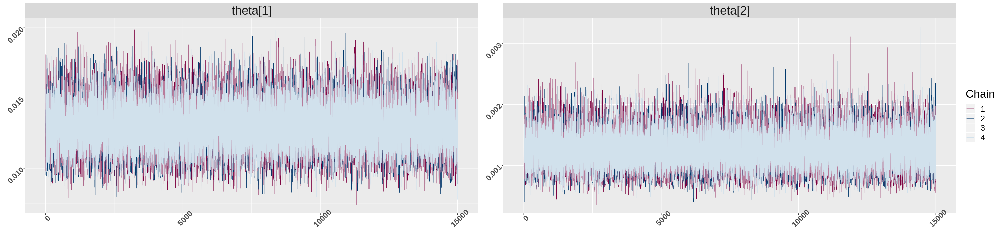

In [52]:
fig(25,6)
color_scheme_set("mix-blue-pink")

p <- mcmc_trace(codaSamples_Sput31) 
p + theme_gray() + facet_text(size = 22) + theme(axis.text.x = element_text(face="bold", size=14, angle=45), 
                                                 axis.text.y = element_text(face="bold", size=14, angle=45),
                                                 legend.title = element_text(size = 20),
                                                 legend.text = element_text(size = 14))

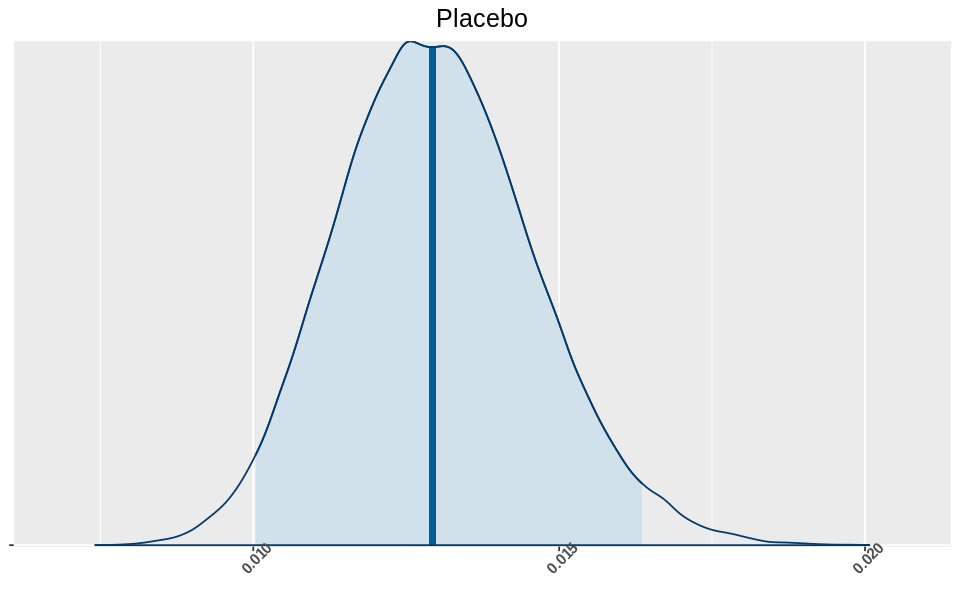

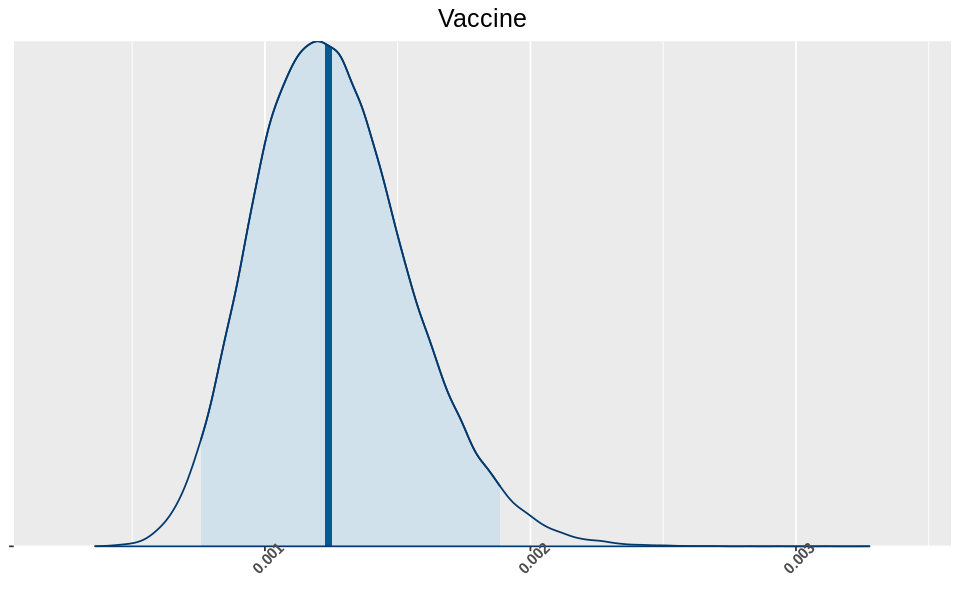

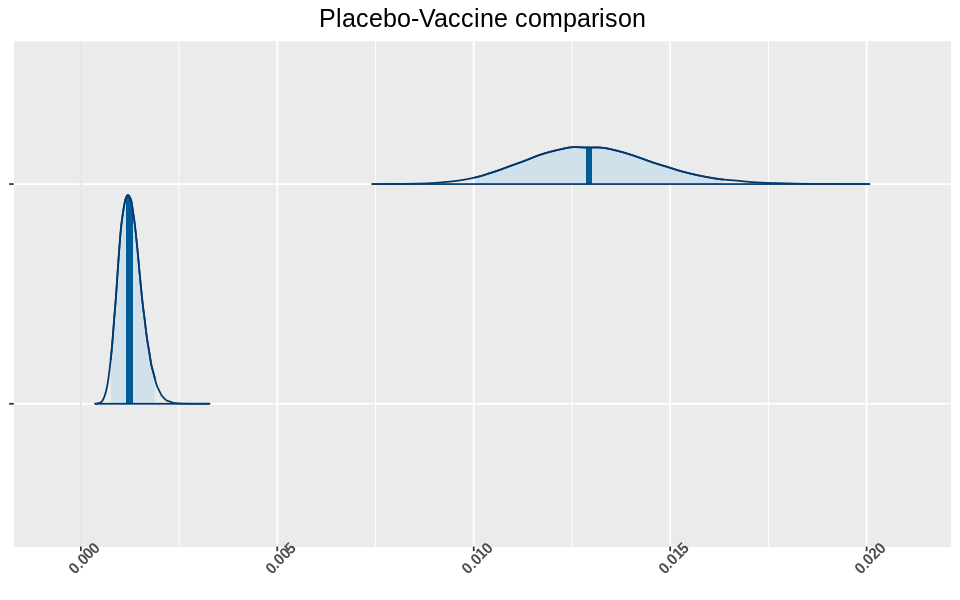

In [53]:
fig(8,5)

mcmc_areas(
  pars = c("theta[1]"),
  codaSamples_Sput31,              
  prob = 0.95) + theme_gray() +ggtitle("Placebo") +
                                theme(axis.text.x = element_text(face="bold", size=9, angle=45), 
                                      axis.text.y = element_blank(),
                                     plot.title = element_text(size = 15, hjust = 0.5 )) 
                                    
                                                 
mcmc_areas(
  pars = c("theta[2]"),
  codaSamples_Sput31,              
  prob = 0.95) + theme_gray() + ggtitle("Vaccine") +
                                theme(axis.text.x = element_text(face="bold", size=9, angle=45), 
                                      axis.text.y = element_blank(),
                                     plot.title = element_text(size = 15, hjust = 0.5 )) 

mcmc_areas(
  pars = c("theta[1]", "theta[2]"),
  codaSamples_Sput31,              
  prob = 0.95)  + theme_gray() + ggtitle("Placebo-Vaccine comparison") +
                                theme(axis.text.x = element_text(face="bold", size=9, angle=45), 
                                      axis.text.y = element_blank(),
                                     plot.title = element_text(size = 15, hjust = 0.5 ))

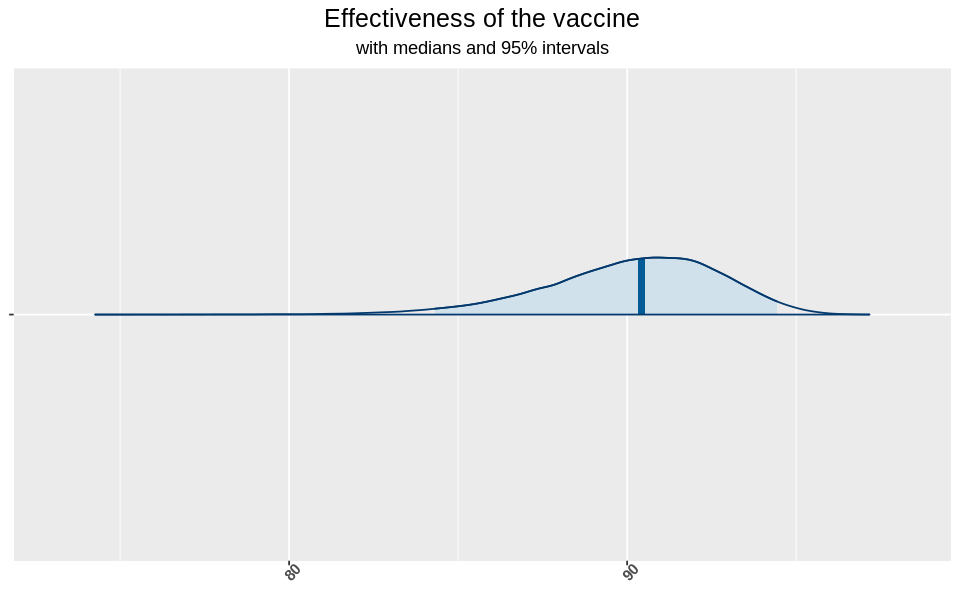

In [54]:
Sput_res <- tidybayes :: tidy_draws ( codaSamples_Sput31 ) %>%
select ( 'theta[1]': 'theta[2]') %>% rename ( Placebo = 'theta[1]', Vaccine = 'theta[2]') %>% mutate (diff_rate = (Placebo-Vaccine ) / Placebo*100,
Placebo_perc = Placebo * 100,
Vaccine_perc = Vaccine * 100)
allmcmc2 <- as.mcmc( Sput_res , vars="diff_rate")

mcmc_areas(
  pars = c("diff_rate"),
  Sput_res,              
  prob = 0.95) + theme_gray() + theme(axis.text.x = element_text(face="bold", size=9, angle=45), 
                                      axis.text.y = element_blank(),
                                     plot.title = element_text(size = 15, hjust = 0.5 ),
                                     plot.subtitle= element_text(hjust=0.5))+ labs(
                                                            title = "Effectiveness of the vaccine",
                                                            subtitle = "with medians and 95% intervals")  

In [56]:
credInt = 0.95
sPts <- sort( Sput_res[,"diff_rate",1] )
cIdx_step <- ceiling(credInt * length(sPts ))
nCIs <- length(sPts) - cIdx_step
ciWidth <- rep(0, nCIs)
for (j in 1:nCIs) {
ciWidth[j] <- sPts[ j + cIdx_step ] - sPts[j]
}
HDImin = sPts[ which.min( ciWidth ) ]
HDImax = sPts[ which.min( ciWidth ) + cIdx_step ]
HDIlim = c( HDImin , HDImax )
HDIlim_sp = c( HDImin , HDImax )

mean_sp <- mean(sPts)
var_sp <- var(sPts)
col <- c("Lower","Upper","Mean","Variance")
recap_sp <- data.frame(HDIlim_sp[1], HDIlim_sp[2], mean_sp, var_sp)
colnames(recap_sp)<- col

recap_sp

Lower,Upper,Mean,Variance
84.94825,94.8517,90.14643,6.770885


| Lower      | Upper |Mean|Variance|
| ----------- | ----------- |-----------|-----------|
|84.94825|	94.8517|	90.14643|	6.770885|

In [55]:
prior <- bayestestR :: distribution_normal(60000, mean = 50, sd = 15)
bayestestR :: bayesfactor_parameters (Sput_res$diff_rate ,
prior ,
direction = "two-sided", null = 50)

Warning message in logspline::logspline(x):
“too much data close together”Warning message in logspline::logspline(x):
“re-ran with oldlogspline”

BF
597145088613


In [57]:
daf <- data.frame()

recap <- rbind(daf, recap_pf,recap_pf_unif,recap_mod,recap_az,recap_jj, recap_sp)
rownames(recap)<-c("Pfizer","Pfizer (uniform prior)", "Moderna", "AstraZeneca","J&J","Sputnik")

recap

,Lower,Upper,Mean,Variance
Pfizer,89.07520,97.09298,93.24026,4.457744
Pfizer (uniform prior),90.56123,97.79084,94.40848,3.703972
Moderna,79.64459,94.73280,87.58114,16.032059
AstraZeneca,45.30524,69.22176,57.44747,38.100102
J&J,58.80869,72.83622,65.90494,13.080107
Sputnik,84.94825,94.85170,90.14643,6.770885


|Vaccine name | Negative placebo |Positive placebo|Negative vaccine |Positive vaccine|
| ----------- | ----------- |-----------|-----------|-----------|
|**Pfizer**| 18163| 162| 18190 |8|
|**Moderna**| 13987| 86| 14126 |8|
|**Astrazeneca**| 5056| 154| 5194 |64|
|**J&J**| 19343| 348| 19514 |116|
|**Sputnik V**| 4840| 62| 14948  |16|

We can see that the adenovirus vaccine seems to be less effective than the mRNA ones.

The Sputnik data seems to be altered, because the **Lower** and the **Upper** bound of the credibility interval are too high for the type of vaccine we are study, we can see also that the two populations (placebo and vaccined people) are significantly different.

# Vaccine age group

## Comirnaty

## Pfizer $<65$

In [12]:
tot_Comirnaty_vaccl65    <- 10653

tot_Comirnaty_placl65    <- 10738


patient <- c(rep("vaccine",tot_Comirnaty_vaccl65),
             rep("placebo",tot_Comirnaty_placl65))
positive_Comirnaty_vaccl65  <- 7
positive_Comirnaty_placl65 <- 64
tested <- c(rep("pos",positive_Comirnaty_vaccl65),
          rep("neg",tot_Comirnaty_vaccl65-positive_Comirnaty_vaccl65),
          rep("pos",positive_Comirnaty_placl65),
          rep("neg",tot_Comirnaty_placl65-positive_Comirnaty_placl65))
Comirnaty_vaccl65.tb <- tibble (tested=tested , patient=patient)
table(Comirnaty_vaccl65.tb[[2]],Comirnaty_vaccl65.tb[[1]])
datalist = list(tested= ifelse(Comirnaty_vaccl65.tb$tested == "neg",0,1),
               patient = as.integer(factor(Comirnaty_vaccl65.tb$patient)),               
               Ntot = nrow(Comirnaty_vaccl65.tb),
               Nclass = nlevels(factor(Comirnaty_vaccl65.tb$patient)))
jagsModelComirnaty_vaccl65 <- jags.model(file = "./jags_model_beta.txt",data=datalist,n.chain=4,n.adapt=500,quiet = TRUE)
update(jagsModelComirnaty_vaccl65,n.iter=500)


         
            neg   pos
  placebo 10674    64
  vaccine 10646     7

|       | neg |pos| 
| ----------- | ----------- | ------|
| placebo      | 10674       |64|
| vaccine   | 10646        |7|

In [13]:
codaSamples_Comirnaty31l65 <- coda.samples(jagsModelComirnaty_vaccl65, variable.names = c("theta"),n.iter = 15000)

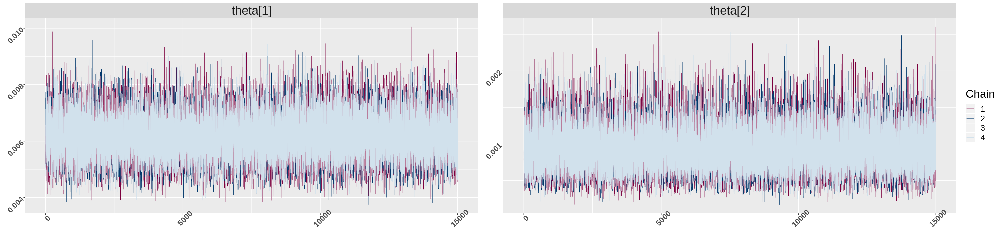

In [14]:
fig(25,6)
color_scheme_set("mix-blue-pink")

p <- mcmc_trace(codaSamples_Comirnaty31l65) 
p + theme_gray() + facet_text(size = 22) + theme(axis.text.x = element_text(face="bold", size=14, angle=45), 
                                                 axis.text.y = element_text(face="bold", size=14, angle=45),
                                                 legend.title = element_text(size = 20),
                                                 legend.text = element_text(size = 14))

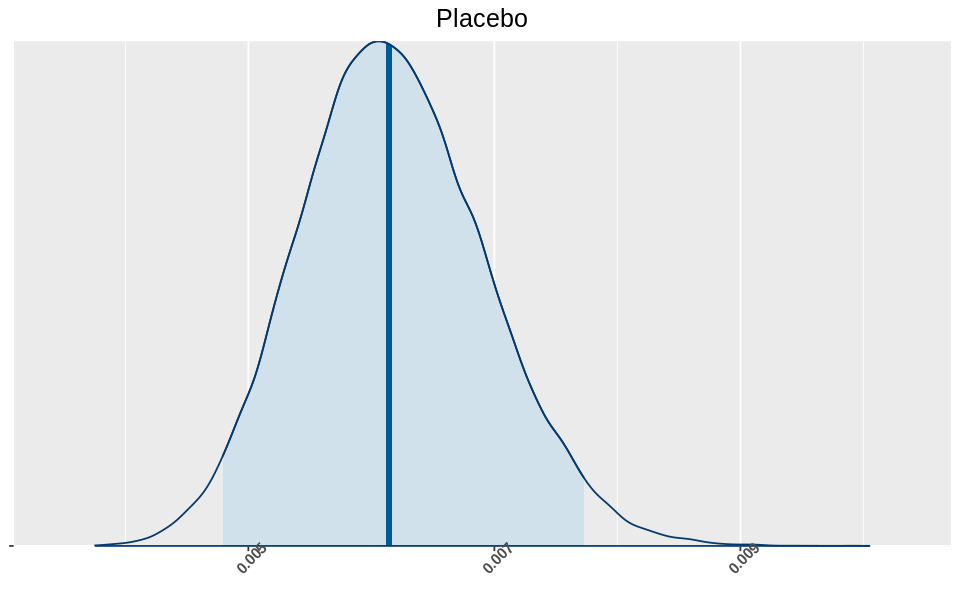

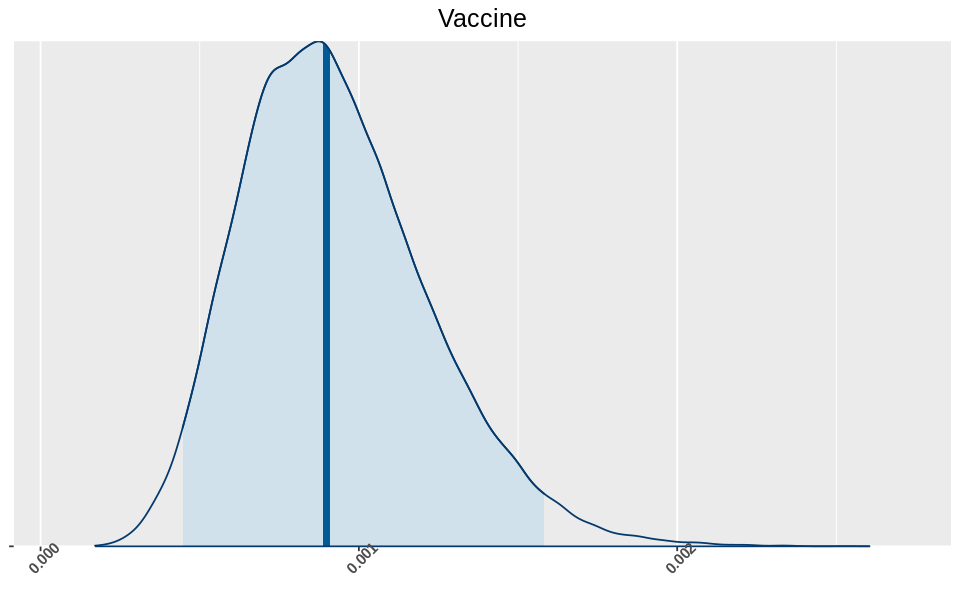

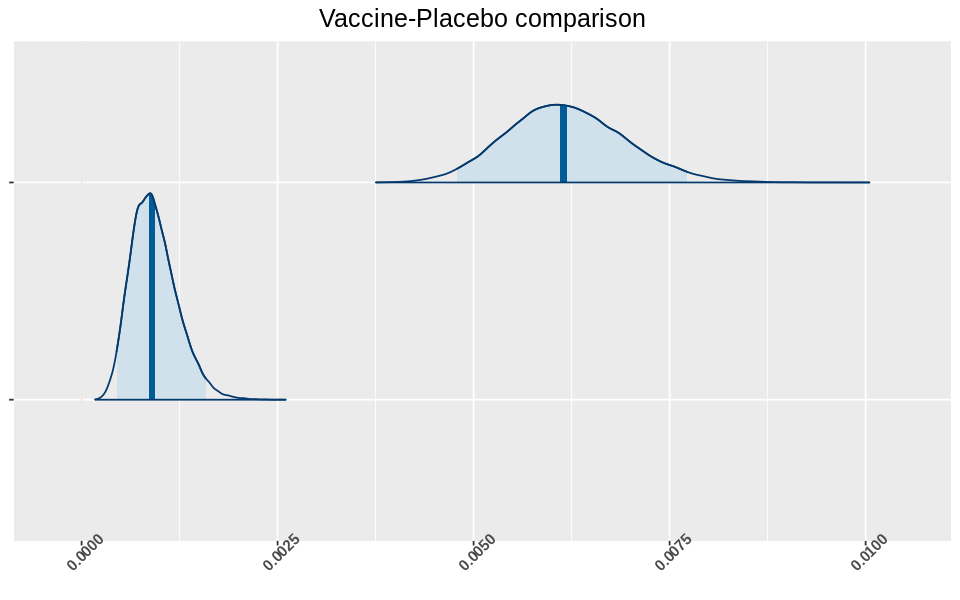

In [15]:
fig(8,5)

mcmc_areas(
  pars = c("theta[1]"),
  codaSamples_Comirnaty31l65,              
  prob = 0.95) + theme_gray() +ggtitle("Placebo") +
                                theme(axis.text.x = element_text(face="bold", size=9, angle=45), 
                                      axis.text.y = element_blank(),
                                     plot.title = element_text(size = 15, hjust = 0.5 )) 
                                    
                                                 
mcmc_areas(
  pars = c("theta[2]"),
  codaSamples_Comirnaty31l65,              
  prob = 0.95) + theme_gray() + ggtitle("Vaccine") +
                                theme(axis.text.x = element_text(face="bold", size=9, angle=45), 
                                      axis.text.y = element_blank(),
                                     plot.title = element_text(size = 15, hjust = 0.5 )) 

mcmc_areas(
  pars = c("theta[1]", "theta[2]"),
  codaSamples_Comirnaty31l65,              
  prob = 0.95)  + theme_gray() + ggtitle("Vaccine-Placebo comparison") +
                                theme(axis.text.x = element_text(face="bold", size=9, angle=45), 
                                      axis.text.y = element_blank(),
                                     plot.title = element_text(size = 15, hjust = 0.5 ))

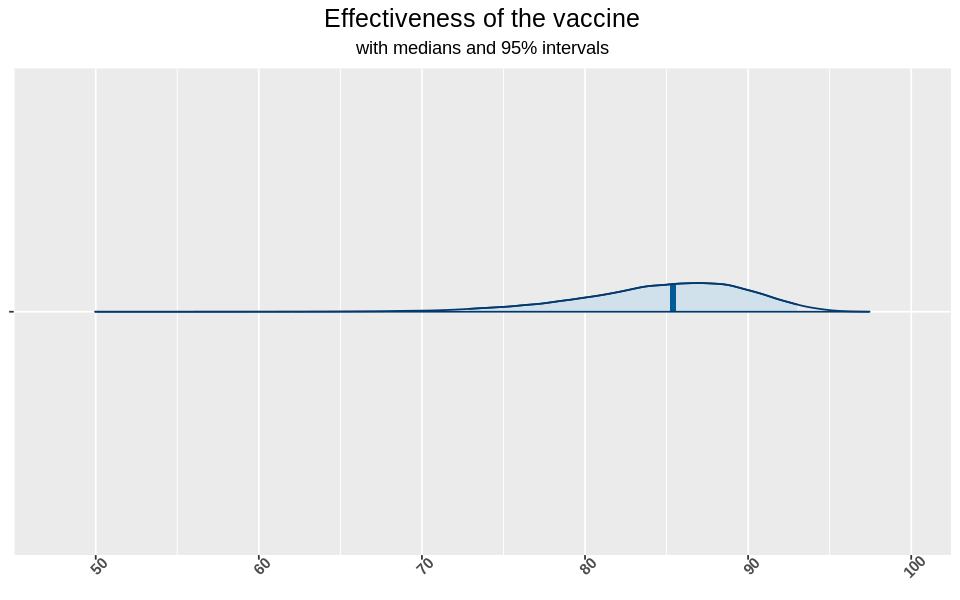

In [16]:
pfizer_res <- tidybayes :: tidy_draws ( codaSamples_Comirnaty31l65 ) %>%
select ( 'theta[1]': 'theta[2]') %>% rename ( Placebo = 'theta[1]', Vaccine = 'theta[2]') %>% mutate (diff_rate = (Placebo-Vaccine ) / Placebo*100,
Placebo_perc = Placebo * 100,
Vaccine_perc = Vaccine * 100)
allmcmc2 <- as.mcmc(pfizer_res, vars="diff_rate")
mcmc_areas(
  pars = c("diff_rate"),
  pfizer_res,              
  prob = 0.95) + theme_gray() + theme(axis.text.x = element_text(face="bold", size=9, angle=45), 
                                      axis.text.y = element_blank(),
                                     plot.title = element_text(size = 15, hjust = 0.5 ),
                                     plot.subtitle= element_text(hjust=0.5))+ labs(
                                                            title = "Effectiveness of the vaccine",
                                                            subtitle = "with medians and 95% intervals")  

| Lower      | Upper |Mean|Variance|
| ----------- | ----------- |-----------|-----------|
|74.49128|	94.10217|	84.73303|	27.29885|

In [17]:
prior <- bayestestR :: distribution_normal(60000, mean = 50, sd = 15)
bayestestR :: bayesfactor_parameters (pfizer_res$diff_rate ,
prior ,
direction = "two-sided", null = 50)

BF
3872.226


In [18]:
credInt = 0.95
sPts <- sort( pfizer_res[,"diff_rate",1] )
cIdx_step <- ceiling(credInt * length(sPts ))
nCIs <- length(sPts) - cIdx_step
ciWidth <- rep(0, nCIs)
for (j in 1:nCIs) {
ciWidth[j] <- sPts[ j + cIdx_step ] - sPts[j]
}
HDImin = sPts[ which.min( ciWidth ) ]
HDImax = sPts[ which.min( ciWidth ) + cIdx_step ]
HDIlim_pfl65= c( HDImin , HDImax )

mean_pfl65 <- mean(sPts)
var_pfl65 <- var(sPts)
col <- c("Lower","Upper","Mean","Variance")
recap_pfl65 <- data.frame(HDIlim_pfl65[1], HDIlim_pfl65[2], mean_pfl65, var_pfl65)
colnames(recap_pfl65)<- col

recap_pfl65

Lower,Upper,Mean,Variance
74.49128,94.10217,84.73303,27.29885


## Pfizer $65 \le age \le 75$

In [19]:
tot_Comirnaty_vacc6575    <- 3239

tot_Comirnaty_plac6575    <- 3255


patient <- c(rep("vaccine",tot_Comirnaty_vacc6575),
             rep("placebo",tot_Comirnaty_plac6575))
positive_Comirnaty_vacc6575  <- 1
positive_Comirnaty_plac6575 <- 14
tested <- c(rep("pos",positive_Comirnaty_vacc6575),
          rep("neg",tot_Comirnaty_vacc6575-positive_Comirnaty_vacc6575),
          rep("pos",positive_Comirnaty_plac6575),
          rep("neg",tot_Comirnaty_plac6575-positive_Comirnaty_plac6575))
Comirnaty_vacc6575.tb <- tibble (tested=tested , patient=patient)
table(Comirnaty_vacc6575.tb[[2]],Comirnaty_vacc6575.tb[[1]])
datalist = list(tested= ifelse(Comirnaty_vacc6575.tb$tested == "neg",0,1),
               patient = as.integer(factor(Comirnaty_vacc6575.tb$patient)),               
               Ntot = nrow(Comirnaty_vacc6575.tb),
               Nclass = nlevels(factor(Comirnaty_vacc6575.tb$patient)))
jagsModelComirnaty_vacc6575 <- jags.model(file = "./jags_model_beta.txt",data=datalist,n.chain=4,n.adapt=1000,quiet=TRUE)
update(jagsModelComirnaty_vacc6575 ,n.iter=1000)


         
           neg  pos
  placebo 3241   14
  vaccine 3238    1

|       | neg |pos| 
| ----------- | ----------- | ------|
| placebo      | 3241       |14|
| vaccine   | 3238        | 1|

In [20]:
codaSamples_Comirnaty31_6575 <- coda.samples(jagsModelComirnaty_vacc6575, variable.names = c("theta"),n.iter = 15000,quiet=TRUE)

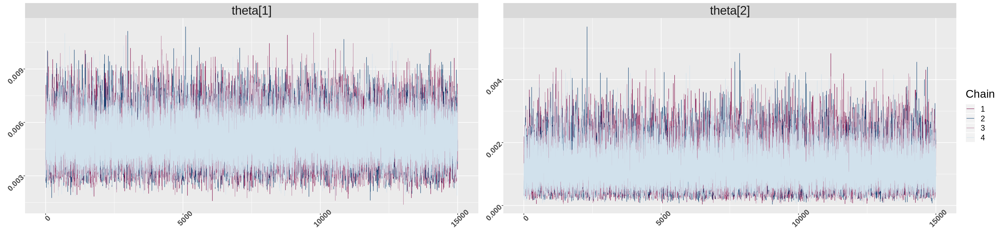

In [21]:
fig(25,6)
color_scheme_set("mix-blue-pink")

p <- mcmc_trace(codaSamples_Comirnaty31_6575) 
p + theme_gray() + facet_text(size = 22) + theme(axis.text.x = element_text(face="bold", size=14, angle=45), 
                                                 axis.text.y = element_text(face="bold", size=14, angle=45),
                                                 legend.title = element_text(size = 20),
                                                 legend.text = element_text(size = 14))

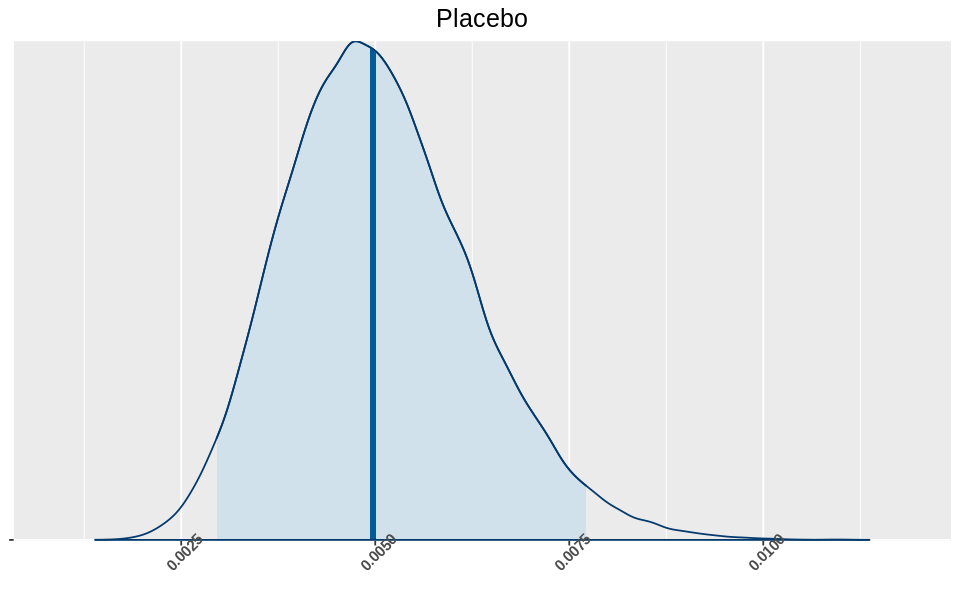

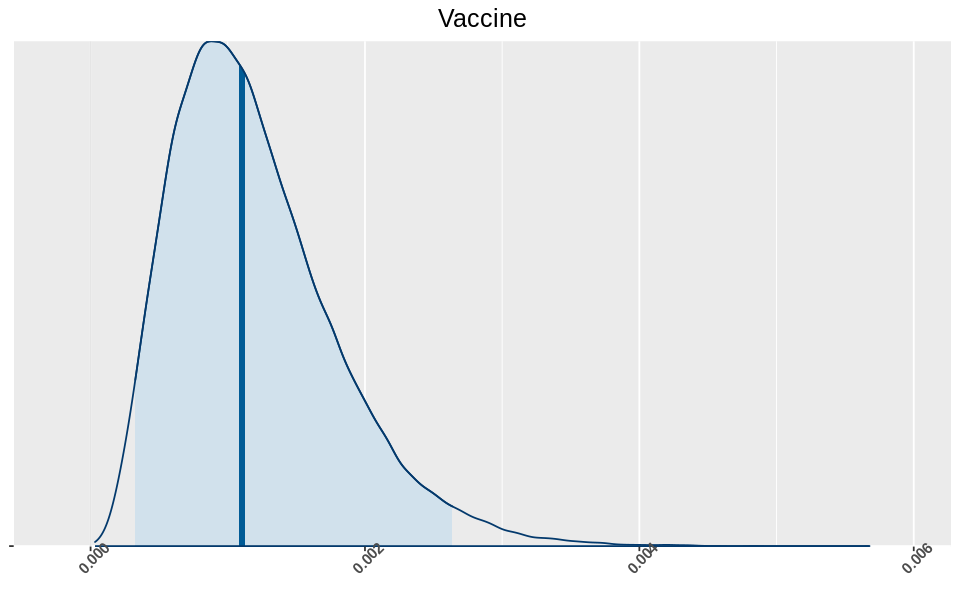

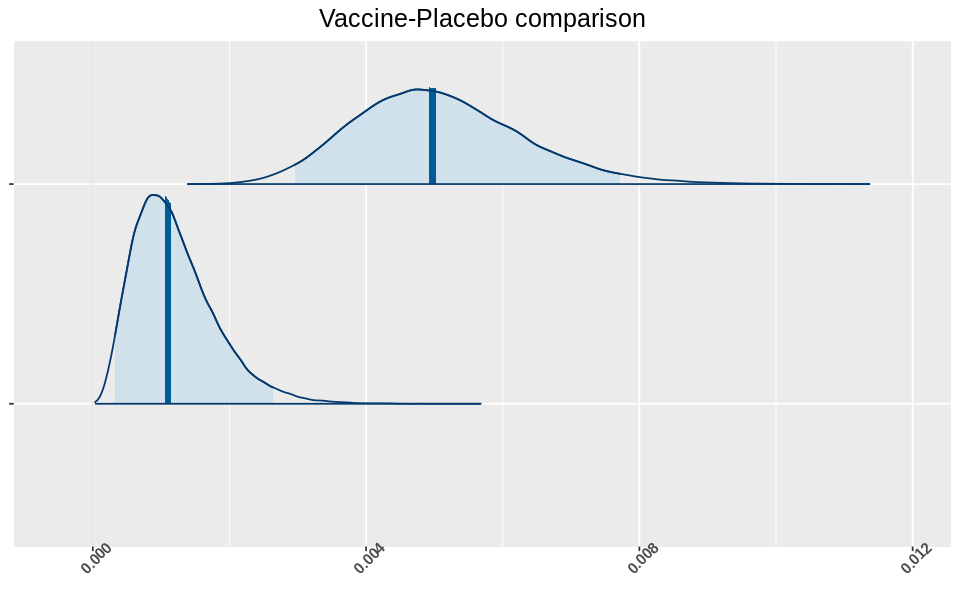

In [22]:
fig(8,5)

mcmc_areas(
  pars = c("theta[1]"),
  codaSamples_Comirnaty31_6575,              
  prob = 0.95) + theme_gray() +ggtitle("Placebo") +
                                theme(axis.text.x = element_text(face="bold", size=9, angle=45), 
                                      axis.text.y = element_blank(),
                                     plot.title = element_text(size = 15, hjust = 0.5 )) 
                                    
                                                 
mcmc_areas(
  pars = c("theta[2]"),
  codaSamples_Comirnaty31_6575,              
  prob = 0.95) + theme_gray() + ggtitle("Vaccine") +
                                theme(axis.text.x = element_text(face="bold", size=9, angle=45), 
                                      axis.text.y = element_blank(),
                                     plot.title = element_text(size = 15, hjust = 0.5 )) 


mcmc_areas(
  pars = c("theta[1]", "theta[2]"),
  codaSamples_Comirnaty31_6575,              
  prob = 0.95)  + theme_gray() + ggtitle("Vaccine-Placebo comparison") +
                                theme(axis.text.x = element_text(face="bold", size=9, angle=45), 
                                      axis.text.y = element_blank(),
                                     plot.title = element_text(size = 15, hjust = 0.5 ))

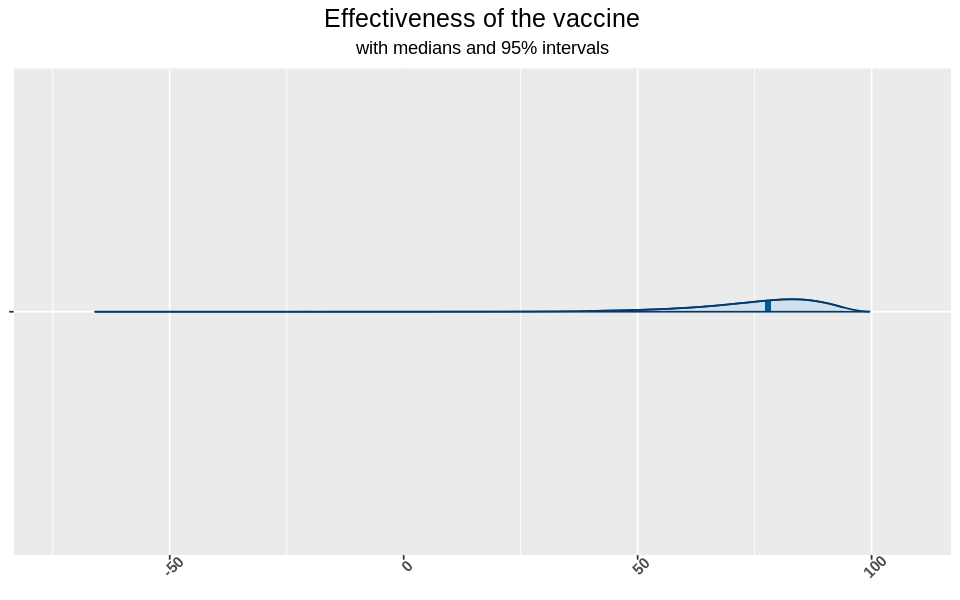

In [23]:
pfizer_res <- tidybayes :: tidy_draws ( codaSamples_Comirnaty31_6575 ) %>%
select ( 'theta[1]': 'theta[2]') %>% rename ( Placebo = 'theta[1]', Vaccine = 'theta[2]') %>% mutate (diff_rate = (Placebo-Vaccine ) / Placebo*100,
Placebo_perc = Placebo * 100,
Vaccine_perc = Vaccine * 100)
mcmc_areas(
  pars = c("diff_rate"),
  pfizer_res,              
  prob = 0.95) + theme_gray() + theme(axis.text.x = element_text(face="bold", size=9, angle=45), 
                                      axis.text.y = element_blank(),
                                     plot.title = element_text(size = 15, hjust = 0.5 ),
                                     plot.subtitle= element_text(hjust=0.5))+ labs(
                                                            title = "Effectiveness of the vaccine",
                                                            subtitle = "with medians and 95% intervals")  

| Lower      | Upper |Mean|Variance|
| ----------- | ----------- |-----------|-----------|
|46.90171	|96.76582	|74.91564	|206.465|

In [24]:
prior <- bayestestR :: distribution_normal(60000, mean = 50, sd = 15)
bayestestR :: bayesfactor_parameters (pfizer_res$diff_rate ,
prior ,
direction = "two-sided", null = 50)

BF
5.390077


In [25]:
credInt = 0.95
sPts <- sort( pfizer_res[,"diff_rate",1] )
cIdx_step <- ceiling(credInt * length(sPts ))
nCIs <- length(sPts) - cIdx_step
ciWidth <- rep(0, nCIs)
for (j in 1:nCIs) {
ciWidth[j] <- sPts[ j + cIdx_step ] - sPts[j]
}
HDImin = sPts[ which.min( ciWidth ) ]
HDImax = sPts[ which.min( ciWidth ) + cIdx_step ]
HDIlim_pf65_75= c( HDImin , HDImax )

mean_pf65_75 <- mean(sPts)
var_pf65_75 <- var(sPts)
col <- c("Lower","Upper","Mean","Variance")
recap_pf65_75 <- data.frame(HDIlim_pf65_75[1], HDIlim_pf65_75[2], mean_pf65_75, var_pf65_75)
colnames(recap_pf65_75)<- col

recap_pf65_75

Lower,Upper,Mean,Variance
46.90171,96.76582,74.91564,206.465


## Pfizer $>75$

In [5]:
tot_Comirnaty_vaccg75    <- 774

tot_Comirnaty_placg75    <- 785


patient <- c(rep("vaccine",tot_Comirnaty_vaccg75),
             rep("placebo",tot_Comirnaty_placg75))
positive_Comirnaty_vaccg75  <- 0
positive_Comirnaty_placg75 <- 5
tested <- c(rep("pos",positive_Comirnaty_vaccg75),
          rep("neg",tot_Comirnaty_vaccg75-positive_Comirnaty_vaccg75),
          rep("pos",positive_Comirnaty_placg75),
          rep("neg",tot_Comirnaty_placg75-positive_Comirnaty_placg75))
Comirnaty_vaccg75.tb <- tibble (tested=tested , patient=patient)
table(Comirnaty_vaccg75.tb[[2]],Comirnaty_vaccg75.tb[[1]])
datalist = list(tested= ifelse(Comirnaty_vaccg75.tb$tested == "neg",0,1),
               patient = as.integer(factor(Comirnaty_vaccg75.tb$patient)),               
               Ntot = nrow(Comirnaty_vaccg75.tb),
               Nclass = nlevels(factor(Comirnaty_vaccg75.tb$patient)))
jagsModelComirnaty_vaccg75 <- jags.model(file = "./jags_model_beta.txt",data=datalist,n.chain=4,n.adapt=500,quiet=TRUE)
update(jagsModelComirnaty_vaccg75,n.iter=500)


         
          neg pos
  placebo 780   5
  vaccine 774   0

|       | neg |pos| 
| ----------- | ----------- | ------|
| placebo      | 780       |5|
| vaccine   | 774        | 0|

In [6]:
codaSamples_Comirnaty31_g75 <- coda.samples(jagsModelComirnaty_vaccg75, variable.names = c("theta"),n.iter = 15000)

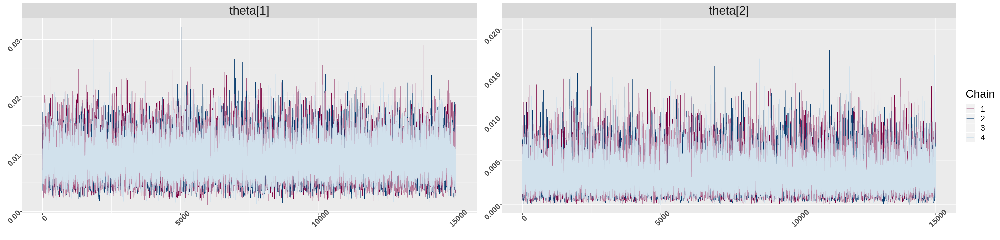

In [7]:
fig(25,6)
color_scheme_set("mix-blue-pink")

p <- mcmc_trace(codaSamples_Comirnaty31_g75) 
p + theme_gray() + facet_text(size = 22) + theme(axis.text.x = element_text(face="bold", size=14, angle=45), 
                                                 axis.text.y = element_text(face="bold", size=14, angle=45),
                                                 legend.title = element_text(size = 20),
                                                 legend.text = element_text(size = 14))

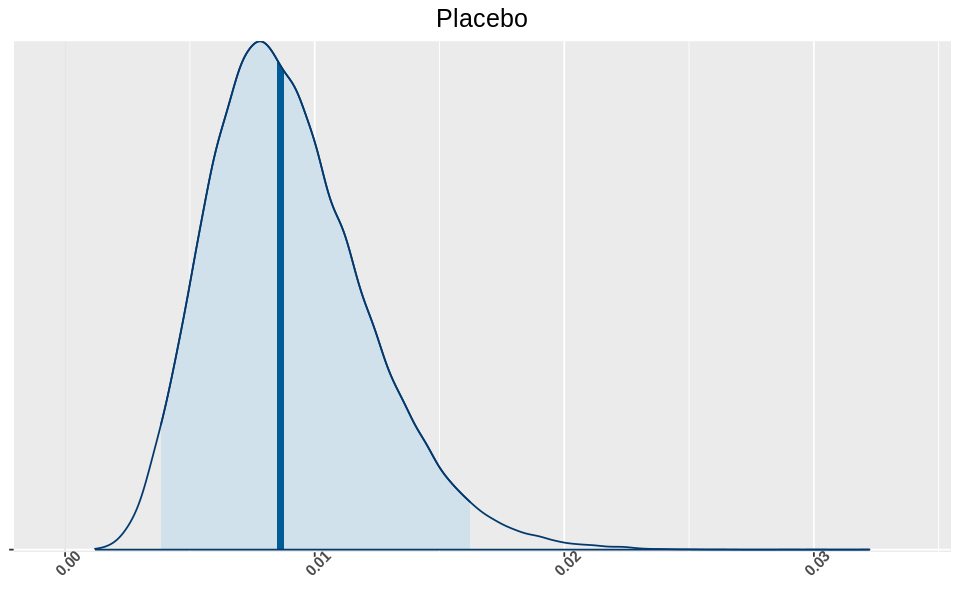

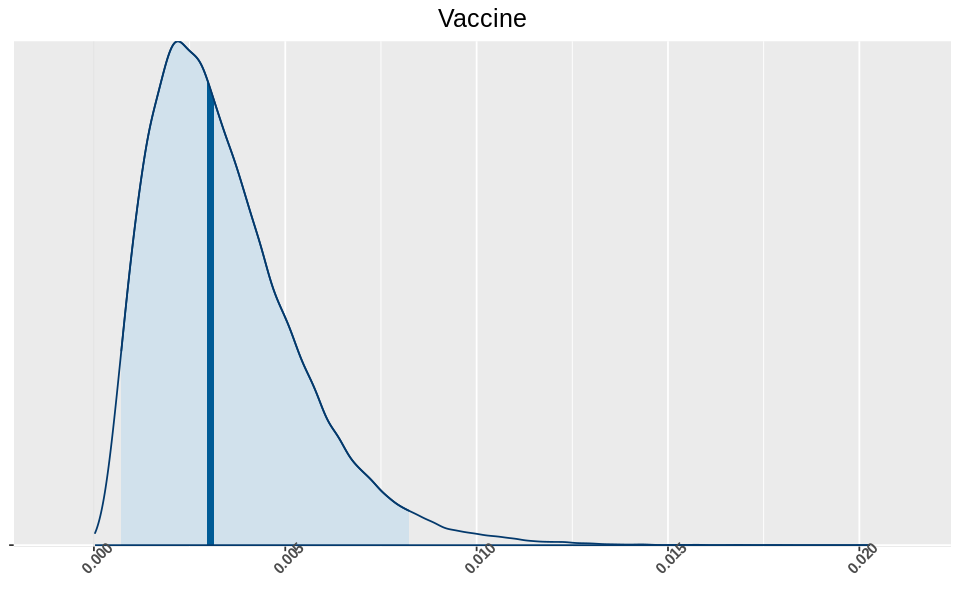

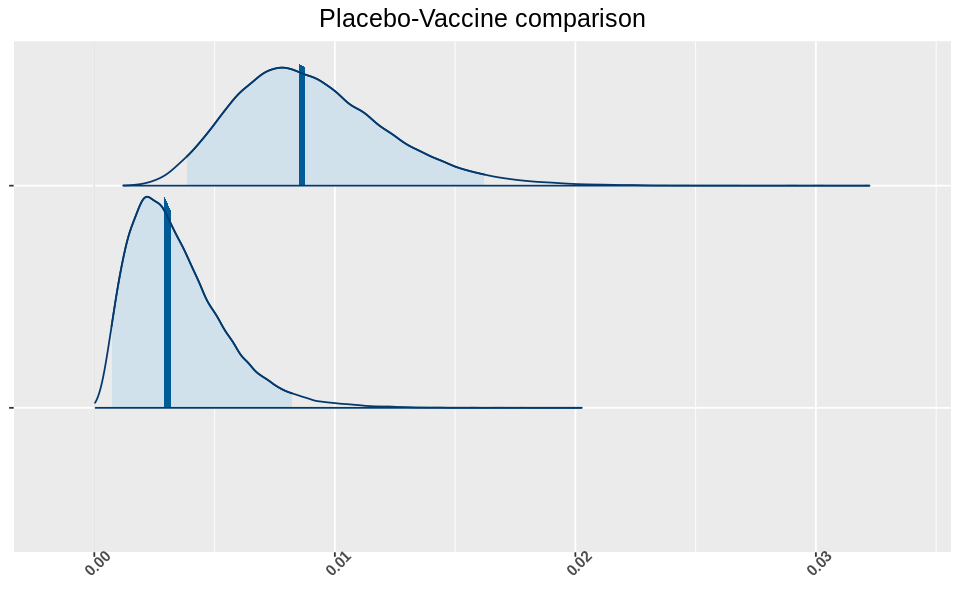

In [8]:
fig(8,5)

mcmc_areas(
  pars = c("theta[1]"),
  codaSamples_Comirnaty31_g75,              
  prob = 0.95) + theme_gray() +ggtitle("Placebo") +
                                theme(axis.text.x = element_text(face="bold", size=9, angle=45), 
                                      axis.text.y = element_blank(),
                                     plot.title = element_text(size = 15, hjust = 0.5 )) 
                                    
                                                 
mcmc_areas(
  pars = c("theta[2]"),
  codaSamples_Comirnaty31_g75,              
  prob = 0.95) + theme_gray() + ggtitle("Vaccine") +
                                theme(axis.text.x = element_text(face="bold", size=9, angle=45), 
                                      axis.text.y = element_blank(),
                                     plot.title = element_text(size = 15, hjust = 0.5 )) 

mcmc_areas(
  pars = c("theta[1]", "theta[2]"),
  codaSamples_Comirnaty31_g75,              
  prob = 0.95)  + theme_gray() + ggtitle("Placebo-Vaccine comparison") +
                                theme(axis.text.x = element_text(face="bold", size=9, angle=45), 
                                      axis.text.y = element_blank(),
                                     plot.title = element_text(size = 15, hjust = 0.5 ))

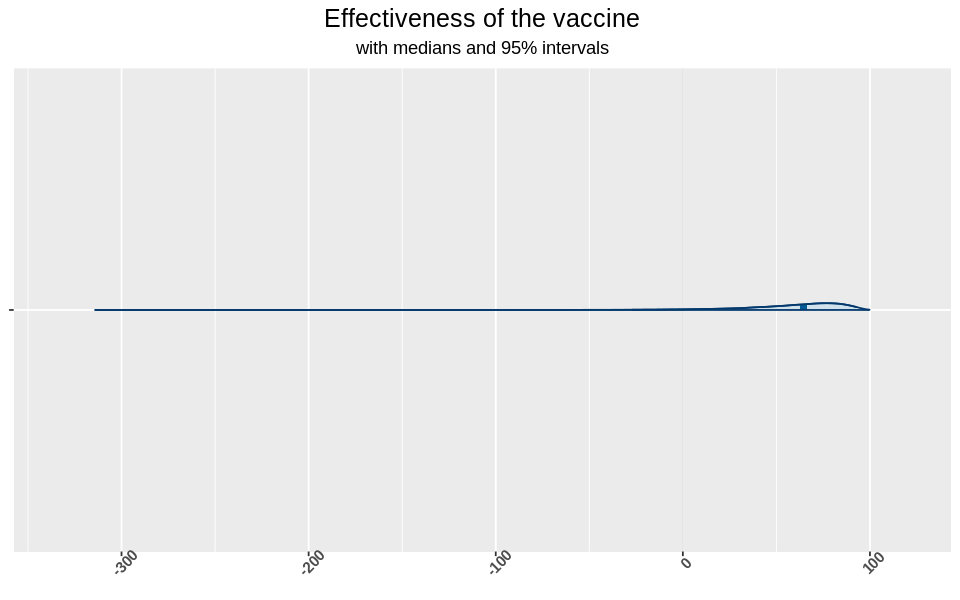

In [9]:
pfizer_res <- tidybayes :: tidy_draws ( codaSamples_Comirnaty31_g75 ) %>%
select ( 'theta[1]': 'theta[2]') %>% rename ( Placebo = 'theta[1]', Vaccine = 'theta[2]') %>% mutate (diff_rate = (Placebo-Vaccine ) / Placebo*100,
Placebo_perc = Placebo * 100,
Vaccine_perc = Vaccine * 100)
mcmc_areas(
  pars = c("diff_rate"),
  pfizer_res,              
  prob = 0.95) + theme_gray() + theme(axis.text.x = element_text(face="bold", size=9, angle=45), 
                                      axis.text.y = element_blank(),
                                     plot.title = element_text(size = 15, hjust = 0.5 ),
                                     plot.subtitle= element_text(hjust=0.5))+ labs(
                                                            title = "Effectiveness of the vaccine",
                                                            subtitle = "with medians and 95% intervals")  

| Lower      | Upper |Mean|Variance|
| ----------- | ----------- |-----------|-----------|
|-4.859842	|97.47738|	56.63239|	1028.546|

In [10]:
prior <- bayestestR :: distribution_normal(60000, mean = 50, sd = 15)
bayestestR :: bayesfactor_parameters (pfizer_res$diff_rate ,
prior ,
direction = "two-sided", null = 50)

Loading required namespace: logspline


BF
2.468552


In [11]:
credInt = 0.95
sPts <- sort( pfizer_res[,"diff_rate",1] )
cIdx_step <- ceiling(credInt * length(sPts ))
nCIs <- length(sPts) - cIdx_step
ciWidth <- rep(0, nCIs)
for (j in 1:nCIs) {
ciWidth[j] <- sPts[ j + cIdx_step ] - sPts[j]
}
HDImin = sPts[ which.min( ciWidth ) ]
HDImax = sPts[ which.min( ciWidth ) + cIdx_step ]
HDIlim_pf75= c( HDImin , HDImax )

mean_pf75 <- mean(sPts)
var_pf75 <- var(sPts)
col <- c("Lower","Upper","Mean","Variance")
recap_pf75 <- data.frame(HDIlim_pf75[1], HDIlim_pf75[2], mean_pf75, var_pf75)
colnames(recap_pf75)<- col

recap_pf75

Lower,Upper,Mean,Variance
-4.859842,97.47738,56.63239,1028.546


In [26]:
daf <- data.frame()

recap_pfage <- rbind(daf, recap_pfl65,recap_pf65_75,recap_pf75)
rownames(recap_pfage)<-c("<65","65-75", ">75")

recap_pfage

,Lower,Upper,Mean,Variance
<65,74.491278,94.10217,84.73303,27.29885
65-75,46.901709,96.76582,74.91564,206.46499
>75,-4.859842,97.47738,56.63239,1028.54579


# Moderna age group

## Moderna $<65$

In [80]:
tot_Moderna_vaccl65    <- 10521

tot_Moderna_placl65    <- 10551


patient <- c(rep("vaccine",tot_Moderna_vaccl65),
             rep("placebo",tot_Moderna_placl65))
positive_Moderna_vaccl65  <- 7
positive_Moderna_placl65 <- 156
tested <- c(rep("pos",positive_Moderna_vaccl65),
          rep("neg",tot_Moderna_vaccl65-positive_Moderna_vaccl65),
          rep("pos",positive_Moderna_placl65),
          rep("neg",tot_Moderna_placl65-positive_Moderna_placl65))
Moderna_vaccl65.tb <- tibble (tested=tested , patient=patient)
table(Moderna_vaccl65.tb[[2]],Moderna_vaccl65.tb[[1]])
datalist = list(tested= ifelse(Moderna_vaccl65.tb$tested == "neg",0,1),
               patient = as.integer(factor(Moderna_vaccl65.tb$patient)),               
               Ntot = nrow(Moderna_vaccl65.tb),
               Nclass = nlevels(factor(Moderna_vaccl65.tb$patient)))
jagsModelModerna_vaccl65 <- jags.model(file = "./jags_model_beta.txt",data=datalist,n.chain=4,n.adapt=500,quiet=TRUE)
update(jagsModelModerna_vaccl65,n.iter=500)


         
            neg   pos
  placebo 10395   156
  vaccine 10514     7

|       | neg |pos| 
| ----------- | ----------- | ------|
| placebo      | 10395       |156|
| vaccine   | 10514        | 7|

In [81]:
codaSamples_Moderna31_l65 <- coda.samples(jagsModelModerna_vaccl65, variable.names = c("theta"),n.iter = 15000)

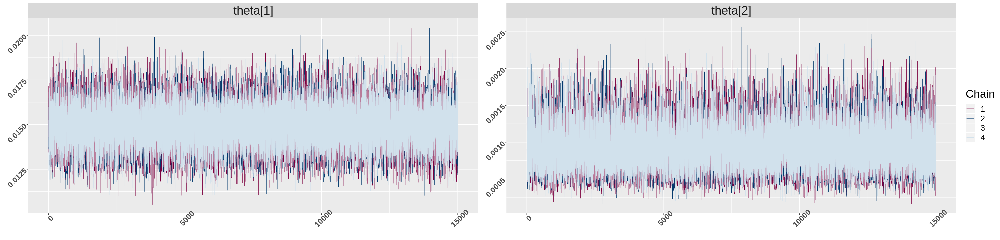

In [82]:
fig(25,6)
color_scheme_set("mix-blue-pink")

p <- mcmc_trace(codaSamples_Moderna31_l65) 
p + theme_gray() + facet_text(size = 22) + theme(axis.text.x = element_text(face="bold", size=14, angle=45), 
                                                 axis.text.y = element_text(face="bold", size=14, angle=45),
                                                 legend.title = element_text(size = 20),
                                                 legend.text = element_text(size = 14))

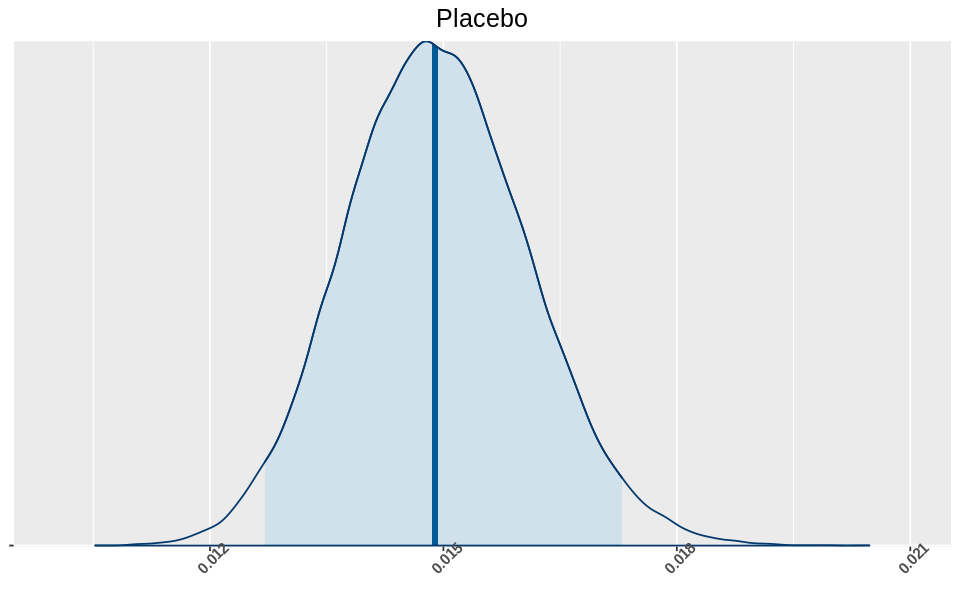

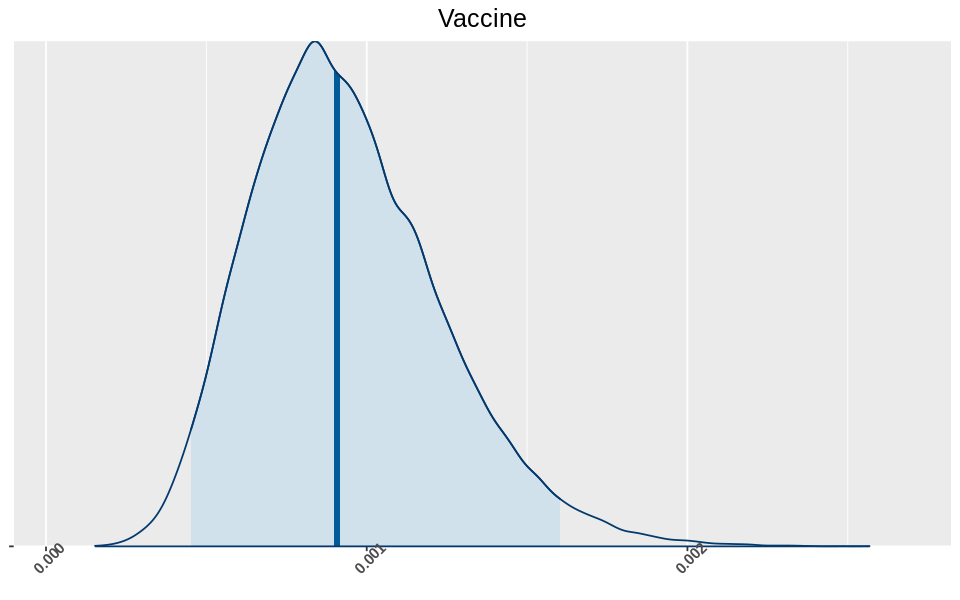

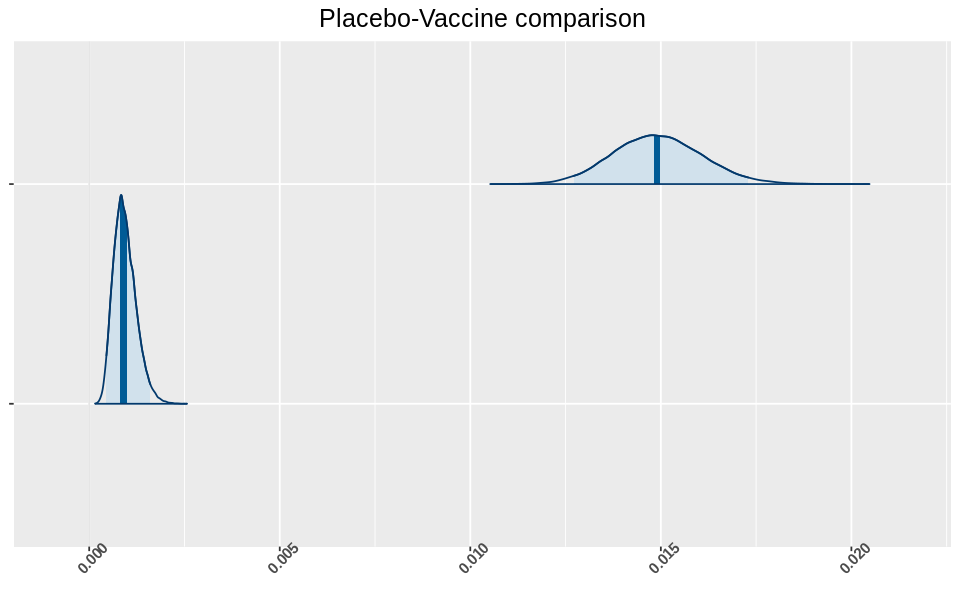

In [83]:
fig(8,5)

mcmc_areas(
  pars = c("theta[1]"),
  codaSamples_Moderna31_l65,              
  prob = 0.95) + theme_gray() +ggtitle("Placebo") +
                                theme(axis.text.x = element_text(face="bold", size=9, angle=45), 
                                      axis.text.y = element_blank(),
                                     plot.title = element_text(size = 15, hjust = 0.5 )) 
                                    
                                                 
mcmc_areas(
  pars = c("theta[2]"),
  codaSamples_Moderna31_l65,              
  prob = 0.95) + theme_gray() + ggtitle("Vaccine") +
                                theme(axis.text.x = element_text(face="bold", size=9, angle=45), 
                                      axis.text.y = element_blank(),
                                     plot.title = element_text(size = 15, hjust = 0.5 )) 

mcmc_areas(
  pars = c("theta[1]", "theta[2]"),
  codaSamples_Moderna31_l65,              
  prob = 0.95)  + theme_gray() + ggtitle("Placebo-Vaccine comparison") +
                                theme(axis.text.x = element_text(face="bold", size=9, angle=45), 
                                      axis.text.y = element_blank(),
                                     plot.title = element_text(size = 15, hjust = 0.5 ))

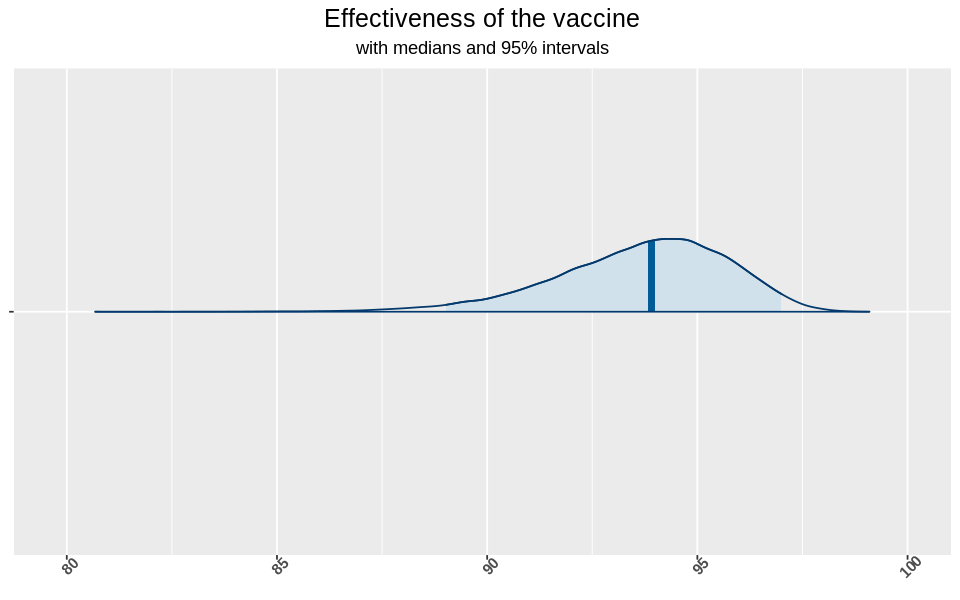

In [84]:
Moderna_res <- tidybayes :: tidy_draws ( codaSamples_Moderna31_l65 ) %>%
select ( 'theta[1]': 'theta[2]') %>% rename ( Placebo = 'theta[1]', Vaccine = 'theta[2]') %>% mutate (diff_rate = (Placebo-Vaccine ) / Placebo*100,
Placebo_perc = Placebo * 100,
Vaccine_perc = Vaccine * 100)

mcmc_areas(
  pars = c("diff_rate"),
  Moderna_res,              
  prob = 0.95) + theme_gray() + theme(axis.text.x = element_text(face="bold", size=9, angle=45), 
                                      axis.text.y = element_blank(),
                                     plot.title = element_text(size = 15, hjust = 0.5 ),
                                     plot.subtitle= element_text(hjust=0.5))+ labs(
                                                            title = "Effectiveness of the vaccine",
                                                            subtitle = "with medians and 95% intervals")  

| Lower      | Upper |Mean|Variance|
| ----------- | ----------- |-----------|-----------|
| 89.50848	|97.30017	|93.66955	|4.233953|


In [85]:
prior <- bayestestR :: distribution_normal(60000, mean = 50, sd = 15)
bayestestR :: bayesfactor_parameters (Moderna_res$diff_rate ,
prior ,
direction = "two-sided", null = 50)

Warning message in logspline::logspline(x):
“too much data close together”Warning message in logspline::logspline(x):
“re-ran with oldlogspline”

BF
1.431466e+17


In [86]:
credInt = 0.95
sPts <- sort( Moderna_res[,"diff_rate",1] )
cIdx_step <- ceiling(credInt * length(sPts ))
nCIs <- length(sPts) - cIdx_step
ciWidth <- rep(0, nCIs)
for (j in 1:nCIs) {
ciWidth[j] <- sPts[ j + cIdx_step ] - sPts[j]
}
HDImin = sPts[ which.min( ciWidth ) ]
HDImax = sPts[ which.min( ciWidth ) + cIdx_step ]
HDIlim_modl65= c( HDImin , HDImax )

mean_modl65 <- mean(sPts)
var_modl65 <- var(sPts)
col <- c("Lower","Upper","Mean","Variance")
recap_modl65 <- data.frame(HDIlim_modl65[1], HDIlim_modl65[2], mean_modl65, var_modl65)
colnames(recap_modl65)<- col

recap_modl65

Lower,Upper,Mean,Variance
89.50848,97.30017,93.66955,4.233953


## Moderna $65 \leq age \leq 75$

In [87]:

tot_Moderna_vacc6575    <- 2953

tot_Moderna_plac6575    <- 2864


patient <- c(rep("vaccine",tot_Moderna_vacc6575),
             rep("placebo",tot_Moderna_plac6575))

positive_Moderna_vacc6575  <- 4
positive_Moderna_plac6575 <- 22
tested <- c(rep("pos",positive_Moderna_vacc6575),
          rep("neg",tot_Moderna_vacc6575-positive_Moderna_vacc6575),
          rep("pos",positive_Moderna_plac6575),
          rep("neg",tot_Moderna_plac6575-positive_Moderna_plac6575))
Moderna_vacc6575.tb <- tibble (tested=tested , patient=patient)
table(Moderna_vacc6575.tb[[2]],Moderna_vacc6575.tb[[1]])
datalist = list(tested= ifelse(Moderna_vacc6575.tb$tested == "neg",0,1),
               patient = as.integer(factor(Moderna_vacc6575.tb$patient)),               
               Ntot = nrow(Moderna_vacc6575.tb),
               Nclass = nlevels(factor(Moderna_vacc6575.tb$patient)))
jagsModelModerna_vacc6575 <- jags.model(file = "./jags_model_beta.txt",data=datalist,n.chain=4,n.adapt=500,quiet=TRUE)
update(jagsModelModerna_vacc6575,n.iter=500)


         
           neg  pos
  placebo 2842   22
  vaccine 2949    4

|       | neg |pos| 
| ----------- | ----------- | ------|
| placebo      | 2842       |22|
| vaccine   | 2949        | 4|

In [88]:
codaSamples_Moderna31_6575 <- coda.samples(jagsModelModerna_vacc6575, variable.names = c("theta"),n.iter = 15000)

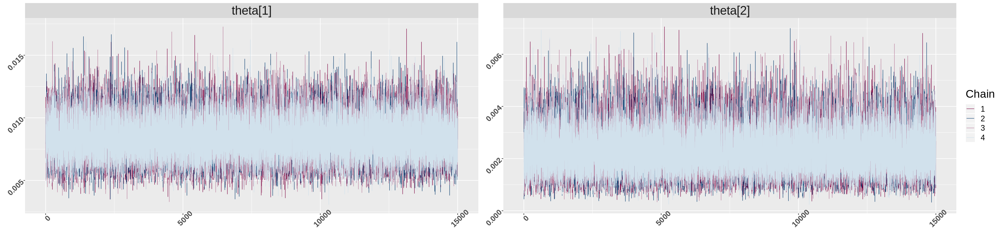

In [89]:
fig(25,6)
color_scheme_set("mix-blue-pink")

p <- mcmc_trace(codaSamples_Moderna31_6575) 
p + theme_gray() + facet_text(size = 22) + theme(axis.text.x = element_text(face="bold", size=14, angle=45), 
                                                 axis.text.y = element_text(face="bold", size=14, angle=45),
                                                 legend.title = element_text(size = 20),
                                                 legend.text = element_text(size = 14))

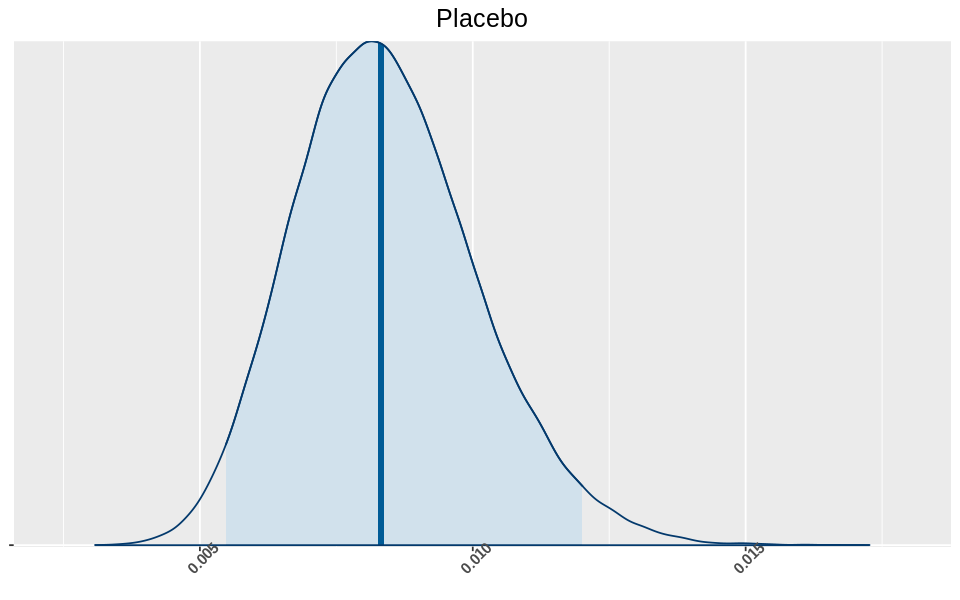

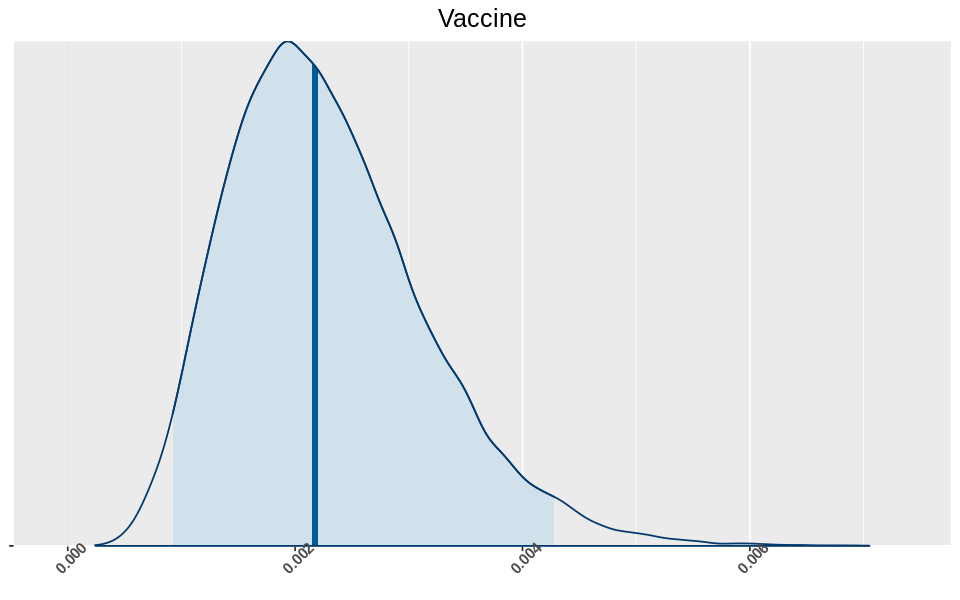

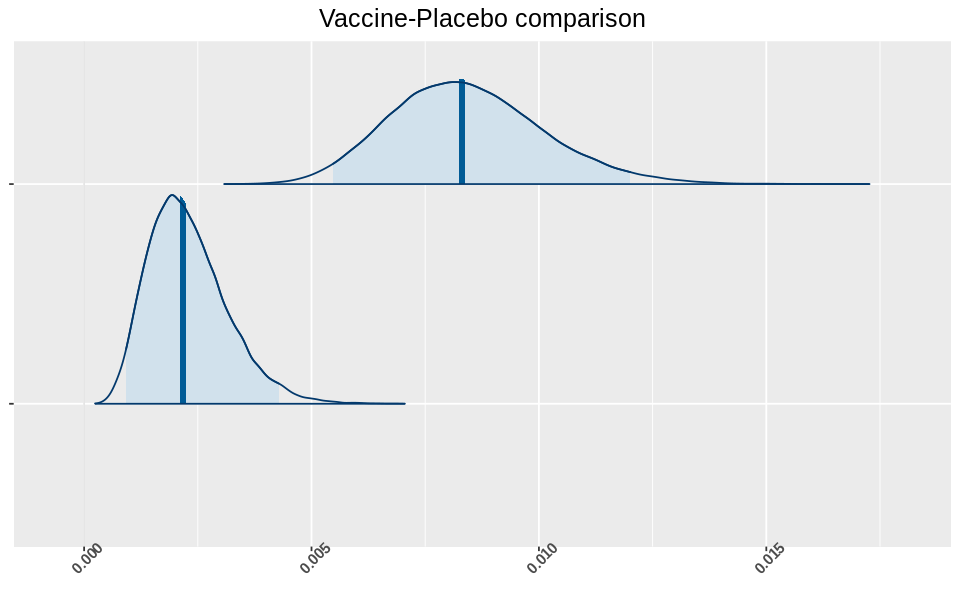

In [90]:
fig(8,5)

mcmc_areas(
  pars = c("theta[1]"),
  codaSamples_Moderna31_6575,              
  prob = 0.95) + theme_gray() +ggtitle("Placebo") +
                                theme(axis.text.x = element_text(face="bold", size=9, angle=45), 
                                      axis.text.y = element_blank(),
                                     plot.title = element_text(size = 15, hjust = 0.5 )) 
                                    
                                                 
mcmc_areas(
  pars = c("theta[2]"),
  codaSamples_Moderna31_6575,              
  prob = 0.95) + theme_gray() + ggtitle("Vaccine") +
                                theme(axis.text.x = element_text(face="bold", size=9, angle=45), 
                                      axis.text.y = element_blank(),
                                     plot.title = element_text(size = 15, hjust = 0.5 )) 

mcmc_areas(
  pars = c("theta[1]", "theta[2]"),
  codaSamples_Moderna31_6575,              
  prob = 0.95)  + theme_gray() + ggtitle("Vaccine-Placebo comparison") +
                                theme(axis.text.x = element_text(face="bold", size=9, angle=45), 
                                      axis.text.y = element_blank(),
                                     plot.title = element_text(size = 15, hjust = 0.5 ))

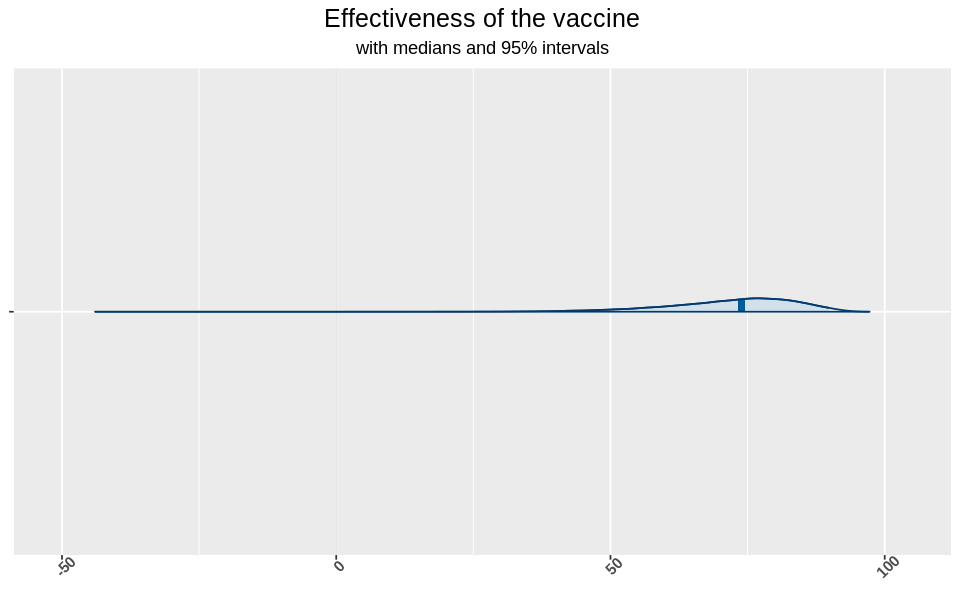

In [91]:
Moderna_res <- tidybayes :: tidy_draws ( codaSamples_Moderna31_6575 ) %>%
select ( 'theta[1]': 'theta[2]') %>% rename ( Placebo = 'theta[1]', Vaccine = 'theta[2]') %>% mutate (diff_rate = (Placebo-Vaccine ) / Placebo*100,
Placebo_perc = Placebo * 100,
Vaccine_perc = Vaccine * 100)

mcmc_areas(
  pars = c("diff_rate"),
  Moderna_res,              
  prob = 0.95) + theme_gray() + theme(axis.text.x = element_text(face="bold", size=9, angle=45), 
                                      axis.text.y = element_blank(),
                                     plot.title = element_text(size = 15, hjust = 0.5 ),
                                     plot.subtitle= element_text(hjust=0.5))+ labs(
                                                            title = "Effectiveness of the vaccine",
                                                            subtitle = "with medians and 95% intervals")  

In [92]:
prior <- bayestestR :: distribution_normal(60000, mean = 50, sd = 15)
bayestestR :: bayesfactor_parameters (Moderna_res$diff_rate ,
prior ,
direction = "two-sided", null = 50)

BF
4.48962


In [93]:
credInt = 0.95
sPts <- sort( Moderna_res[,"diff_rate",1] )
cIdx_step <- ceiling(credInt * length(sPts ))
nCIs <- length(sPts) - cIdx_step
ciWidth <- rep(0, nCIs)
for (j in 1:nCIs) {
ciWidth[j] <- sPts[ j + cIdx_step ] - sPts[j]
}
HDImin = sPts[ which.min( ciWidth ) ]
HDImax = sPts[ which.min( ciWidth ) + cIdx_step ]
HDIlim_mod6575= c( HDImin , HDImax )

mean_mod6575 <- mean(sPts)
var_mod6575 <- var(sPts)
col <- c("Lower","Upper","Mean","Variance")
recap_mod6575 <- data.frame(HDIlim_mod6575[1], HDIlim_mod6575[2], mean_mod6575, var_mod6575)
colnames(recap_mod6575)<- col

recap_mod6575

Lower,Upper,Mean,Variance
47.59684,92.40251,71.73687,153.3365


## Moderna $>75$

In [94]:

tot_Moderna_vaccg75    <- 630

tot_Moderna_placg75    <- 688


patient <- c(rep("vaccine",tot_Moderna_vaccg75),
             rep("placebo",tot_Moderna_placg75))
# Number of patients tested positive after RCT:
positive_Moderna_vaccg75  <- 0
positive_Moderna_placg75 <- 7
tested <- c(rep("pos",positive_Moderna_vaccg75),
          rep("neg",tot_Moderna_vaccg75-positive_Moderna_vaccg75),
          rep("pos",positive_Moderna_placg75),
          rep("neg",tot_Moderna_placg75-positive_Moderna_placg75))
Moderna_vaccg75.tb <- tibble (tested=tested , patient=patient)
table(Moderna_vaccg75.tb[[2]],Moderna_vaccg75.tb[[1]])
datalist = list(tested= ifelse(Moderna_vaccg75.tb$tested == "neg",0,1),
               patient = as.integer(factor(Moderna_vaccg75.tb$patient)),               
               Ntot = nrow(Moderna_vaccg75.tb),
               Nclass = nlevels(factor(Moderna_vaccg75.tb$patient)))
jagsModelModerna_vaccg75 <- jags.model(file = "./jags_model_beta.txt",data=datalist,n.chain=4,n.adapt=500,quiet=TRUE)
update(jagsModelModerna_vaccg75,n.iter=2000)


         
          neg pos
  placebo 681   7
  vaccine 630   0

|       | neg |pos| 
| ----------- | ----------- | ------|
| placebo      | 681       |7|
| vaccine   | 630        | 0|

In [95]:
codaSamples_Moderna31_g75 <- coda.samples(jagsModelModerna_vaccg75, variable.names = c("theta"),n.iter = 15000)

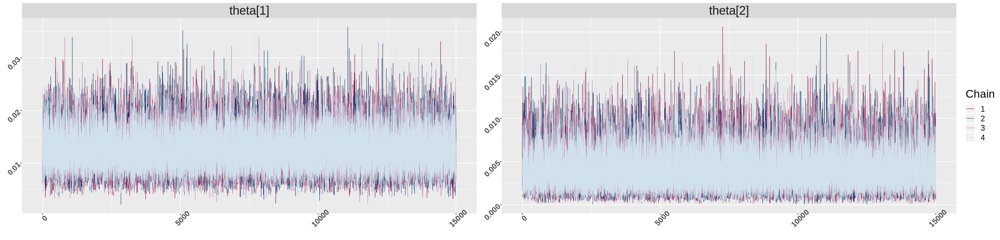

In [96]:
fig(25,6)
color_scheme_set("mix-blue-pink")

p <- mcmc_trace(codaSamples_Moderna31_g75) 
p + theme_gray() + facet_text(size = 22) + theme(axis.text.x = element_text(face="bold", size=14, angle=45), 
                                                 axis.text.y = element_text(face="bold", size=14, angle=45),
                                                 legend.title = element_text(size = 20),
                                                 legend.text = element_text(size = 14))

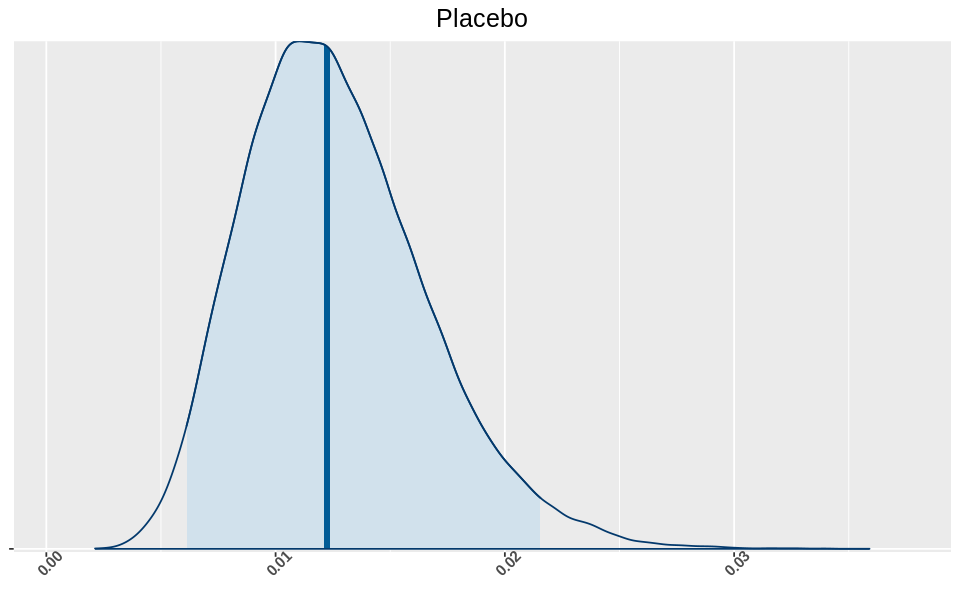

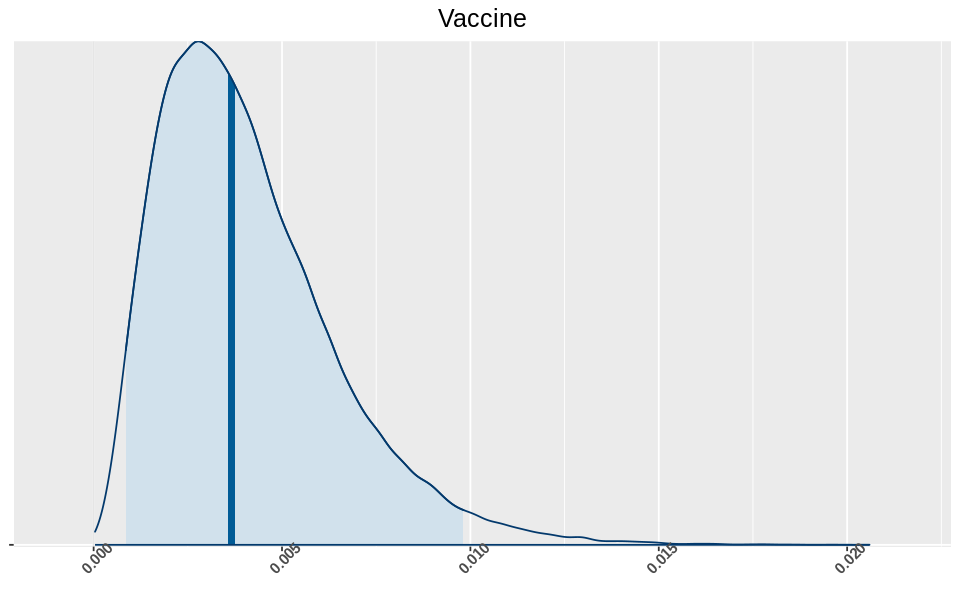

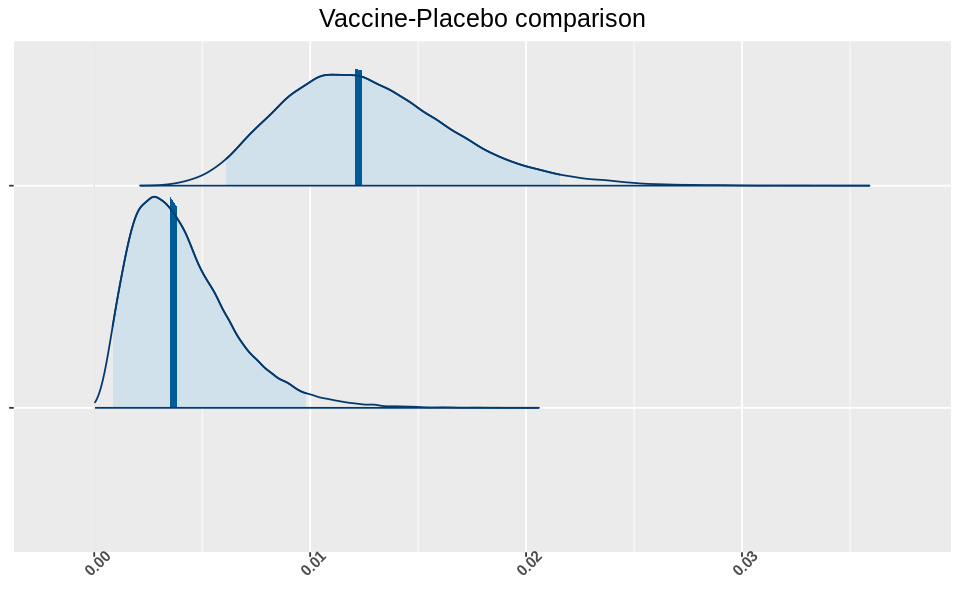

In [97]:
fig(8,5)

mcmc_areas(
  pars = c("theta[1]"),
  codaSamples_Moderna31_g75,              
  prob = 0.95) + theme_gray() +ggtitle("Placebo") +
                                theme(axis.text.x = element_text(face="bold", size=9, angle=45), 
                                      axis.text.y = element_blank(),
                                     plot.title = element_text(size = 15, hjust = 0.5 )) 
                                    
                                                 
mcmc_areas(
  pars = c("theta[2]"),
  codaSamples_Moderna31_g75,              
  prob = 0.95) + theme_gray() + ggtitle("Vaccine") +
                                theme(axis.text.x = element_text(face="bold", size=9, angle=45), 
                                      axis.text.y = element_blank(),
                                     plot.title = element_text(size = 15, hjust = 0.5 )) 
#PLOTTA ENTRAMBI

mcmc_areas(
  pars = c("theta[1]", "theta[2]"),
  codaSamples_Moderna31_g75,              
  prob = 0.95)  + theme_gray() + ggtitle("Vaccine-Placebo comparison") +
                                theme(axis.text.x = element_text(face="bold", size=9, angle=45), 
                                      axis.text.y = element_blank(),
                                     plot.title = element_text(size = 15, hjust = 0.5 ))

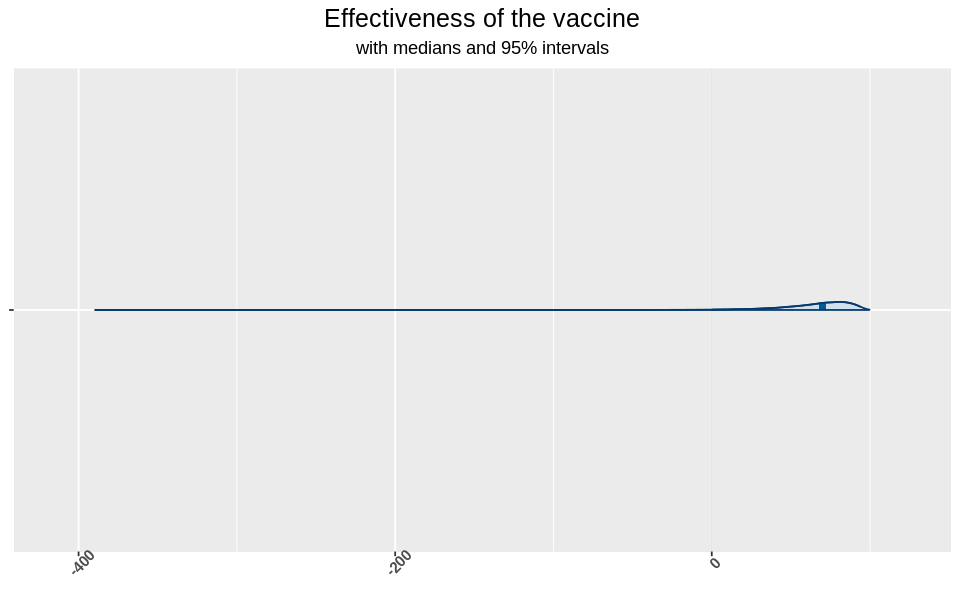

In [98]:
Moderna_res <- tidybayes :: tidy_draws ( codaSamples_Moderna31_g75 ) %>%
select ( 'theta[1]': 'theta[2]') %>% rename ( Placebo = 'theta[1]', Vaccine = 'theta[2]') %>% mutate (diff_rate = (Placebo-Vaccine ) / Placebo*100,
Placebo_perc = Placebo * 100,
Vaccine_perc = Vaccine * 100)

mcmc_areas(
  pars = c("diff_rate"),
  Moderna_res,              
  prob = 0.95) + theme_gray() + theme(axis.text.x = element_text(face="bold", size=9, angle=45), 
                                      axis.text.y = element_blank(),
                                     plot.title = element_text(size = 15, hjust = 0.5 ),
                                     plot.subtitle= element_text(hjust=0.5))+ labs(
                                                            title = "Effectiveness of the vaccine",
                                                            subtitle = "with medians and 95% intervals")  

In [99]:
prior <- bayestestR :: distribution_normal(60000, mean = 50, sd = 15)
bayestestR :: bayesfactor_parameters (Moderna_res$diff_rate ,
prior ,
direction = "two-sided", null = 50)

BF
2.805516


In [100]:
credInt = 0.95
sPts <- sort( Moderna_res[,"diff_rate",1] )
cIdx_step <- ceiling(credInt * length(sPts ))
nCIs <- length(sPts) - cIdx_step
ciWidth <- rep(0, nCIs)
for (j in 1:nCIs) {
ciWidth[j] <- sPts[ j + cIdx_step ] - sPts[j]
}
HDImin = sPts[ which.min( ciWidth ) ]
HDImax = sPts[ which.min( ciWidth ) + cIdx_step ]
HDIlim_mod75= c( HDImin , HDImax )

mean_mod75 <- mean(sPts)
var_mod75 <- var(sPts)
col <- c("Lower","Upper","Mean","Variance")
recap_mod75 <- data.frame(HDIlim_mod75[1], HDIlim_mod75[2], mean_mod75, var_mod75)
colnames(recap_mod75)<- col

recap_mod75

Lower,Upper,Mean,Variance
15.58135,97.76965,64.08973,638.4882


# J&J age group

## J&J $<60$

In [4]:
tot_JJ_vaccl65    <- 15378

tot_JJ_placl65    <- 15253


patient <- c(rep("vaccine",tot_JJ_vaccl65),
             rep("placebo",tot_JJ_placl65))
positive_JJ_vaccl65  <- 101
positive_JJ_placl65 <- 286
tested <- c(rep("pos",positive_JJ_vaccl65),
          rep("neg",tot_JJ_vaccl65-positive_JJ_vaccl65),
          rep("pos",positive_JJ_placl65),
          rep("neg",tot_JJ_placl65-positive_JJ_placl65))
JJ_vaccl65.tb <- tibble (tested=tested , patient=patient)
table(JJ_vaccl65.tb[[2]],JJ_vaccl65.tb[[1]])
datalist = list(tested= ifelse(JJ_vaccl65.tb$tested == "neg",0,1),
               patient = as.integer(factor(JJ_vaccl65.tb$patient)),               
               Ntot = nrow(JJ_vaccl65.tb),
               Nclass = nlevels(factor(JJ_vaccl65.tb$patient)))
jagsModelJJ_vaccl65 <- jags.model(file = "./jags_model_beta.txt",data=datalist,n.chain=4,n.adapt=500,quiet=TRUE)
update(jagsModelJJ_vaccl65,n.iter=500)


         
            neg   pos
  placebo 14967   286
  vaccine 15277   101

|       | neg |pos| 
| ----------- | ----------- | ------|
| placebo      | 14967       |286|
| vaccine   | 15277        | 101|

In [102]:
codaSamples_JJ31_l65 <- coda.samples(jagsModelJJ_vaccl65, variable.names = c("theta"),n.iter = 15000)

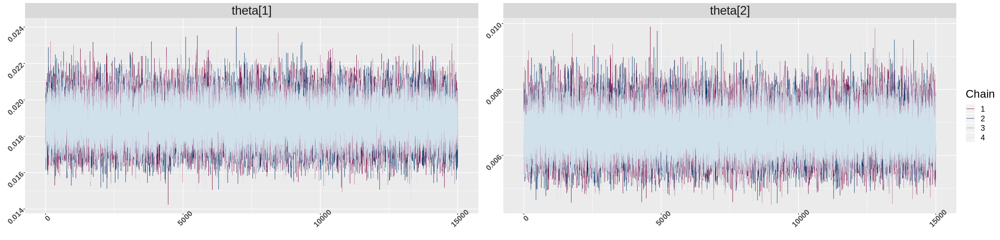

In [103]:
fig(25,6)
color_scheme_set("mix-blue-pink")

p <- mcmc_trace(codaSamples_JJ31_l65) 
p + theme_gray() + facet_text(size = 22) + theme(axis.text.x = element_text(face="bold", size=14, angle=45), 
                                                 axis.text.y = element_text(face="bold", size=14, angle=45),
                                                 legend.title = element_text(size = 20),
                                                 legend.text = element_text(size = 14))

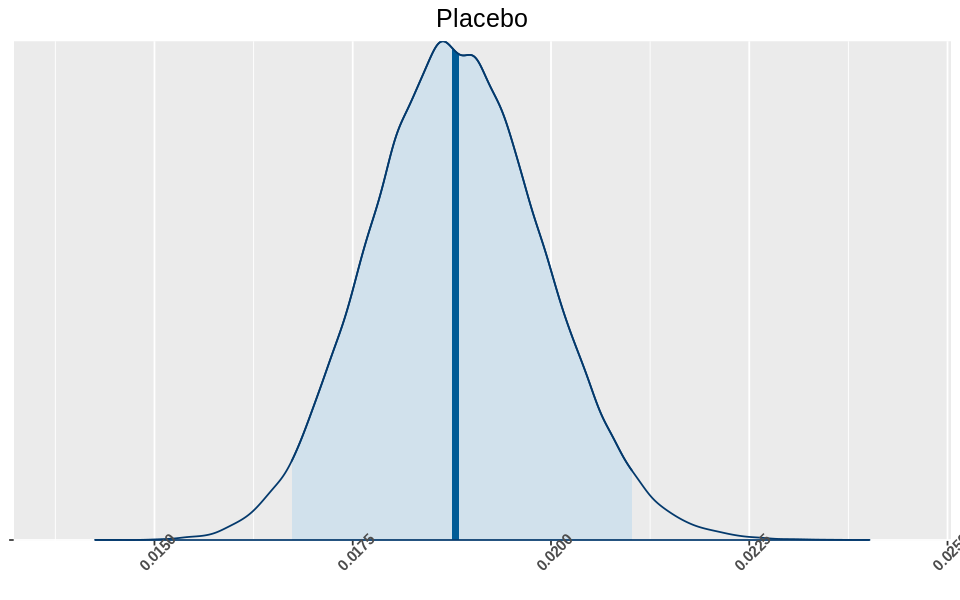

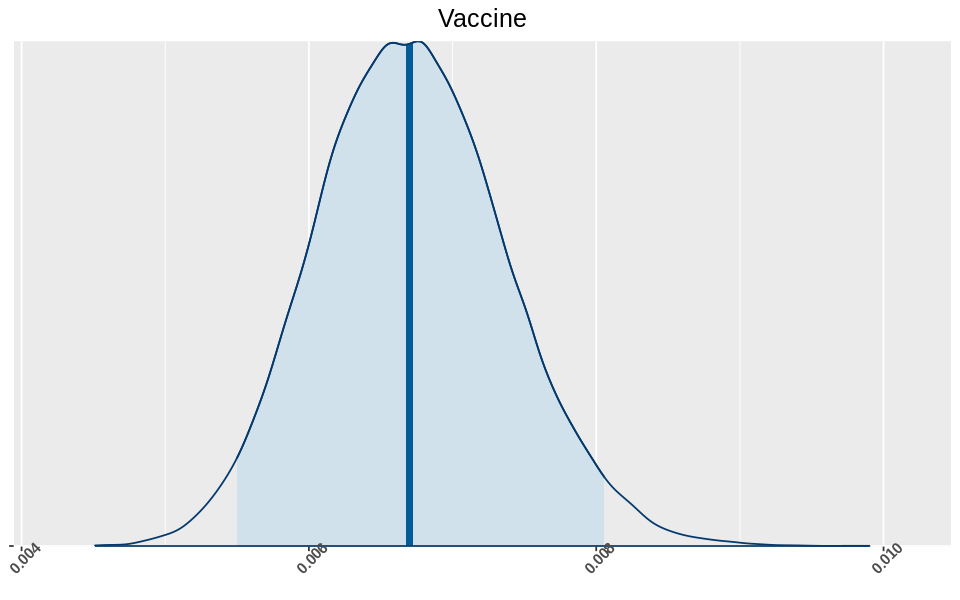

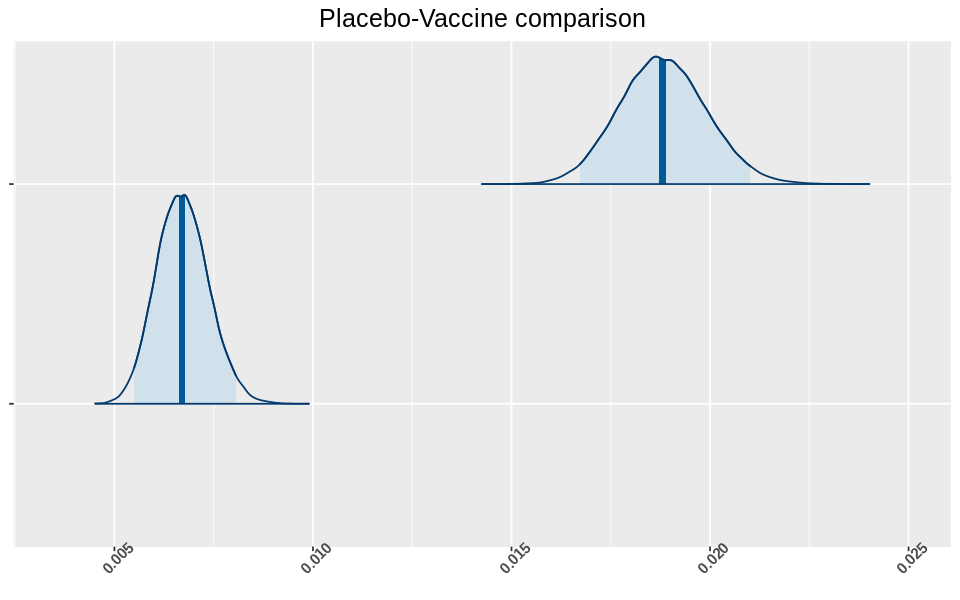

In [104]:
fig(8,5)

mcmc_areas(
  pars = c("theta[1]"),
  codaSamples_JJ31_l65,              
  prob = 0.95) + theme_gray() +ggtitle("Placebo") +
                                theme(axis.text.x = element_text(face="bold", size=9, angle=45), 
                                      axis.text.y = element_blank(),
                                     plot.title = element_text(size = 15, hjust = 0.5 )) 
                                    
                                                 
mcmc_areas(
  pars = c("theta[2]"),
  codaSamples_JJ31_l65,              
  prob = 0.95) + theme_gray() + ggtitle("Vaccine") +
                                theme(axis.text.x = element_text(face="bold", size=9, angle=45), 
                                      axis.text.y = element_blank(),
                                     plot.title = element_text(size = 15, hjust = 0.5 )) 

mcmc_areas(
  pars = c("theta[1]", "theta[2]"),
  codaSamples_JJ31_l65,              
  prob = 0.95)  + theme_gray() + ggtitle("Placebo-Vaccine comparison") +
                                theme(axis.text.x = element_text(face="bold", size=9, angle=45), 
                                      axis.text.y = element_blank(),
                                     plot.title = element_text(size = 15, hjust = 0.5 ))

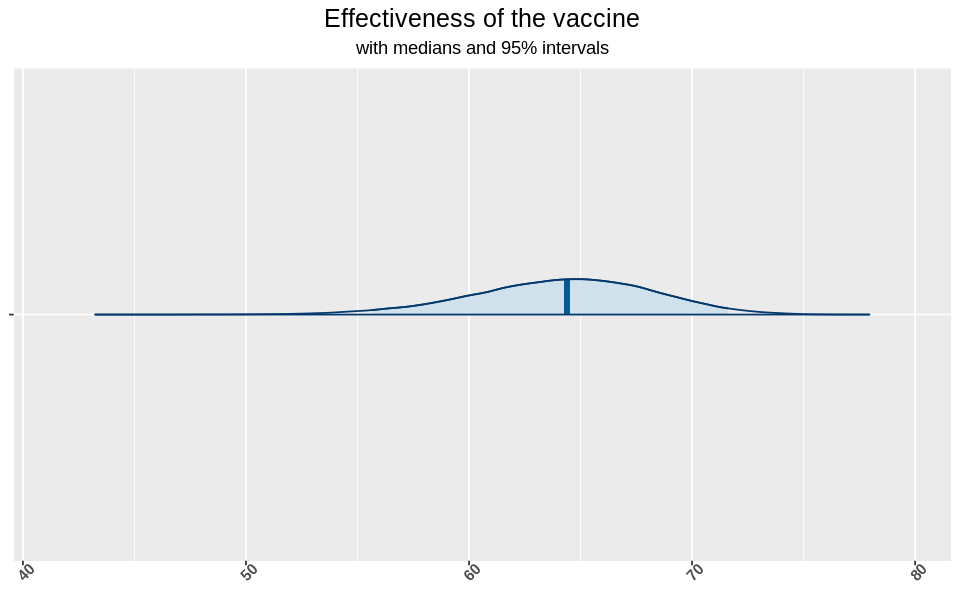

In [105]:
JJ_res <- tidybayes :: tidy_draws ( codaSamples_JJ31_l65 ) %>%
select ( 'theta[1]': 'theta[2]') %>% rename ( Placebo = 'theta[1]', Vaccine = 'theta[2]') %>% mutate (diff_rate = (Placebo-Vaccine ) / Placebo*100,
Placebo_perc = Placebo * 100,
Vaccine_perc = Vaccine * 100)

mcmc_areas(
  pars = c("diff_rate"),
  JJ_res,              
  prob = 0.95) + theme_gray() + theme(axis.text.x = element_text(face="bold", size=9, angle=45), 
                                      axis.text.y = element_blank(),
                                     plot.title = element_text(size = 15, hjust = 0.5 ),
                                     plot.subtitle= element_text(hjust=0.5))+ labs(
                                                            title = "Effectiveness of the vaccine",
                                                            subtitle = "with medians and 95% intervals")  

| Lower      | Upper |Mean|Variance|
| ----------- | ----------- |-----------|-----------|
| 55.88093     | 71.76935     |64.17852|16.59255| 

In [106]:
prior <- bayestestR :: distribution_normal(60000, mean = 50, sd = 15)
bayestestR :: bayesfactor_parameters (JJ_res$diff_rate ,
prior ,
direction = "two-sided", null = 50)

BF
41.89924


In [107]:
credInt = 0.95
sPts <- sort( JJ_res[,"diff_rate",1] )
cIdx_step <- ceiling(credInt * length(sPts ))
nCIs <- length(sPts) - cIdx_step
ciWidth <- rep(0, nCIs)
for (j in 1:nCIs) {
ciWidth[j] <- sPts[ j + cIdx_step ] - sPts[j]
}
HDImin = sPts[ which.min( ciWidth ) ]
HDImax = sPts[ which.min( ciWidth ) + cIdx_step ]
HDIlim_modl65= c( HDImin , HDImax )

mean_modl65 <- mean(sPts)
var_modl65 <- var(sPts)
col <- c("Lower","Upper","Mean","Variance")
recap_modl65 <- data.frame(HDIlim_modl65[1], HDIlim_modl65[2], mean_modl65, var_modl65)
colnames(recap_modl65)<- col

recap_modl65

Lower,Upper,Mean,Variance
55.88093,71.76935,64.17852,16.59255


## JJ $\ge 60$

In [108]:

tot_JJ_vacc6575    <- 6689

tot_JJ_plac6575    <- 6651


patient <- c(rep("vaccine",tot_JJ_vacc6575),
             rep("placebo",tot_JJ_plac6575))

positive_JJ_vacc6575  <- 3
positive_JJ_plac6575 <- 15
tested <- c(rep("pos",positive_JJ_vacc6575),
          rep("neg",tot_JJ_vacc6575-positive_JJ_vacc6575),
          rep("pos",positive_JJ_plac6575),
          rep("neg",tot_JJ_plac6575-positive_JJ_plac6575))
JJ_vacc6575.tb <- tibble (tested=tested , patient=patient)
table(JJ_vacc6575.tb[[2]],JJ_vacc6575.tb[[1]])
datalist = list(tested= ifelse(JJ_vacc6575.tb$tested == "neg",0,1),
               patient = as.integer(factor(JJ_vacc6575.tb$patient)),               
               Ntot = nrow(JJ_vacc6575.tb),
               Nclass = nlevels(factor(JJ_vacc6575.tb$patient)))
jagsModelJJ_vacc6575 <- jags.model(file = "./jags_model_beta.txt",data=datalist,n.chain=4,n.adapt=500,quiet=TRUE)
update(jagsModelJJ_vacc6575,n.iter=500)


         
           neg  pos
  placebo 6636   15
  vaccine 6686    3

|       | neg |pos| 
| ----------- | ----------- | ------|
| placebo      | 6636       |15|
| vaccine   | 6686        | 3|

In [109]:
codaSamples_JJ31_6575 <- coda.samples(jagsModelJJ_vacc6575, variable.names = c("theta"),n.iter = 15000)

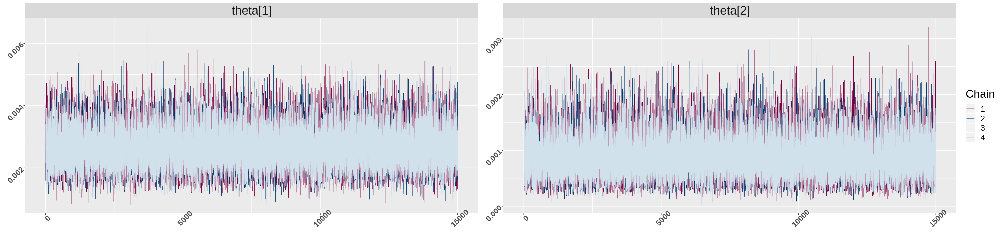

In [110]:
fig(25,6)
color_scheme_set("mix-blue-pink")

p <- mcmc_trace(codaSamples_JJ31_6575) 
p + theme_gray() + facet_text(size = 22) + theme(axis.text.x = element_text(face="bold", size=14, angle=45), 
                                                 axis.text.y = element_text(face="bold", size=14, angle=45),
                                                 legend.title = element_text(size = 20),
                                                 legend.text = element_text(size = 14))

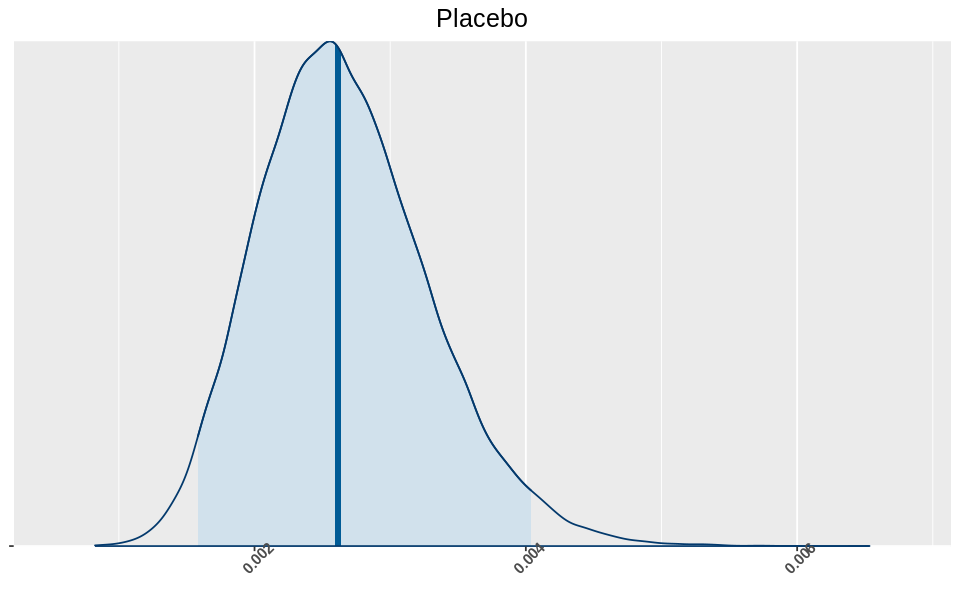

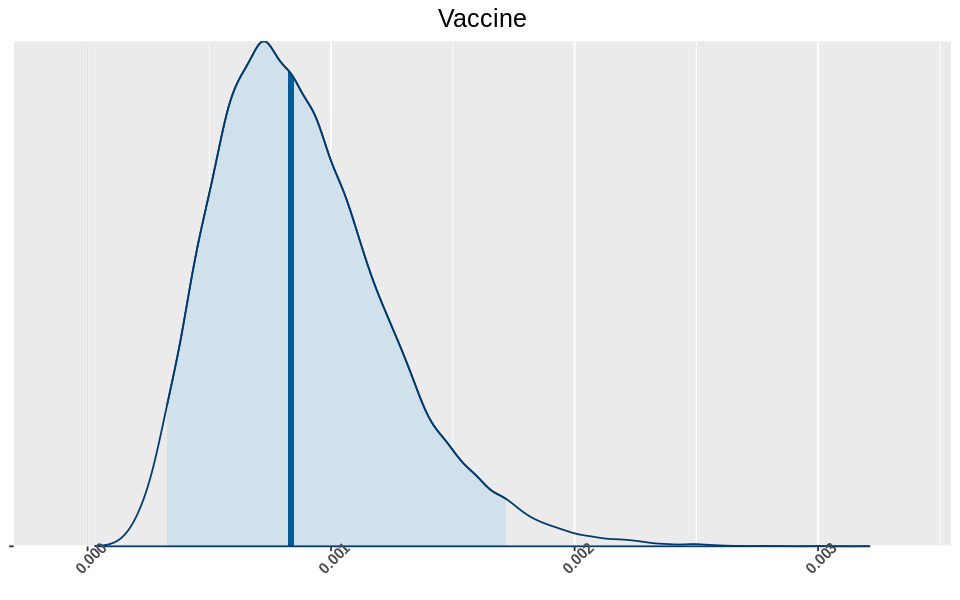

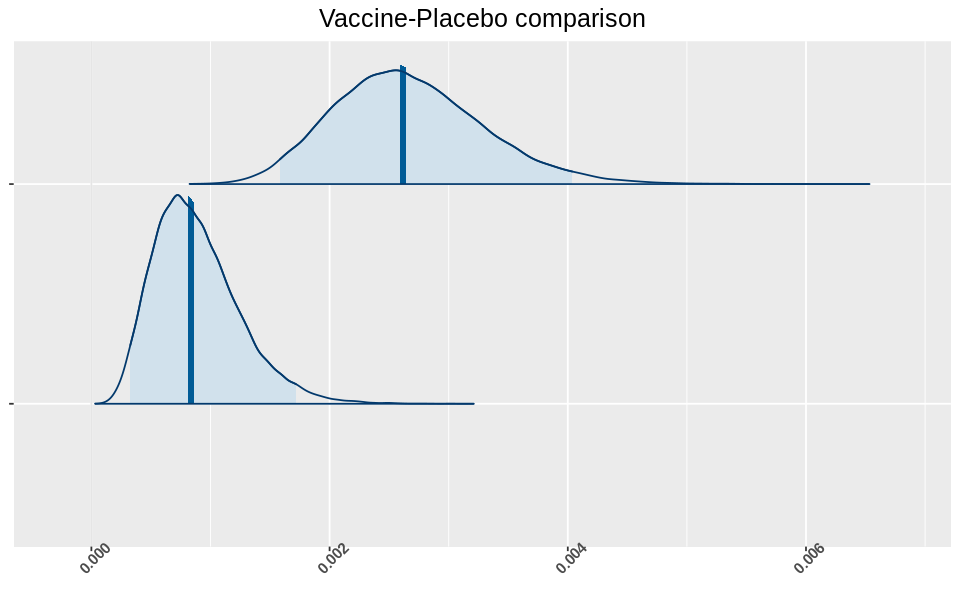

In [111]:
fig(8,5)

mcmc_areas(
  pars = c("theta[1]"),
  codaSamples_JJ31_6575,              
  prob = 0.95) + theme_gray() +ggtitle("Placebo") +
                                theme(axis.text.x = element_text(face="bold", size=9, angle=45), 
                                      axis.text.y = element_blank(),
                                     plot.title = element_text(size = 15, hjust = 0.5 )) 
                                    
                                                 
mcmc_areas(
  pars = c("theta[2]"),
  codaSamples_JJ31_6575,              
  prob = 0.95) + theme_gray() + ggtitle("Vaccine") +
                                theme(axis.text.x = element_text(face="bold", size=9, angle=45), 
                                      axis.text.y = element_blank(),
                                     plot.title = element_text(size = 15, hjust = 0.5 )) 

mcmc_areas(
  pars = c("theta[1]", "theta[2]"),
  codaSamples_JJ31_6575,              
  prob = 0.95)  + theme_gray() + ggtitle("Vaccine-Placebo comparison") +
                                theme(axis.text.x = element_text(face="bold", size=9, angle=45), 
                                      axis.text.y = element_blank(),
                                     plot.title = element_text(size = 15, hjust = 0.5 ))

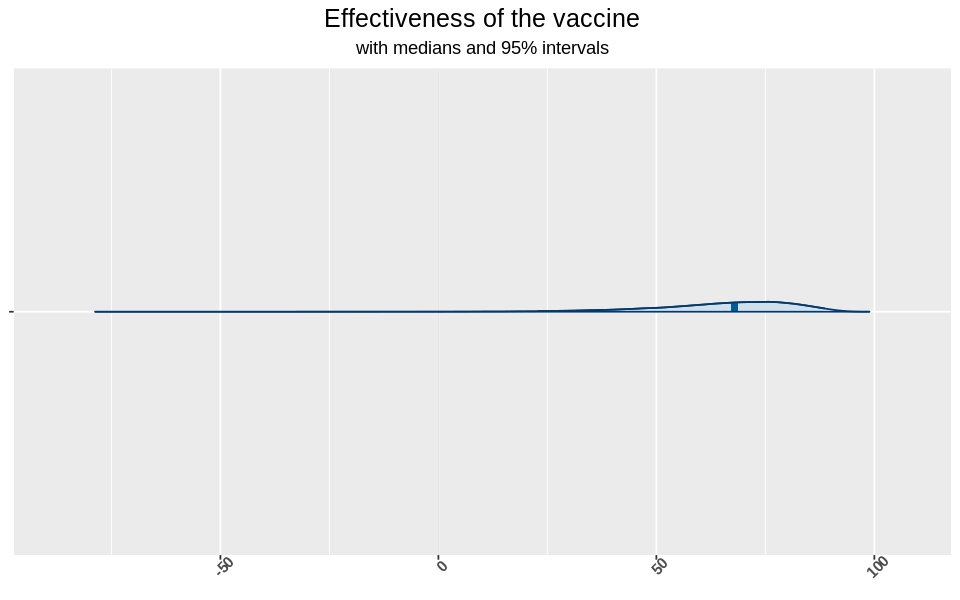

In [112]:
JJ_res <- tidybayes :: tidy_draws ( codaSamples_JJ31_6575 ) %>%
select ( 'theta[1]': 'theta[2]') %>% rename ( Placebo = 'theta[1]', Vaccine = 'theta[2]') %>% mutate (diff_rate = (Placebo-Vaccine ) / Placebo*100,
Placebo_perc = Placebo * 100,
Vaccine_perc = Vaccine * 100)

mcmc_areas(
  pars = c("diff_rate"),
  JJ_res,              
  prob = 0.95) + theme_gray() + theme(axis.text.x = element_text(face="bold", size=9, angle=45), 
                                      axis.text.y = element_blank(),
                                     plot.title = element_text(size = 15, hjust = 0.5 ),
                                     plot.subtitle= element_text(hjust=0.5))+ labs(
                                                            title = "Effectiveness of the vaccine",
                                                            subtitle = "with medians and 95% intervals")  

In [113]:
prior <- bayestestR :: distribution_normal(60000, mean = 50, sd = 15)
bayestestR :: bayesfactor_parameters (JJ_res$diff_rate ,
prior ,
direction = "two-sided", null = 50)

BF
2.39504


In [114]:
credInt = 0.95
sPts <- sort( JJ_res[,"diff_rate",1] )
cIdx_step <- ceiling(credInt * length(sPts ))
nCIs <- length(sPts) - cIdx_step
ciWidth <- rep(0, nCIs)
for (j in 1:nCIs) {
ciWidth[j] <- sPts[ j + cIdx_step ] - sPts[j]
}
HDImin = sPts[ which.min( ciWidth ) ]
HDImax = sPts[ which.min( ciWidth ) + cIdx_step ]
HDIlim_mod6575= c( HDImin , HDImax )

mean_mod6575 <- mean(sPts)
var_mod6575 <- var(sPts)
col <- c("Lower","Upper","Mean","Variance")
recap_mod6575 <- data.frame(HDIlim_mod6575[1], HDIlim_mod6575[2], mean_mod6575, var_mod6575)
colnames(recap_mod6575)<- col

recap_mod6575

Lower,Upper,Mean,Variance
31.46601,92.03761,64.89799,294.1253


|Vaccine name and age group | Negative placebo |Positive placebo|Negative vaccine |Positive vaccine|
| ----------- | ----------- |-----------|-----------|-----------|
|**Pfizer** $\leq 65$| 10674| 64| 10646 |7|
|**Pfizer** $ 65 \leq \text{age}\leq 75$| 3241 | 14| 3238 |1|
|**Pfizer** $> 75$| 780| 5| 774 |0|
|**Moderna** $\leq 65$| 10395| 156| 10514 |7|
|**Moderna** $ 65 \leq \text{age}\leq 75$| 2842 | 22| 2949 |4|
|**Moderna** $> 75$| 681| 7| 630 |0|
|**J&J** $\leq 60$| 14967| 286| 15277 |101|
|**J&J** $\geq 60$| 6636| 15| 6686 |3|

# Conclusions

We can see that in the first part the Markov Chains are a really good and powerful framework to study and find the effectiveness of novel vaccines, but in the age grouped part we can see that the bayesian framework does not work properly, why?

Because the posterior distribution is independent from the prior only we have enough data, in those case for the $age \ge 65$ we have few data, so we can not use this framework in this case.

# Appendix


In this part we see the autocorrelation function to set the thinning of the MCMC, the first is always one.

In [115]:
tot_Comirnaty_vacc    <- 18198
tot_Comirnaty_placebo <- 18325
patient <- c(rep("vaccine",tot_Comirnaty_vacc),
             rep("placebo",tot_Comirnaty_placebo))
# Number of patients tested positive after RCT:
positive_Comirnaty_vacc <- 8
positive_Comirnaty_plac <- 162
tested <- c(rep("pos",positive_Comirnaty_vacc),
          rep("neg",tot_Comirnaty_vacc-positive_Comirnaty_vacc),
          rep("pos",positive_Comirnaty_plac),
          rep("neg",tot_Comirnaty_placebo-positive_Comirnaty_plac))
Comirnaty.tb <- tibble (tested=tested , patient=patient)
datalist = list(tested= ifelse(Comirnaty.tb$tested == "neg",0,1),
               patient = as.integer(factor(Comirnaty.tb$patient)),               
               Ntot = nrow(Comirnaty.tb),
               Nclass = nlevels(factor(Comirnaty.tb$patient)))
jagsModelComirnaty <- jags.model(file = "./jags_model_beta.txt",data=datalist,n.chain=4,n.adapt=500,quiet = TRUE)
update(jagsModelComirnaty,n.iter=500)
codaSamples <- coda.samples(jagsModelComirnaty, variable.names = c("theta"),n.iter = 15000,thin = 1)

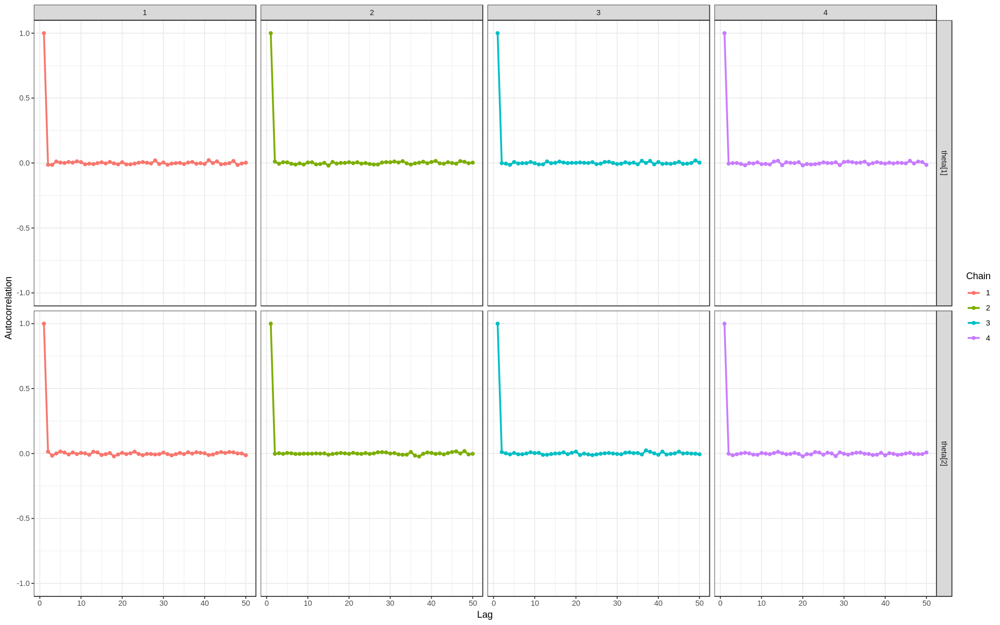

In [116]:
fig(16,10)
S <- ggs(codaSamples)
ggs_autocorrelationd(S)+geom_line(size=1)+geom_point()+ theme_bw() 

## Moderna

In [117]:
# https://www.fda.gov/media/144416/download
tot_Moderna_vacc    <- 14134

tot_Moderna_plac    <- 14073

# tot_Comirnaty_vacc    <- 18325
# tot_Comirnaty_placebo <- 18198
patient <- c(rep("vaccine",tot_Moderna_vacc),
             rep("placebo",tot_Moderna_plac))
# Number of patients tested positive after RCT:
positive_Moderna_vacc <- 8
positive_Moderna_plac <- 86
tested <- c(rep("pos",positive_Moderna_vacc),
          rep("neg",tot_Moderna_vacc-positive_Moderna_vacc),
          rep("pos",positive_Moderna_plac),
          rep("neg",tot_Moderna_plac-positive_Moderna_plac))
Moderna.tb <- tibble (tested=tested , patient=patient)
datalist = list(tested= ifelse(Moderna.tb$tested == "neg",0,1),
               patient = as.integer(factor(Moderna.tb$patient)),               
               Ntot = nrow(Moderna.tb),
               Nclass = nlevels(factor(Moderna.tb$patient)))
jagsModelModerna <- jags.model(file = "./jags_model_beta.txt",data=datalist,n.chain=4,n.adapt=500,quiet = TRUE )
update(jagsModelModerna,n.iter=500)
codaSamples <- coda.samples(jagsModelModerna, variable.names = c("theta"),n.iter = 15000)

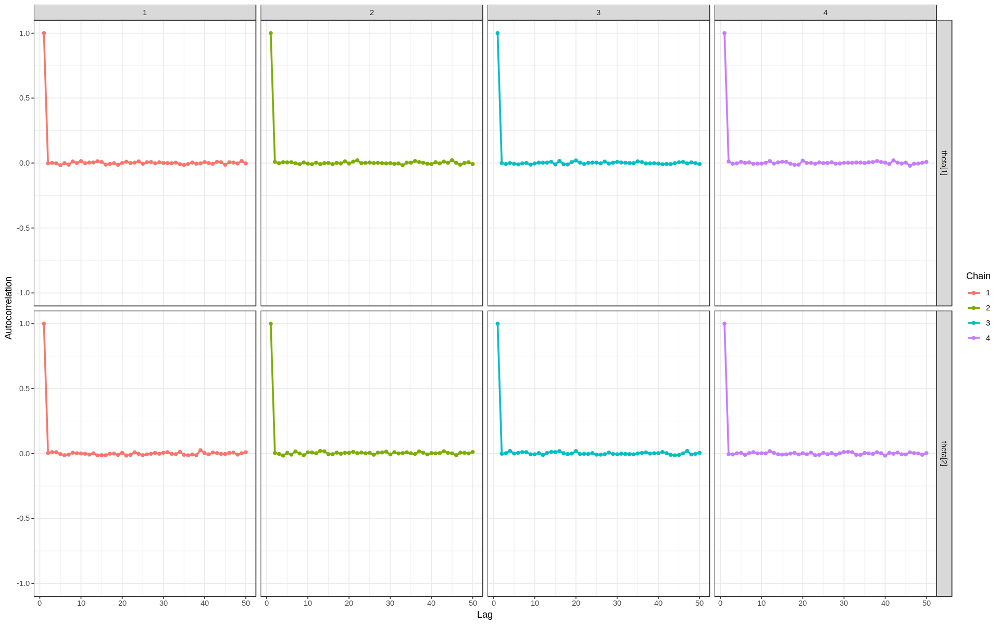

In [118]:
fig(16,10)
S <- ggs(codaSamples)
ggs_autocorrelationd(S)+geom_line(size=1)+geom_point()+ theme_bw() 

# Astrazeneca

In [119]:
# https://www.fda.gov/media/144416/download
tot_Astrazeneca_vacc    <- 5258

tot_Astrazeneca_plac    <- 5210


patient <- c(rep("vaccine",tot_Astrazeneca_vacc),
             rep("placebo",tot_Astrazeneca_plac))
# Number of patients tested positive after RCT:
positive_Astrazeneca_vacc <- 64
positive_Astrazeneca_plac <- 154
tested <- c(rep("pos",positive_Astrazeneca_vacc),
          rep("neg",tot_Astrazeneca_vacc-positive_Astrazeneca_vacc),
          rep("pos",positive_Astrazeneca_plac),
          rep("neg",tot_Astrazeneca_plac-positive_Astrazeneca_plac))
Astrazeneca.tb <- tibble (tested=tested , patient=patient)
datalist = list(tested= ifelse(Astrazeneca.tb$tested == "neg",0,1),
               patient = as.integer(factor(Astrazeneca.tb$patient)),               
               Ntot = nrow(Astrazeneca.tb),
               Nclass = nlevels(factor(Astrazeneca.tb$patient)))
jagsModelAstrazeneca <- jags.model(file = "./jags_model_beta.txt",data=datalist,n.chain=4,n.adapt=500,quiet=TRUE)
 update(jagsModelAstrazeneca,n.iter=500)
codaSamples <- coda.samples(jagsModelAstrazeneca, variable.names = c("theta"),n.iter = 15000)

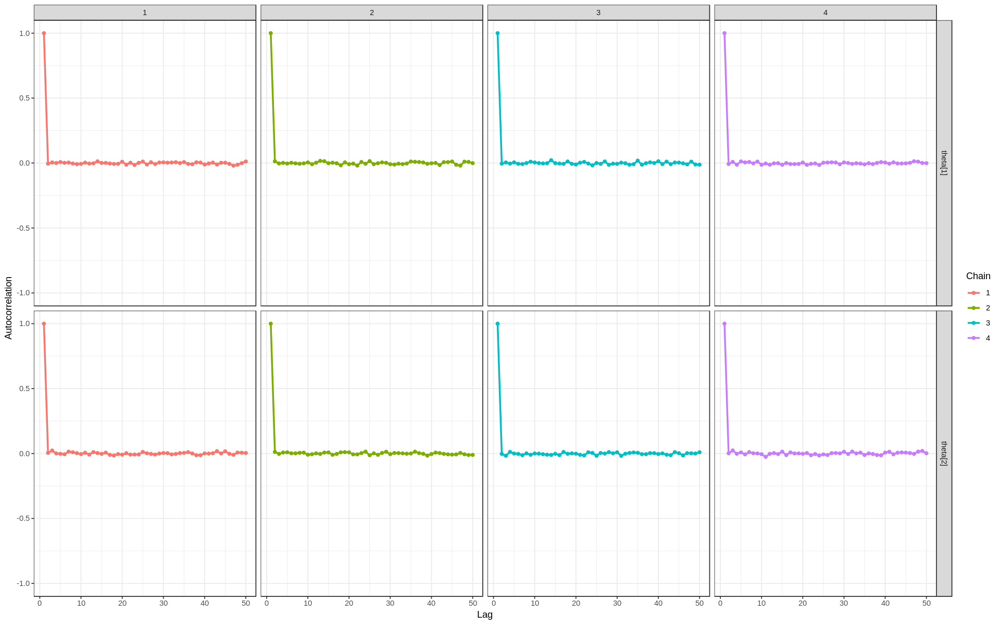

In [120]:
fig(16,10)
S <- ggs(codaSamples)
ggs_autocorrelationd(S)+geom_line(size=1)+geom_point()+ theme_bw() 

## JJ

In [121]:
tot_JJ_vacc    <- 5258

tot_JJ_plac    <- 5210


patient <- c(rep("vaccine",tot_JJ_vacc),
             rep("placebo",tot_JJ_plac))
# Number of patients tested positive after RCT:
positive_JJ_vacc <- 64
positive_JJ_plac <- 154
tested <- c(rep("pos",positive_JJ_vacc),
          rep("neg",tot_JJ_vacc-positive_JJ_vacc),
          rep("pos",positive_JJ_plac),
          rep("neg",tot_JJ_plac-positive_JJ_plac))
JJ.tb <- tibble (tested=tested , patient=patient)
datalist = list(tested= ifelse(JJ.tb$tested == "neg",0,1),
               patient = as.integer(factor(JJ.tb$patient)),               
               Ntot = nrow(JJ.tb),
               Nclass = nlevels(factor(JJ.tb$patient)))
jagsModelJJ <- jags.model(file = "./jags_model_beta.txt",data=datalist,n.chain=4,n.adapt=500,quiet=TRUE)
 update(jagsModelJJ,n.iter=500)
codaSamples <- coda.samples(jagsModelJJ, variable.names = c("theta"),n.iter = 15000)

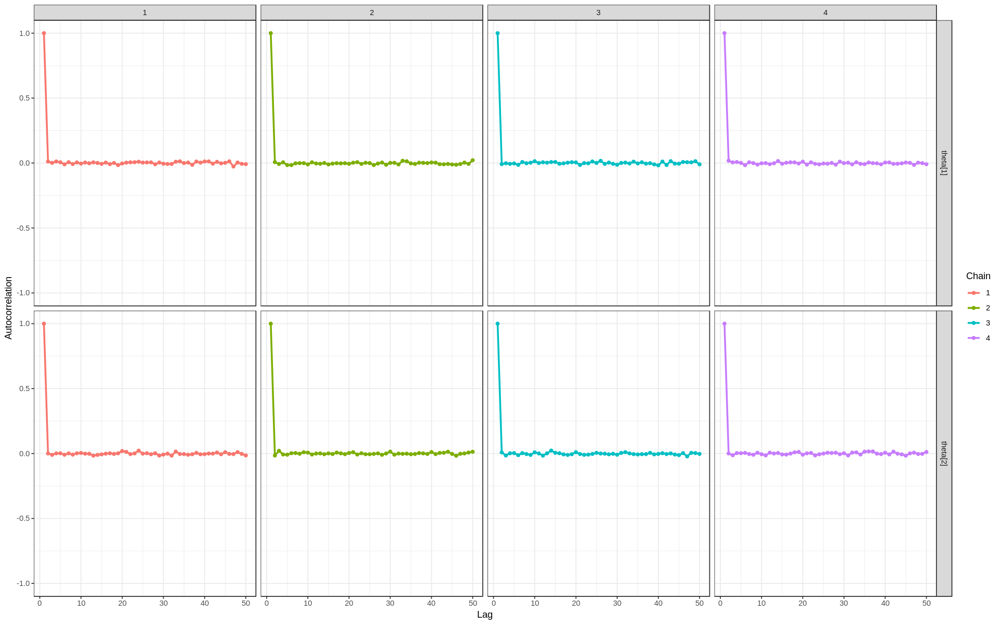

In [122]:
fig(16,10)
S <- ggs(codaSamples)
ggs_autocorrelationd(S)+geom_line(size=1)+geom_point()+ theme_bw() 

# Vaccine age group

## Comirnaty

## Pfizer $<65$

In [123]:
tot_Comirnaty_vaccl65    <- 13549

tot_Comirnaty_placl65    <- 13618


patient <- c(rep("vaccine",tot_Comirnaty_vaccl65),
             rep("placebo",tot_Comirnaty_placl65))
# Number of patients tested positive after RCT:
positive_Comirnaty_vaccl65  <- 64
positive_Comirnaty_placl65 <- 7
tested <- c(rep("pos",positive_Comirnaty_vaccl65),
          rep("neg",tot_Comirnaty_vaccl65-positive_Comirnaty_vaccl65),
          rep("pos",positive_Comirnaty_placl65),
          rep("neg",tot_Comirnaty_placl65-positive_Comirnaty_placl65))
Comirnaty_vaccl65.tb <- tibble (tested=tested , patient=patient)
datalist = list(tested= ifelse(Comirnaty_vaccl65.tb$tested == "neg",0,1),
               patient = as.integer(factor(Comirnaty_vaccl65.tb$patient)),               
               Ntot = nrow(Comirnaty_vaccl65.tb),
               Nclass = nlevels(factor(Comirnaty_vaccl65.tb$patient)))
jagsModelComirnaty_vaccl65 <- jags.model(file = "./jags_model_beta.txt",data=datalist,n.chain=4,n.adapt=500,quiet=TRUE)
update(jagsModelComirnaty_vaccl65,n.iter=500)


In [124]:
codaSamples <- coda.samples(jagsModelComirnaty_vaccl65, variable.names = c("theta"),n.iter = 15000)

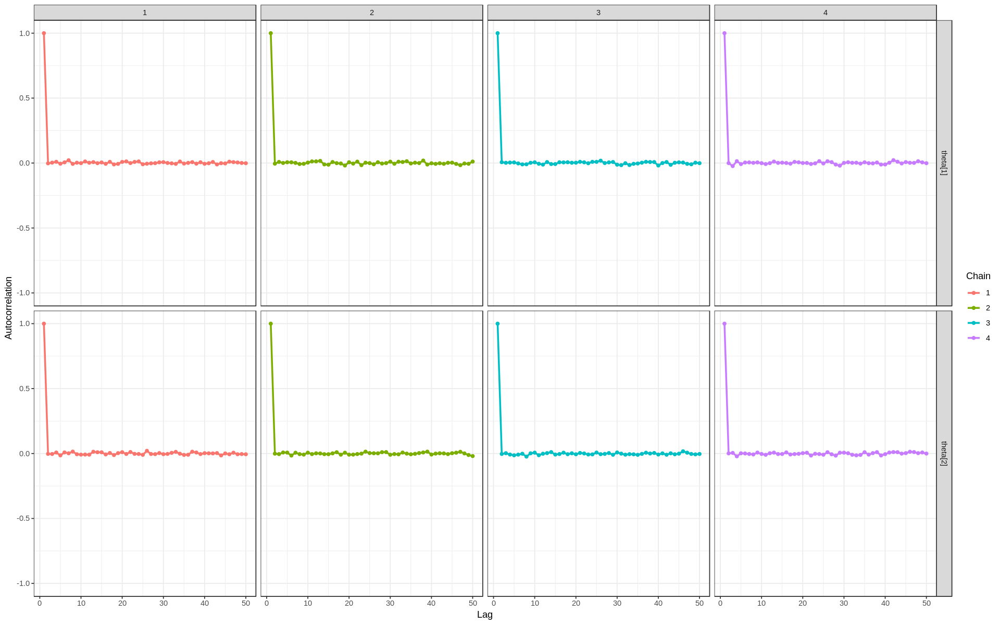

In [125]:
fig(16,10)
S <- ggs(codaSamples)
ggs_autocorrelationd(S)+geom_line(size=1)+geom_point()+ theme_bw() 

## Pfizer $65 \leq x \leq 75$

In [126]:
tot_Comirnaty_vacc6575    <- 3074

tot_Comirnaty_plac6575    <- 3880


patient <- c(rep("vaccine",tot_Comirnaty_vacc6575),
             rep("placebo",tot_Comirnaty_vacc6575))
positive_Comirnaty_vacc6575  <- 1
positive_Comirnaty_plac6575 <- 14
tested <- c(rep("pos",positive_Comirnaty_vacc6575),
          rep("neg",tot_Comirnaty_vacc6575-positive_Comirnaty_vacc6575),
          rep("pos",positive_Comirnaty_vacc6575),
          rep("neg",tot_Comirnaty_vacc6575-positive_Comirnaty_vacc6575))
Comirnaty_vacc6575.tb <- tibble (tested=tested , patient=patient)
datalist = list(tested= ifelse(Comirnaty_vacc6575.tb$tested == "neg",0,1),
               patient = as.integer(factor(Comirnaty_vacc6575.tb$patient)),               
               Ntot = nrow(Comirnaty_vacc6575.tb),
               Nclass = nlevels(factor(Comirnaty_vacc6575.tb$patient)))
jagsModelComirnaty_vacc6575 <- jags.model(file = "./jags_model_beta.txt",data=datalist,n.chain=4,n.adapt=500,quiet=TRUE)
update(jagsModelComirnaty_vacc6575,n.iter=500)


In [127]:
codaSamples <- coda.samples(jagsModelComirnaty_vacc6575, variable.names = c("theta"),n.iter = 15000)

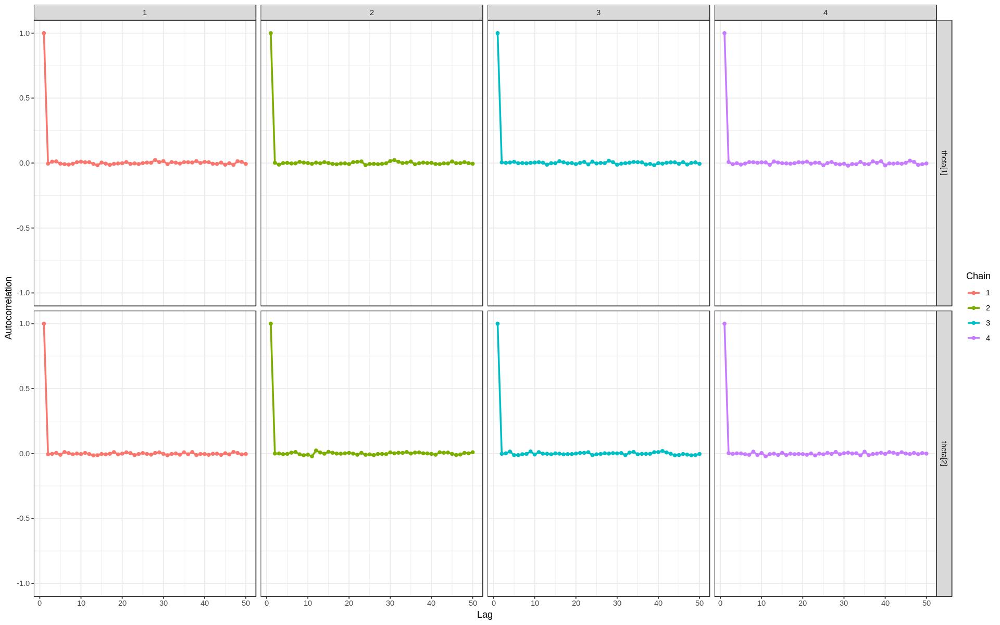

In [128]:
fig(16,10)
S <- ggs(codaSamples)
ggs_autocorrelationd(S)+geom_line(size=1)+geom_point()+ theme_bw() 

## Pfizer $>75$

In [129]:
tot_Comirnaty_vaccg75    <- 774

tot_Comirnaty_placg75    <- 785


patient <- c(rep("vaccine",tot_Comirnaty_vaccg75),
             rep("placebo",tot_Comirnaty_vaccg75))
positive_Comirnaty_vaccg75  <- 0
positive_Comirnaty_placg75 <- 5
tested <- c(rep("pos",positive_Comirnaty_vaccg75),
          rep("neg",tot_Comirnaty_vaccg75-positive_Comirnaty_vaccg75),
          rep("pos",positive_Comirnaty_vaccg75),
          rep("neg",tot_Comirnaty_vaccg75-positive_Comirnaty_vaccg75))
Comirnaty_vaccg75.tb <- tibble (tested=tested , patient=patient)
datalist = list(tested= ifelse(Comirnaty_vaccg75.tb$tested == "neg",0,1),
               patient = as.integer(factor(Comirnaty_vaccg75.tb$patient)),               
               Ntot = nrow(Comirnaty_vaccg75.tb),
               Nclass = nlevels(factor(Comirnaty_vaccg75.tb$patient)))
jagsModelComirnaty_vaccg75 <- jags.model(file = "./jags_model_beta.txt",data=datalist,n.chain=4,n.adapt=500,quiet=TRUE)
update(jagsModelComirnaty_vaccg75,n.iter=500)


In [130]:
codaSamples <- coda.samples(jagsModelComirnaty_vaccg75, variable.names = c("theta"),n.iter = 15000)

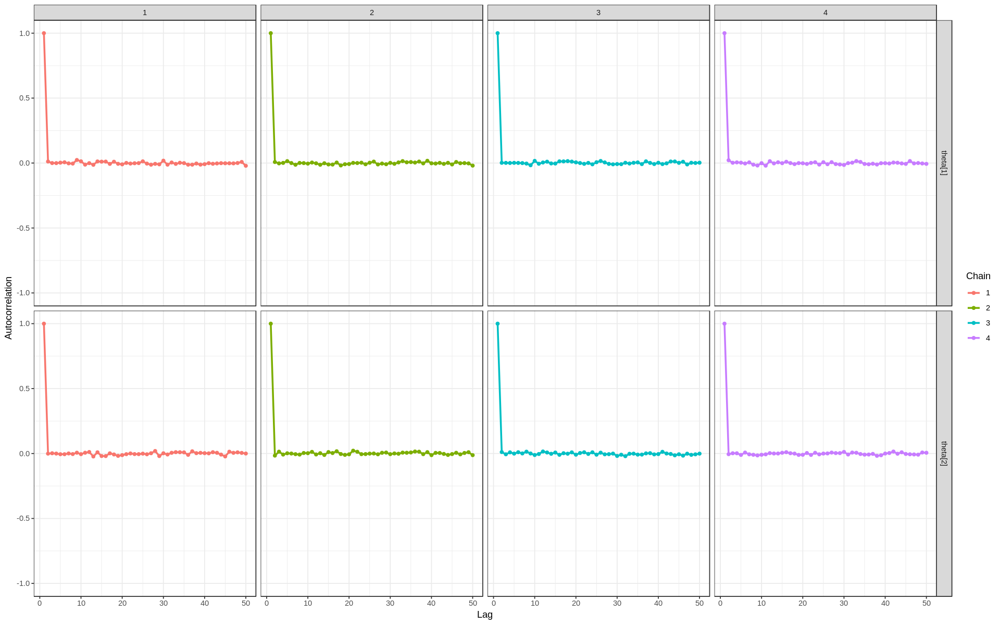

In [131]:
fig(16,10)
S <- ggs(codaSamples)
ggs_autocorrelationd(S)+geom_line(size=1)+geom_point()+ theme_bw() 

# Moderna age group

## Moderna $<65$

In [132]:
tot_Moderna_vaccl65    <- 10521

tot_Moderna_placl65    <- 10551


patient <- c(rep("vaccine",tot_Moderna_vaccl65),
             rep("placebo",tot_Moderna_placl65))
positive_Moderna_vaccl65  <- 156
positive_Moderna_placl65 <- 7
tested <- c(rep("pos",positive_Moderna_vaccl65),
          rep("neg",tot_Moderna_vaccl65-positive_Moderna_vaccl65),
          rep("pos",positive_Moderna_placl65),
          rep("neg",tot_Moderna_placl65-positive_Moderna_placl65))
Moderna_vaccl65.tb <- tibble (tested=tested , patient=patient)
datalist = list(tested= ifelse(Moderna_vaccl65.tb$tested == "neg",0,1),
               patient = as.integer(factor(Moderna_vaccl65.tb$patient)),               
               Ntot = nrow(Moderna_vaccl65.tb),
               Nclass = nlevels(factor(Comirnaty_vaccl65.tb$patient)))
jagsModelModerna_vaccl65 <- jags.model(file = "./jags_model_beta.txt",data=datalist,n.chain=4,n.adapt=500,quiet=TRUE)
update(jagsModelModerna_vaccl65,n.iter=500)


In [133]:
codaSamples <- coda.samples(jagsModelComirnaty_vaccl65, variable.names = c("theta"),n.iter = 15000)

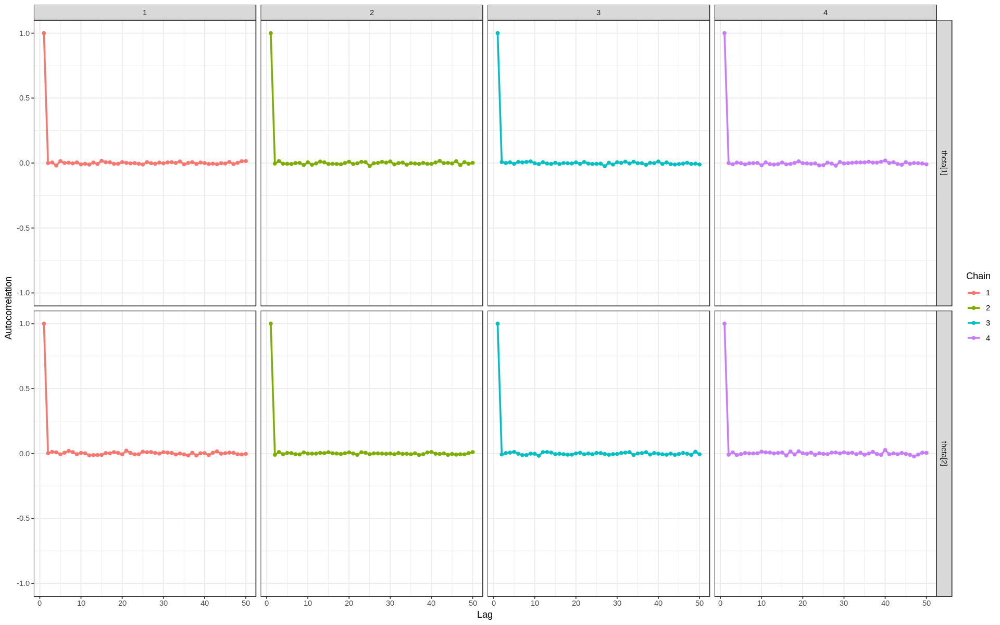

In [134]:
fig(16,10)
S <- ggs(codaSamples)
ggs_autocorrelationd(S)+geom_line(size=1)+geom_point()+ theme_bw() 

## Moderna $65 \leq x \leq 75$

In [135]:
tot_Moderna_vacc6575    <- 2953

tot_Moderna_plac6575    <- 2864


patient <- c(rep("vaccine",tot_Moderna_vacc6575),
             rep("placebo",tot_Moderna_plac6575))
positive_Moderna_vacc6575  <- 4
positive_Moderna_plac6575 <- 22
tested <- c(rep("pos",positive_Moderna_vacc6575),
          rep("neg",tot_Moderna_vacc6575-positive_Moderna_vacc6575),
          rep("pos",positive_Moderna_plac6575),
          rep("neg",tot_Moderna_plac6575-positive_Moderna_plac6575))
Moderna_vacc6575.tb <- tibble (tested=tested , patient=patient)
datalist = list(tested= ifelse(Moderna_vacc6575.tb$tested == "neg",0,1),
               patient = as.integer(factor(Moderna_vacc6575.tb$patient)),               
               Ntot = nrow(Moderna_vacc6575.tb),
               Nclass = nlevels(factor(Moderna_vacc6575.tb$patient)))
jagsModelModerna_vacc6575 <- jags.model(file = "./jags_model_beta.txt",data=datalist,n.chain=4,n.adapt=500,quiet=TRUE)
update(jagsModelModerna_vacc6575,n.iter=500)


In [136]:
codaSamples <- coda.samples(jagsModelComirnaty_vacc6575, variable.names = c("theta"),n.iter = 15000)

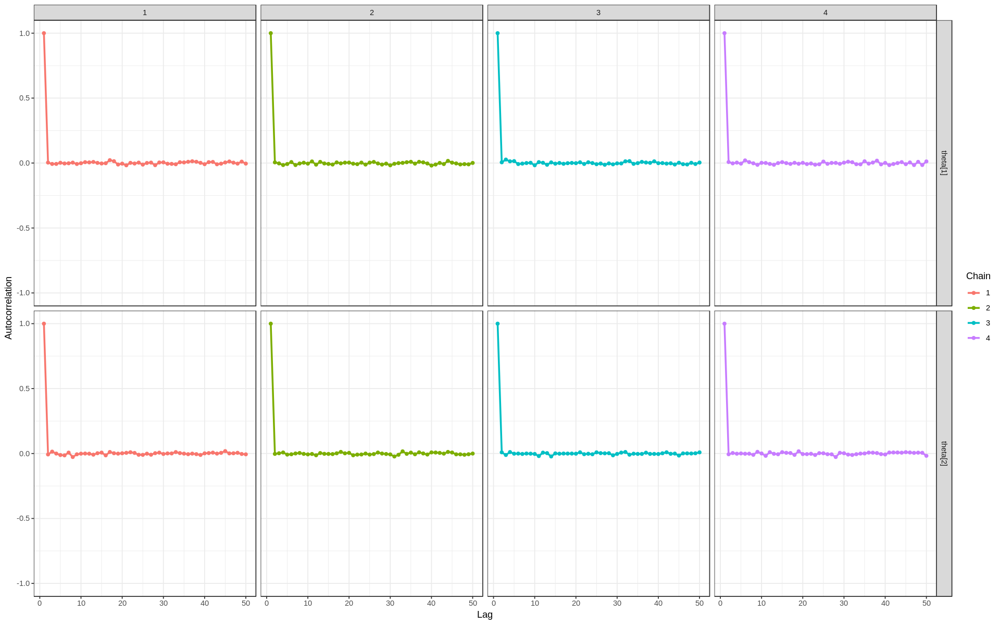

In [137]:
fig(16,10)
S <- ggs(codaSamples)
ggs_autocorrelationd(S)+geom_line(size=1)+geom_point()+ theme_bw() 

## Moderna $>75$

In [138]:
tot_Moderna_vaccg75    <- 630

tot_Moderna_placg75    <- 688


patient <- c(rep("vaccine",tot_Moderna_vaccg75),
             rep("placebo",tot_Moderna_placg75))
positive_Moderna_vaccg75  <- 0
positive_Moderna_placg75 <- 7
tested <- c(rep("pos",positive_Moderna_vaccg75),
          rep("neg",tot_Moderna_vaccg75-positive_Moderna_vaccg75),
          rep("pos",positive_Moderna_placg75),
          rep("neg",tot_Moderna_placg75-positive_Moderna_placg75))
Moderna_vaccg75.tb <- tibble (tested=tested , patient=patient)
datalist = list(tested= ifelse(Moderna_vaccg75.tb$tested == "neg",0,1),
               patient = as.integer(factor(Moderna_vaccg75.tb$patient)),               
               Ntot = nrow(Moderna_vaccg75.tb),
               Nclass = nlevels(factor(Moderna_vaccg75.tb$patient)))
jagsModelModerna_vaccg75 <- jags.model(file = "./jags_model_beta.txt",data=datalist,n.chain=4,n.adapt=500,quiet=TRUE)
update(jagsModelModerna_vaccg75,n.iter=500)

In [139]:
codaSamples <- coda.samples(jagsModelComirnaty_vaccg75, variable.names = c("theta"),n.iter = 15000)

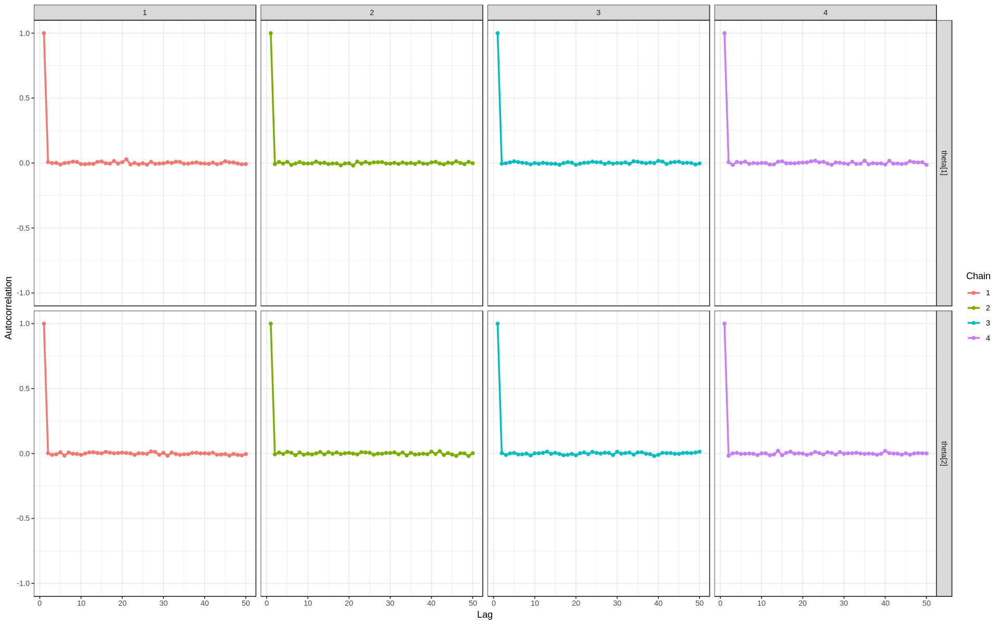

In [140]:
fig(16,10)
S <- ggs(codaSamples)
ggs_autocorrelationd(S)+geom_line(size=1)+geom_point()+ theme_bw() 

Some graphical function:

In [1]:
fig <- function(width, heigth){
     options(repr.plot.width = width, repr.plot.height = heigth)
}

In [2]:
ac <- function(x, nLags) {
  X <- matrix(NA, ncol=nLags, nrow=length(x))
  X[,1] <- x
  for (i in 2:nLags) {
    X[,i] <- c(rep(NA, i-1), x[1:(length(x)-i+1)])
  }
  X <- data.frame(Lag=1:nLags, Autocorrelation=cor(X, use="pairwise.complete.obs")[,1])
  return(X)
}


ggs_autocorrelationd <- function(D, nLags=50) {
  # Manage subsetting a family of parameters
  
  nIter <- attr(D, 'nIteration')

  wc.ac <- D %>%
    dplyr::group_by(Parameter, Chain) %>%
    dplyr::do(ac(.$value, nLags))

  # Manage multiple chains
  if (attributes(D)$nChains <= 1) {
    f <- ggplot(wc.ac, aes(x=Lag, y=Autocorrelation)) + ylim(-1, 1)
    f <- f + facet_wrap(~ Parameter, labeller = label_parsed)
    }
   else {
    f <- ggplot(wc.ac, aes(x=Lag, y=Autocorrelation, colour=as.factor(Chain), )) + 
       ylim(-1, 1) + scale_fill_discrete(name="Chain") + scale_colour_discrete(name="Chain")

      f <- f + facet_grid(Parameter ~ Chain)
       f + facet_wrap(~ Parameter, labeller = label_parsed)
  }

 return(f)
}